## rMZR color-coded by $\Sigma_{\rm SFR}$

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/2909121882.py:284: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])


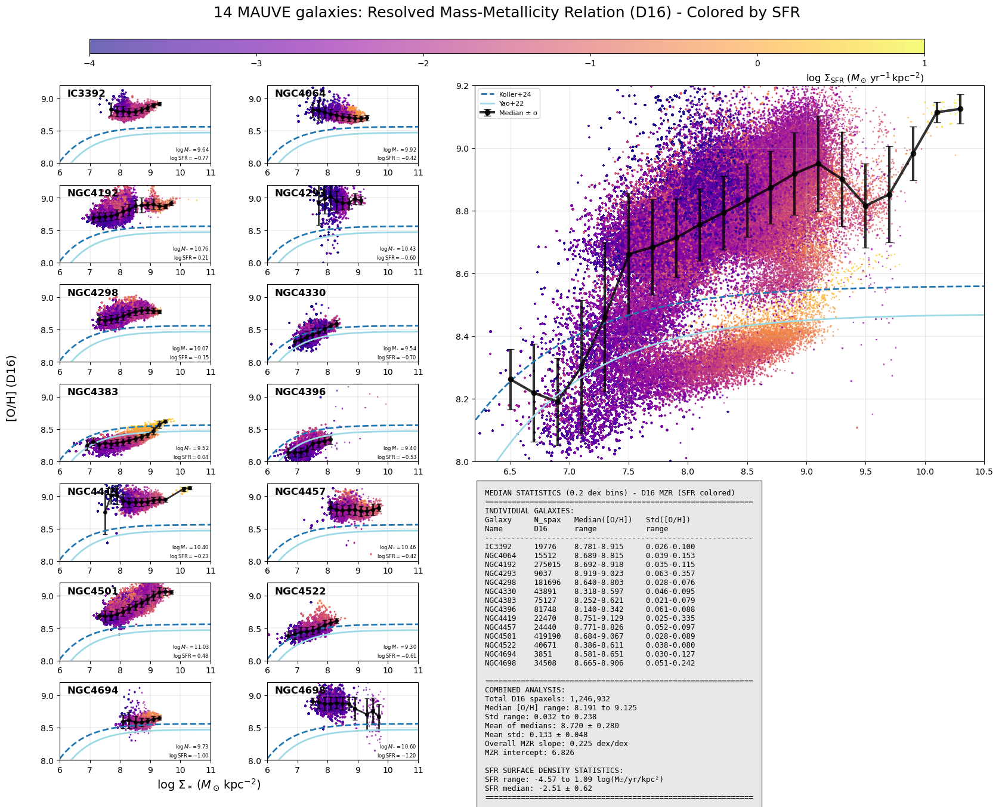

In [1]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (D16 MZR - SFR colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
        oh_d16 = h['O_H_D16_SF'].data
    return sigM, sigSFR, oh_d16

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

def plot_literature_mzr_fits(ax, show_legend=False):
    """Plot literature MZR fits on the given axis"""
    # Define x range for plotting literature fits
    x = np.linspace(6, 11, 100)
    
    # Yao+22
    # 12 + log(O/H) = a + b(log Σ* - c)e^(-(x-c))
    # Coefficients: a = 8.47, b = 0.0002, c = 12.36
    a1, b1, c1 = 8.47, 0.0002, 12.36
    y_yao22 = a1 + b1 * (x - c1) * np.exp(-(x - c1))

    # Koller+24
    # 12 + log(O/H) = a + b(log Σ* - c)exp(-(log Σ* - c))
    # Coefficients: a = 8.561, b = 0.0001, c = 12.7
    a2, b2, c2 = 8.561, 0.0001, 12.7
    y_koller24 = a2 + b2 * (x - c2) * np.exp(-(x - c2))

    # MZR literature data
    plot_data = [
        (y_koller24, 'Koller+24', '--'),
        (y_yao22, 'Yao+22', '-'),
    ]
    
    # Plot all literature fits
    colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
    for i, (y, label, linestyle) in enumerate(plot_data):
        if show_legend:
            ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color=colors[i])
        else:
            ax.plot(x, y, linewidth=2, linestyle=linestyle, color=colors[i])

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
scatter_for_cbar = None
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, oh_d16 = load_maps(gal)
    
    good_d16 = np.isfinite(sigM) & np.isfinite(oh_d16) & np.isfinite(sigSFR)
    
    if not np.any(good_d16):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    x_d16, y_d16, sfr_d16 = sigM[good_d16], oh_d16[good_d16], sigSFR[good_d16]
    
    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_d16, y_d16)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_d16)))
    
    # Scatter plot colored by SFR surface density
    scatter = axP.scatter(x_d16, y_d16, c=sfr_d16, s=1, alpha=0.6, marker=',', 
                         cmap='plasma', vmin=-4, vmax=1)
    
    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
    
    if scatter_for_cbar is None:
        scatter_for_cbar = scatter
    
    # Add literature fits to individual panels (no legend)
    plot_literature_mzr_fits(axP, show_legend=False)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(6, 11)
    axP.set_ylim(8.0, 9.2)
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_sfr = [], [], []
galaxy_counts = {}

for gal in galaxies:
    sigM, sigSFR, oh_d16 = load_maps(gal)
    good_d16 = np.isfinite(sigM) & np.isfinite(oh_d16) & np.isfinite(sigSFR)
    
    if np.any(good_d16):
        x_d16, y_d16, sfr_d16 = sigM[good_d16], oh_d16[good_d16], sigSFR[good_d16]
        all_x.extend(x_d16)
        all_y.extend(y_d16)
        all_sfr.extend(sfr_d16)
        galaxy_counts[gal] = len(x_d16)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_sfr = np.array(all_x), np.array(all_y), np.array(all_sfr)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by SFR surface density for combined data
scatter_combined = ax_combined.scatter(all_x, all_y, c=all_sfr, s=1, alpha=0.6, marker=',', 
                                      cmap='plasma', vmin=-4, vmax=1)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
                        fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

# Add literature fits to combined panel (with legend)
plot_literature_mzr_fits(ax_combined, show_legend=True)

# Add legend with small font
ax_combined.legend(fontsize=8, ncol=1, loc='upper left')

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(8.0, 9.2)
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - D16 MZR (SFR colored)\n"
stats_table += "="*60 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median([O/H])':<15} {'Std([O/H])':<15}\n"
stats_table += f"{'Name':<10} {'D16':<8} {'range':<15} {'range':<15}\n"
stats_table += "-"*60 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<15} {std_range:<15}\n"

stats_table += "\n" + "="*60 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total D16 spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median [O/H] range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"
    
    # Calculate overall metallicity gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall MZR slope: {slope:.3f} dex/dex\n"
        stats_table += f"MZR intercept: {intercept:.3f}\n"

# Add SFR statistics
stats_table += f"\nSFR SURFACE DENSITY STATISTICS:\n"
stats_table += f"SFR range: {all_sfr.min():.2f} to {all_sfr.max():.2f} log(M☉/yr/kpc²)\n"
stats_table += f"SFR median: {np.median(all_sfr):.2f} ± {np.std(all_sfr):.2f}\n"
        
stats_table += "="*60

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=9, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Add horizontal colorbar at the top
if scatter_for_cbar is not None:
    cbar_ax = fig.add_axes([0.15, 0.85, 0.7, 0.015])
    cbar = plt.colorbar(scatter_for_cbar, cax=cbar_ax, orientation='horizontal')
    cbar.set_label(r'$\log\,\Sigma_{\mathrm{SFR}} \; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=12, loc='right')

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass-Metallicity Relation (D16) - Colored by SFR', 
             fontsize=18, y=0.90)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'[O/H] (D16)', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/3750762161.py:284: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])


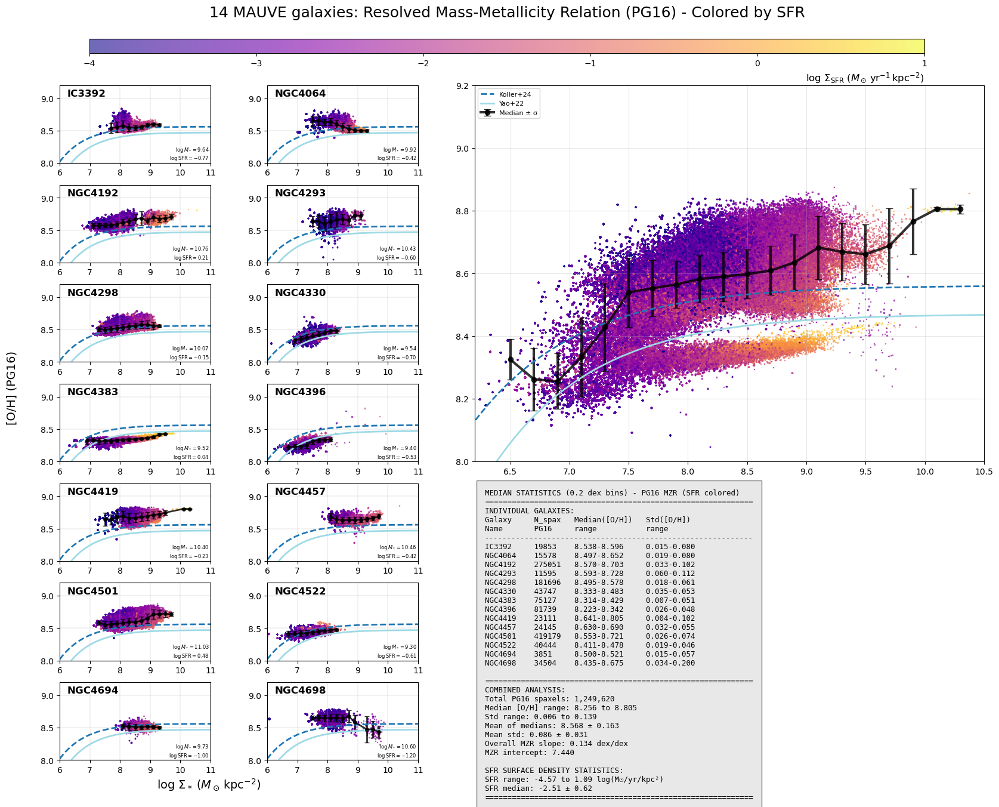

In [2]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (PG16 MZR - SFR colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
        oh_pg16 = h['O_H_PG16_SF'].data
    return sigM, sigSFR, oh_pg16

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

def plot_literature_mzr_fits(ax, show_legend=False):
    """Plot literature MZR fits on the given axis"""
    # Define x range for plotting literature fits
    x = np.linspace(6, 11, 100)
    
    # Yao+22
    # 12 + log(O/H) = a + b(log Σ* - c)e^(-(x-c))
    # Coefficients: a = 8.47, b = 0.0002, c = 12.36
    a1, b1, c1 = 8.47, 0.0002, 12.36
    y_yao22 = a1 + b1 * (x - c1) * np.exp(-(x - c1))

    # Koller+24
    # 12 + log(O/H) = a + b(log Σ* - c)exp(-(log Σ* - c))
    # Coefficients: a = 8.561, b = 0.0001, c = 12.7
    a2, b2, c2 = 8.561, 0.0001, 12.7
    y_koller24 = a2 + b2 * (x - c2) * np.exp(-(x - c2))

    # MZR literature data
    plot_data = [
        (y_koller24, 'Koller+24', '--'),
        (y_yao22, 'Yao+22', '-'),
    ]
    
    # Plot all literature fits
    colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
    for i, (y, label, linestyle) in enumerate(plot_data):
        if show_legend:
            ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color=colors[i])
        else:
            ax.plot(x, y, linewidth=2, linestyle=linestyle, color=colors[i])

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
scatter_for_cbar = None
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, oh_pg16 = load_maps(gal)
    
    good_pg16 = np.isfinite(sigM) & np.isfinite(oh_pg16) & np.isfinite(sigSFR)
    
    if not np.any(good_pg16):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    x_pg16, y_pg16, sfr_pg16 = sigM[good_pg16], oh_pg16[good_pg16], sigSFR[good_pg16]
    
    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_pg16, y_pg16)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_pg16)))
    
    # Scatter plot colored by SFR surface density
    scatter = axP.scatter(x_pg16, y_pg16, c=sfr_pg16, s=1, alpha=0.6, marker=',', 
                         cmap='plasma', vmin=-4, vmax=1)
    
    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
    
    if scatter_for_cbar is None:
        scatter_for_cbar = scatter
    
    # Add literature fits to individual panels (no legend)
    plot_literature_mzr_fits(axP, show_legend=False)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(6, 11)
    axP.set_ylim(8.0, 9.2)
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_sfr = [], [], []
galaxy_counts = {}

for gal in galaxies:
    sigM, sigSFR, oh_pg16 = load_maps(gal)
    good_pg16 = np.isfinite(sigM) & np.isfinite(oh_pg16) & np.isfinite(sigSFR)
    
    if np.any(good_pg16):
        x_pg16, y_pg16, sfr_pg16 = sigM[good_pg16], oh_pg16[good_pg16], sigSFR[good_pg16]
        all_x.extend(x_pg16)
        all_y.extend(y_pg16)
        all_sfr.extend(sfr_pg16)
        galaxy_counts[gal] = len(x_pg16)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_sfr = np.array(all_x), np.array(all_y), np.array(all_sfr)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by SFR surface density for combined data
scatter_combined = ax_combined.scatter(all_x, all_y, c=all_sfr, s=1, alpha=0.6, marker=',', 
                                      cmap='plasma', vmin=-4, vmax=1)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
                        fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

# Add literature fits to combined panel (with legend)
plot_literature_mzr_fits(ax_combined, show_legend=True)

# Add legend with small font
ax_combined.legend(fontsize=8, ncol=1, loc='upper left')

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(8.0, 9.2)
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - PG16 MZR (SFR colored)\n"
stats_table += "="*60 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median([O/H])':<15} {'Std([O/H])':<15}\n"
stats_table += f"{'Name':<10} {'PG16':<8} {'range':<15} {'range':<15}\n"
stats_table += "-"*60 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<15} {std_range:<15}\n"

stats_table += "\n" + "="*60 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total PG16 spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median [O/H] range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"
    
    # Calculate overall metallicity gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall MZR slope: {slope:.3f} dex/dex\n"
        stats_table += f"MZR intercept: {intercept:.3f}\n"

# Add SFR statistics
stats_table += f"\nSFR SURFACE DENSITY STATISTICS:\n"
stats_table += f"SFR range: {all_sfr.min():.2f} to {all_sfr.max():.2f} log(M☉/yr/kpc²)\n"
stats_table += f"SFR median: {np.median(all_sfr):.2f} ± {np.std(all_sfr):.2f}\n"
        
stats_table += "="*60

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=9, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Add horizontal colorbar at the top
if scatter_for_cbar is not None:
    cbar_ax = fig.add_axes([0.15, 0.85, 0.7, 0.015])
    cbar = plt.colorbar(scatter_for_cbar, cax=cbar_ax, orientation='horizontal')
    cbar.set_label(r'$\log\,\Sigma_{\mathrm{SFR}} \; (M_\odot\,\mathrm{yr}^{-1}\,\mathrm{kpc}^{-2})$', fontsize=12, loc='right')

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass-Metallicity Relation (PG16) - Colored by SFR', 
             fontsize=18, y=0.90)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'[O/H] (PG16)', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()

## rMZR color-coded by individual galaxy 

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/370215213.py:147: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = axP.scatter(x_d16, y_d16, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/370215213.py:204: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
/var/fol

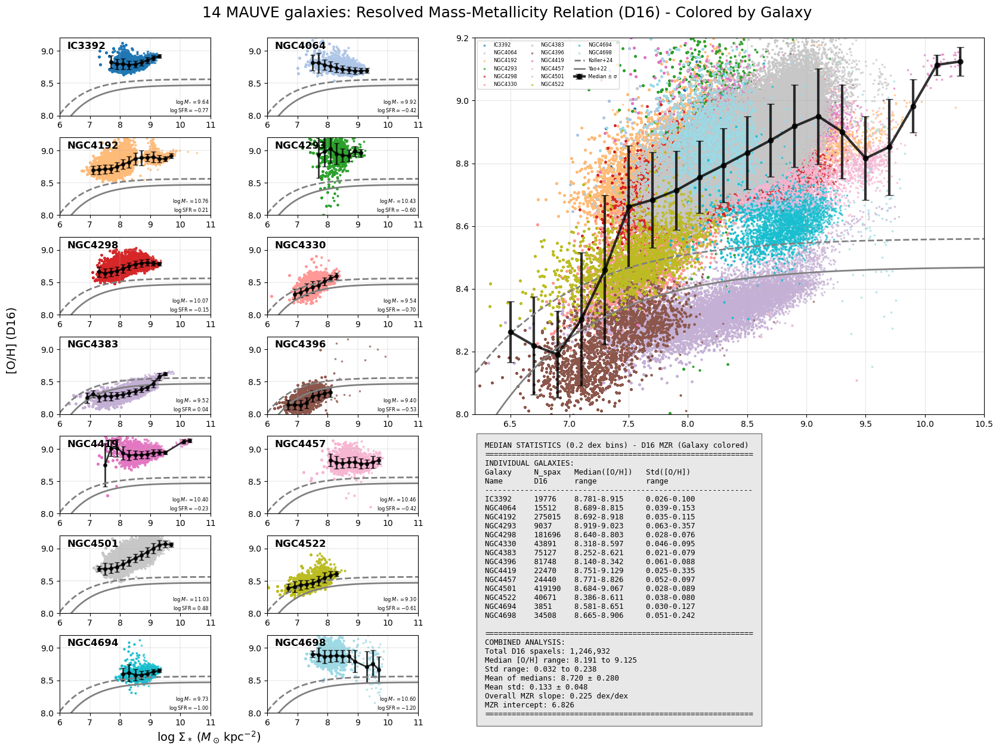

In [3]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (D16 MZR - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
        oh_d16 = h['O_H_D16_SF'].data
    return sigM, sigSFR, oh_d16

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

def plot_literature_mzr_fits(ax, show_legend=False):
    """Plot literature MZR fits on the given axis"""
    # Define x range for plotting literature fits
    x = np.linspace(6, 11, 100)
    
    # Yao+22
    # 12 + log(O/H) = a + b(log Σ* - c)e^(-(x-c))
    # Coefficients: a = 8.47, b = 0.0002, c = 12.36
    a1, b1, c1 = 8.47, 0.0002, 12.36
    y_yao22 = a1 + b1 * (x - c1) * np.exp(-(x - c1))

    # Koller+24
    # 12 + log(O/H) = a + b(log Σ* - c)exp(-(log Σ* - c))
    # Coefficients: a = 8.561, b = 0.0001, c = 12.7
    a2, b2, c2 = 8.561, 0.0001, 12.7
    y_koller24 = a2 + b2 * (x - c2) * np.exp(-(x - c2))

    # MZR literature data
    plot_data = [
        (y_koller24, 'Koller+24', '--'),
        (y_yao22, 'Yao+22', '-'),
    ]
    
    # Plot all literature fits
    colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
    for i, (y, label, linestyle) in enumerate(plot_data):
        if show_legend:
            ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color='gray')
        else:
            ax.plot(x, y, linewidth=2, linestyle=linestyle, color='gray')

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, oh_d16 = load_maps(gal)
    
    good_d16 = np.isfinite(sigM) & np.isfinite(oh_d16) & np.isfinite(sigSFR)
    
    if not np.any(good_d16):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    x_d16, y_d16, sfr_d16 = sigM[good_d16], oh_d16[good_d16], sigSFR[good_d16]
    
    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_d16, y_d16)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_d16)))
    
    # Scatter plot colored by galaxy
    scatter = axP.scatter(x_d16, y_d16, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
    
    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
    
    # Add literature fits to individual panels (no legend)
    plot_literature_mzr_fits(axP, show_legend=False)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(6, 11)
    axP.set_ylim(8.0, 9.2)
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, oh_d16 = load_maps(gal)
    good_d16 = np.isfinite(sigM) & np.isfinite(oh_d16) & np.isfinite(sigSFR)
    
    if np.any(good_d16):
        x_d16, y_d16 = sigM[good_d16], oh_d16[good_d16]
        all_x.extend(x_d16)
        all_y.extend(y_d16)
        all_gal_ids.extend([idx] * len(x_d16))  # Store galaxy index for coloring
        galaxy_counts[gal] = len(x_d16)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal], 
                           s=1, alpha=0.6, marker=',', label=gal)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
                        fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

# Add literature fits to combined panel (with legend)
plot_literature_mzr_fits(ax_combined, show_legend=True)

# Add legend with small font - only show galaxies
ax_combined.legend(fontsize=6, ncol=3, loc='upper left', markerscale=1)

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(8.0, 9.2)
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - D16 MZR (Galaxy colored)\n"
stats_table += "="*60 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median([O/H])':<15} {'Std([O/H])':<15}\n"
stats_table += f"{'Name':<10} {'D16':<8} {'range':<15} {'range':<15}\n"
stats_table += "-"*60 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<15} {std_range:<15}\n"

stats_table += "\n" + "="*60 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total D16 spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median [O/H] range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"
    
    # Calculate overall metallicity gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall MZR slope: {slope:.3f} dex/dex\n"
        stats_table += f"MZR intercept: {intercept:.3f}\n"
        
stats_table += "="*60

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=9, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass-Metallicity Relation (D16) - Colored by Galaxy', 
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'[O/H] (D16)', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/848870416.py:147: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = axP.scatter(x_pg16, y_pg16, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/848870416.py:204: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
/var/f

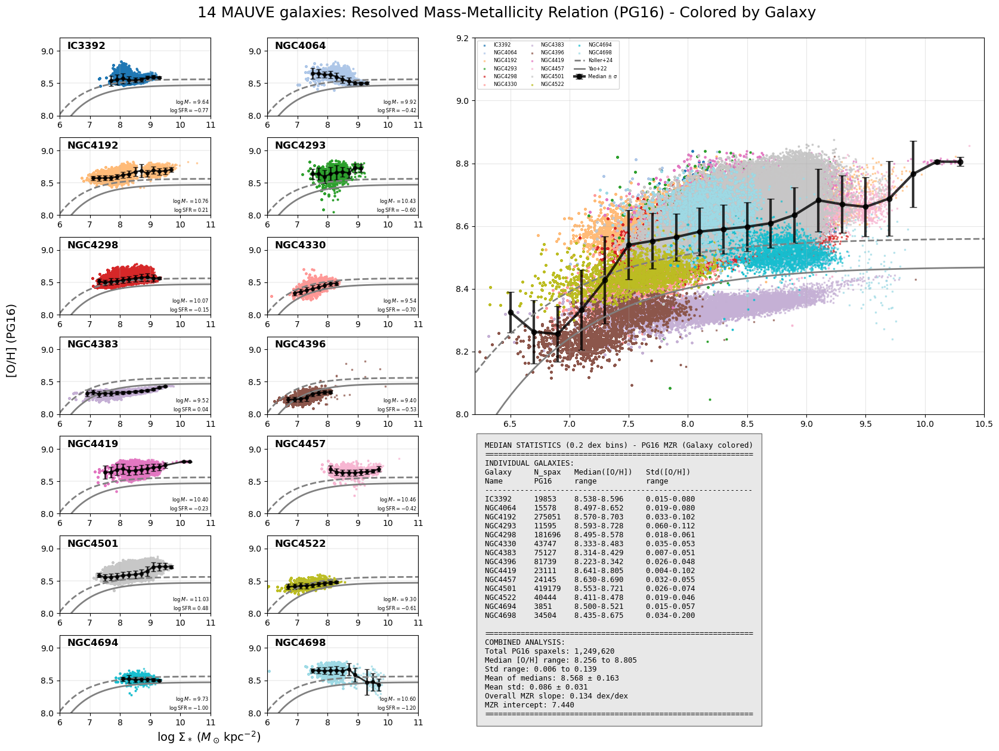

In [4]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (PG16 MZR - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
        oh_pg16 = h['O_H_PG16_SF'].data
    return sigM, sigSFR, oh_pg16

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

def plot_literature_mzr_fits(ax, show_legend=False):
    """Plot literature MZR fits on the given axis"""
    # Define x range for plotting literature fits
    x = np.linspace(6, 11, 100)
    
    # Yao+22
    # 12 + log(O/H) = a + b(log Σ* - c)e^(-(x-c))
    # Coefficients: a = 8.47, b = 0.0002, c = 12.36
    a1, b1, c1 = 8.47, 0.0002, 12.36
    y_yao22 = a1 + b1 * (x - c1) * np.exp(-(x - c1))

    # Koller+24
    # 12 + log(O/H) = a + b(log Σ* - c)exp(-(log Σ* - c))
    # Coefficients: a = 8.561, b = 0.0001, c = 12.7
    a2, b2, c2 = 8.561, 0.0001, 12.7
    y_koller24 = a2 + b2 * (x - c2) * np.exp(-(x - c2))

    # MZR literature data
    plot_data = [
        (y_koller24, 'Koller+24', '--'),
        (y_yao22, 'Yao+22', '-'),
    ]
    
    # Plot all literature fits
    colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
    for i, (y, label, linestyle) in enumerate(plot_data):
        if show_legend:
            ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color='gray')
        else:
            ax.plot(x, y, linewidth=2, linestyle=linestyle, color='gray')

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, oh_pg16 = load_maps(gal)
    
    good_pg16 = np.isfinite(sigM) & np.isfinite(oh_pg16) & np.isfinite(sigSFR)
    
    if not np.any(good_pg16):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    x_pg16, y_pg16, sfr_pg16 = sigM[good_pg16], oh_pg16[good_pg16], sigSFR[good_pg16]
    
    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_pg16, y_pg16)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_pg16)))
    
    # Scatter plot colored by galaxy
    scatter = axP.scatter(x_pg16, y_pg16, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
    
    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
    
    # Add literature fits to individual panels (no legend)
    plot_literature_mzr_fits(axP, show_legend=False)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(6, 11)
    axP.set_ylim(8.0, 9.2)
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, oh_pg16 = load_maps(gal)
    good_pg16 = np.isfinite(sigM) & np.isfinite(oh_pg16) & np.isfinite(sigSFR)
    
    if np.any(good_pg16):
        x_pg16, y_pg16 = sigM[good_pg16], oh_pg16[good_pg16]
        all_x.extend(x_pg16)
        all_y.extend(y_pg16)
        all_gal_ids.extend([idx] * len(x_pg16))  # Store galaxy index for coloring
        galaxy_counts[gal] = len(x_pg16)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal], 
                           s=1, alpha=0.6, marker=',', label=gal)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
                        fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

# Add literature fits to combined panel (with legend)
plot_literature_mzr_fits(ax_combined, show_legend=True)

# Add legend with small font - only show galaxies
ax_combined.legend(fontsize=6, ncol=3, loc='upper left', markerscale=1)

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(8.0, 9.2)
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - PG16 MZR (Galaxy colored)\n"
stats_table += "="*60 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median([O/H])':<15} {'Std([O/H])':<15}\n"
stats_table += f"{'Name':<10} {'PG16':<8} {'range':<15} {'range':<15}\n"
stats_table += "-"*60 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<15} {std_range:<15}\n"

stats_table += "\n" + "="*60 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total PG16 spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median [O/H] range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"
    
    # Calculate overall metallicity gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall MZR slope: {slope:.3f} dex/dex\n"
        stats_table += f"MZR intercept: {intercept:.3f}\n"
        
stats_table += "="*60

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=9, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass-Metallicity Relation (PG16) - Colored by Galaxy', 
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'[O/H] (PG16)', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/1947822204.py:176: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal],
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/1947822204.py:238: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
/var/folders/rm/clp89v210v32vh5v

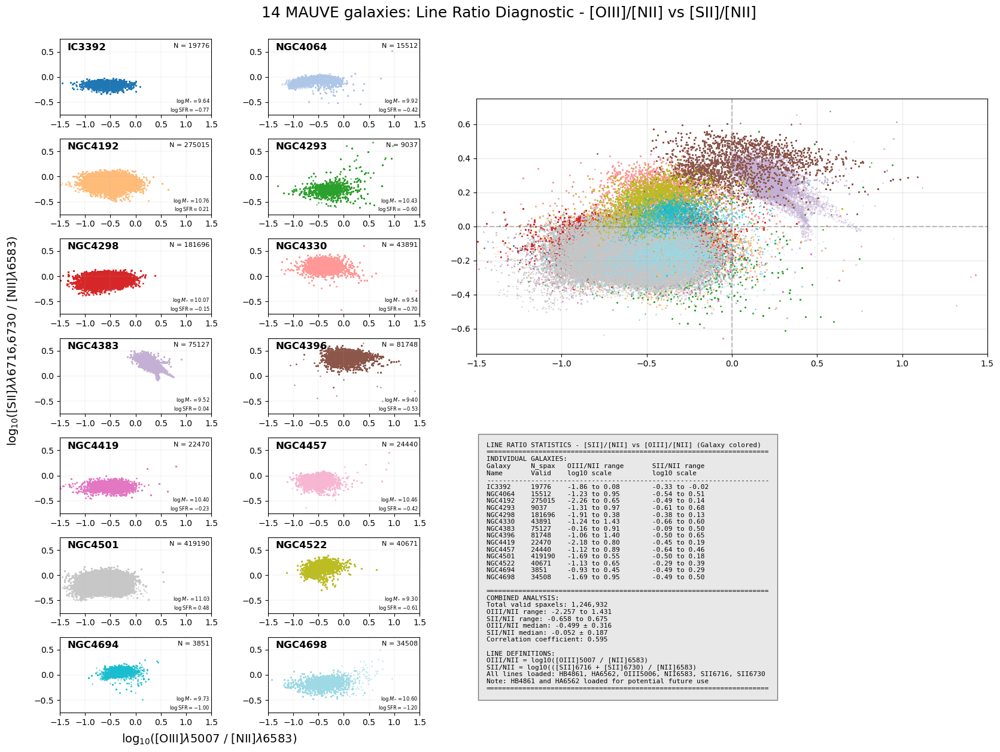

In [5]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (Line Ratios - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# SII/NII vs OIII/NII line ratio diagnostic plots
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_line_maps(gal):
    """Load emission line flux maps for line ratio calculations"""
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        # Load emission line fluxes
        hb4861_flux = h['HB4861_FLUX_corr'].data
        ha6562_flux = h['HA6562_FLUX_corr'].data
        oiii5006_flux = h['OIII5006_FLUX_corr'].data
        nii6583_flux = h['NII6583_FLUX_corr'].data
        sii6716_flux = h['SII6716_FLUX_corr'].data
        sii6730_flux = h['SII6730_FLUX_corr'].data

        # Load errors for quality control
        hb4861_err = h['HB4861_FLUX_ERR'].data
        ha6562_err = h['HA6562_FLUX_ERR'].data
        oiii5006_err = h['OIII5006_FLUX_ERR'].data
        nii6583_err = h['NII6583_FLUX_ERR'].data
        sii6716_err = h['SII6716_FLUX_ERR'].data
        sii6730_err = h['SII6730_FLUX_ERR'].data

        # Load valid O/H data to determine good spaxels
        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            # Fallback if this extension doesn't exist
            oh_d16_sf = None
        
    return (hb4861_flux, ha6562_flux, oiii5006_flux, nii6583_flux, sii6716_flux, sii6730_flux,
            hb4861_err, ha6562_err, oiii5006_err, nii6583_err, sii6716_err, sii6730_err, oh_d16_sf)

def calculate_line_ratios(hb4861, ha6562, oiii5006, nii6583, sii6716, sii6730, 
                         hb4861_err, ha6562_err, oiii5006_err, nii6583_err, sii6716_err, sii6730_err, oh_d16_sf):
    """Calculate line ratios using valid O/H regions"""
    
    # Use finite O/H values to determine valid spaxels
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        # Fallback: use basic finite checks on emission lines
        good_mask = (np.isfinite(hb4861) & np.isfinite(ha6562) & np.isfinite(oiii5006) & np.isfinite(nii6583) & 
                    np.isfinite(sii6716) & np.isfinite(sii6730) &
                    (hb4861 > 0) & (ha6562 > 0) & (oiii5006 > 0) & (nii6583 > 0) & 
                    (sii6716 > 0) & (sii6730 > 0))
    
    # Combine SII lines (6716 + 6730)
    sii_total = sii6716 + sii6730
    
    # Additional checks for positive fluxes where O/H is valid
    good_mask = good_mask & (hb4861 > 0) & (ha6562 > 0) & (oiii5006 > 0) & (nii6583 > 0) & (sii_total > 0)
    
    # Calculate ratios where good
    oiii_nii = np.full_like(oiii5006, np.nan)
    sii_nii = np.full_like(oiii5006, np.nan)
    
    oiii_nii[good_mask] = np.log10(oiii5006[good_mask] / nii6583[good_mask])
    sii_nii[good_mask] = np.log10(sii_total[good_mask] / nii6583[good_mask])
    
    return oiii_nii, sii_nii, good_mask

def calculate_median_statistics_2d(x, y, x_range=(-2, 2), y_range=(-2, 2), bin_width=0.2):
    """Calculate median and std in 2D binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    y_bins = np.arange(y_range[0], y_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    y_centers = (y_bins[:-1] + y_bins[1:]) / 2
    
    x_grid, y_grid = np.meshgrid(x_centers, y_centers)
    z_median = np.full_like(x_grid, np.nan)
    counts = np.zeros_like(x_grid, dtype=int)
    
    for i in range(len(x_bins) - 1):
        for j in range(len(y_bins) - 1):
            mask = ((x >= x_bins[i]) & (x < x_bins[i + 1]) & 
                   (y >= y_bins[j]) & (y < y_bins[j + 1]))
            count = np.sum(mask)
            counts[j, i] = count
            if count >= 5:  # Need at least 5 points for meaningful statistics
                z_median[j, i] = count
    
    return x_grid, y_grid, z_median, counts

# Extraction functions for log files (same as before)
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for title space
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    try:
        (hb4861, ha6562, oiii5006, nii6583, sii6716, sii6730, 
         hb4861_err, ha6562_err, oiii5006_err, nii6583_err, sii6716_err, sii6730_err, oh_d16_sf) = load_line_maps(gal)
        
        oiii_nii, sii_nii, good_mask = calculate_line_ratios(
            hb4861, ha6562, oiii5006, nii6583, sii6716, sii6730,
            hb4861_err, ha6562_err, oiii5006_err, nii6583_err, sii6716_err, sii6730_err, oh_d16_sf)
        
        if not np.any(good_mask):
            print(f"Skipping {gal}: no valid line ratio data points")
            continue
            
    except Exception as e:
        print(f"Error loading {gal}: {e}")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    x_data, y_data = oiii_nii[good_mask], sii_nii[good_mask]
    individual_stats.append((gal, len(x_data), x_data.min(), x_data.max(), 
                           y_data.min(), y_data.max()))
    
    # Scatter plot colored by galaxy
    scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], 
                         s=2, alpha=0.7, marker='.')
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', 
                                           alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    # Add number of valid spaxels
    axP.text(0.99, 0.95, f'N = {len(x_data)}', transform=axP.transAxes, 
             va='top', ha='right', fontsize=8,
             bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(-1.5, 1.5)
    axP.set_ylim(-0.75, 0.75)
    axP.set_aspect('equal')  # Make 1 unit in x equal to 1 unit in y
    axP.grid(True, lw=0.25, alpha=0.5)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    try:
        (hb4861, ha6562, oiii5006, nii6583, sii6716, sii6730, 
         hb4861_err, ha6562_err, oiii5006_err, nii6583_err, sii6716_err, sii6730_err, oh_d16_sf) = load_line_maps(gal)
        
        oiii_nii, sii_nii, good_mask = calculate_line_ratios(
            hb4861, ha6562, oiii5006, nii6583, sii6716, sii6730,
            hb4861_err, ha6562_err, oiii5006_err, nii6583_err, sii6716_err, sii6730_err, oh_d16_sf)
        
        if np.any(good_mask):
            x_data, y_data = oiii_nii[good_mask], sii_nii[good_mask]
            all_x.extend(x_data)
            all_y.extend(y_data)
            all_gal_ids.extend([idx] * len(x_data))
            galaxy_counts[gal] = len(x_data)
        else:
            galaxy_counts[gal] = 0
            
    except Exception as e:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal], 
                           s=1, alpha=0.6, marker='.', label=gal)

ax_combined.set_xlim(-1.5, 1.5)
ax_combined.set_ylim(-0.75, 0.75)
ax_combined.set_aspect('equal')  # Make 1 unit in x equal to 1 unit in y
ax_combined.grid(True, alpha=0.3)

# Add diagnostic region boundaries (optional - typical BPT-like boundaries)
# You can add theoretical or empirical boundaries here if needed
ax_combined.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
ax_combined.axvline(x=0, color='gray', linestyle='--', alpha=0.5)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "LINE RATIO STATISTICS - [SII]/[NII] vs [OIII]/[NII] (Galaxy colored)\n"
stats_table += "="*70 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'OIII/NII range':<20} {'SII/NII range':<20}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'log10 scale':<20} {'log10 scale':<20}\n"
stats_table += "-"*70 + "\n"

for gal, n_spax, x_min, x_max, y_min, y_max in individual_stats:
    oiii_range = f"{x_min:.2f} to {x_max:.2f}"
    sii_range = f"{y_min:.2f} to {y_max:.2f}"
    stats_table += f"{gal:<10} {n_spax:<8} {oiii_range:<20} {sii_range:<20}\n"

stats_table += "\n" + "="*70 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total valid spaxels: {len(all_x):,}\n"
if len(all_x) > 0:
    stats_table += f"OIII/NII range: {all_x.min():.3f} to {all_x.max():.3f}\n"
    stats_table += f"SII/NII range: {all_y.min():.3f} to {all_y.max():.3f}\n"
    stats_table += f"OIII/NII median: {np.median(all_x):.3f} ± {np.std(all_x):.3f}\n"
    stats_table += f"SII/NII median: {np.median(all_y):.3f} ± {np.std(all_y):.3f}\n"
    
    # Calculate correlation
    if len(all_x) > 10:
        correlation = np.corrcoef(all_x, all_y)[0, 1]
        stats_table += f"Correlation coefficient: {correlation:.3f}\n"

stats_table += "\nLINE DEFINITIONS:\n"
stats_table += "OIII/NII = log10([OIII]5007 / [NII]6583)\n"
stats_table += "SII/NII = log10(([SII]6716 + [SII]6730) / [NII]6583)\n"
stats_table += "All lines loaded: HB4861, HA6562, OIII5006, NII6583, SII6716, SII6730\n"
stats_table += "Note: HB4861 and HA6562 loaded for potential future use\n"
        
stats_table += "="*70

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=8, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Line Ratio Diagnostic - [OIII]/[NII] vs [SII]/[NII]', 
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'log$_{10}$([OIII]$\lambda$5007 / [NII]$\lambda$6583)', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'log$_{10}$([SII]$\lambda\lambda$6716,6730 / [NII]$\lambda$6583)', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/2276610886.py:176: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal],


/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/2276610886.py:238: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/2276610886.py:303: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])


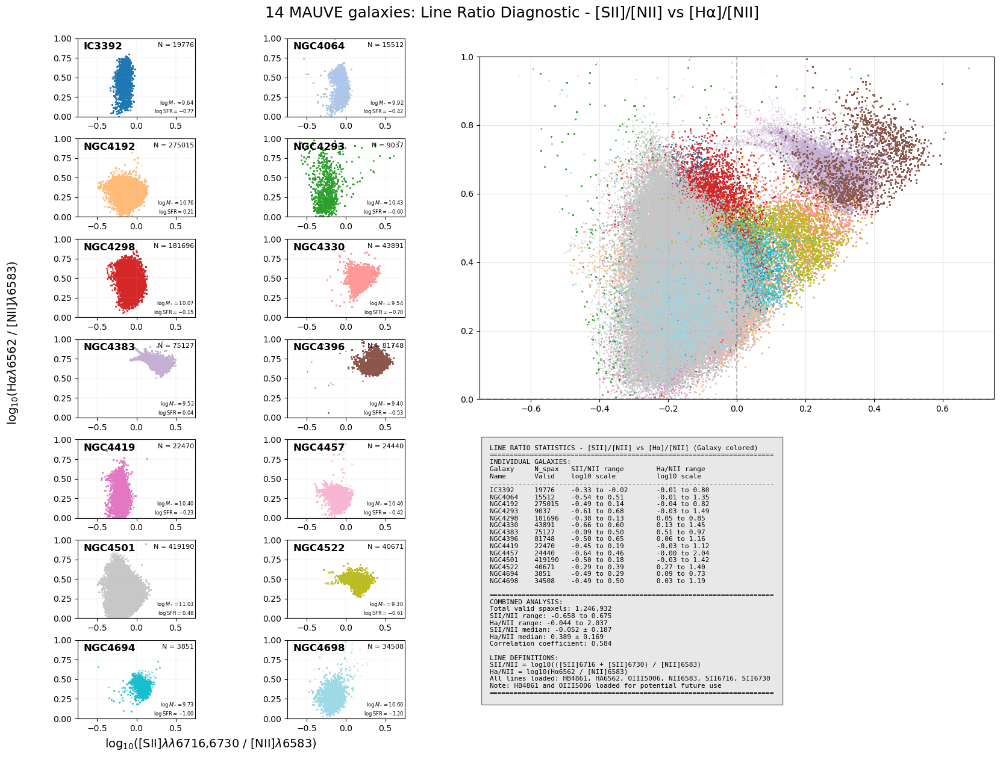

In [6]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (Line Ratios - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# [SII]/[NII] vs [Hα]/[NII] line ratio diagnostic plots
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_line_maps(gal):
    """Load emission line flux maps for line ratio calculations"""
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        # Load emission line fluxes
        hb4861_flux = h['HB4861_FLUX_corr'].data
        ha6562_flux = h['HA6562_FLUX_corr'].data
        oiii5006_flux = h['OIII5006_FLUX_corr'].data
        nii6583_flux = h['NII6583_FLUX_corr'].data
        sii6716_flux = h['SII6716_FLUX_corr'].data
        sii6730_flux = h['SII6730_FLUX_corr'].data

        # Load errors for quality control
        hb4861_err = h['HB4861_FLUX_ERR'].data
        ha6562_err = h['HA6562_FLUX_ERR'].data
        oiii5006_err = h['OIII5006_FLUX_ERR'].data
        nii6583_err = h['NII6583_FLUX_ERR'].data
        sii6716_err = h['SII6716_FLUX_ERR'].data
        sii6730_err = h['SII6730_FLUX_ERR'].data

        # Load valid O/H data to determine good spaxels
        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            # Fallback if this extension doesn't exist
            oh_d16_sf = None
        
    return (hb4861_flux, ha6562_flux, oiii5006_flux, nii6583_flux, sii6716_flux, sii6730_flux,
            hb4861_err, ha6562_err, oiii5006_err, nii6583_err, sii6716_err, sii6730_err, oh_d16_sf)

def calculate_line_ratios(hb4861, ha6562, oiii5006, nii6583, sii6716, sii6730, 
                         hb4861_err, ha6562_err, oiii5006_err, nii6583_err, sii6716_err, sii6730_err, oh_d16_sf):
    """Calculate line ratios using valid O/H regions"""
    
    # Use finite O/H values to determine valid spaxels
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        # Fallback: use basic finite checks on emission lines
        good_mask = (np.isfinite(hb4861) & np.isfinite(ha6562) & np.isfinite(oiii5006) & np.isfinite(nii6583) & 
                    np.isfinite(sii6716) & np.isfinite(sii6730) &
                    (hb4861 > 0) & (ha6562 > 0) & (oiii5006 > 0) & (nii6583 > 0) & 
                    (sii6716 > 0) & (sii6730 > 0))
    
    # Combine SII lines (6716 + 6730)
    sii_total = sii6716 + sii6730
    
    # Additional checks for positive fluxes where O/H is valid
    good_mask = good_mask & (hb4861 > 0) & (ha6562 > 0) & (oiii5006 > 0) & (nii6583 > 0) & (sii_total > 0)
    
    # Calculate ratios where good
    sii_nii = np.full_like(oiii5006, np.nan)
    ha_nii = np.full_like(oiii5006, np.nan)
    
    sii_nii[good_mask] = np.log10(sii_total[good_mask] / nii6583[good_mask])
    ha_nii[good_mask] = np.log10(ha6562[good_mask] / nii6583[good_mask])
    
    return sii_nii, ha_nii, good_mask

def calculate_median_statistics_2d(x, y, x_range=(-2, 2), y_range=(-2, 2), bin_width=0.2):
    """Calculate median and std in 2D binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    y_bins = np.arange(y_range[0], y_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    y_centers = (y_bins[:-1] + y_bins[1:]) / 2
    
    x_grid, y_grid = np.meshgrid(x_centers, y_centers)
    z_median = np.full_like(x_grid, np.nan)
    counts = np.zeros_like(x_grid, dtype=int)
    
    for i in range(len(x_bins) - 1):
        for j in range(len(y_bins) - 1):
            mask = ((x >= x_bins[i]) & (x < x_bins[i + 1]) & 
                   (y >= y_bins[j]) & (y < y_bins[j + 1]))
            count = np.sum(mask)
            counts[j, i] = count
            if count >= 5:  # Need at least 5 points for meaningful statistics
                z_median[j, i] = count
    
    return x_grid, y_grid, z_median, counts

# Extraction functions for log files (same as before)
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for title space
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    try:
        (hb4861, ha6562, oiii5006, nii6583, sii6716, sii6730, 
         hb4861_err, ha6562_err, oiii5006_err, nii6583_err, sii6716_err, sii6730_err, oh_d16_sf) = load_line_maps(gal)
        
        sii_nii, ha_nii, good_mask = calculate_line_ratios(
            hb4861, ha6562, oiii5006, nii6583, sii6716, sii6730,
            hb4861_err, ha6562_err, oiii5006_err, nii6583_err, sii6716_err, sii6730_err, oh_d16_sf)
        
        if not np.any(good_mask):
            print(f"Skipping {gal}: no valid line ratio data points")
            continue
            
    except Exception as e:
        print(f"Error loading {gal}: {e}")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    x_data, y_data = sii_nii[good_mask], ha_nii[good_mask]
    individual_stats.append((gal, len(x_data), x_data.min(), x_data.max(), 
                           y_data.min(), y_data.max()))
    
    # Scatter plot colored by galaxy
    scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], 
                         s=2, alpha=0.7, marker='.')
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', 
                                           alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    # Add number of valid spaxels
    axP.text(0.99, 0.95, f'N = {len(x_data)}', transform=axP.transAxes, 
             va='top', ha='right', fontsize=8,
             bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(-0.75, 0.75)
    axP.set_ylim(0, 1)
    axP.set_aspect('equal')  # Make 1 unit in x equal to 1 unit in y
    axP.grid(True, lw=0.25, alpha=0.5)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    try:
        (hb4861, ha6562, oiii5006, nii6583, sii6716, sii6730, 
         hb4861_err, ha6562_err, oiii5006_err, nii6583_err, sii6716_err, sii6730_err, oh_d16_sf) = load_line_maps(gal)
        
        sii_nii, ha_nii, good_mask = calculate_line_ratios(
            hb4861, ha6562, oiii5006, nii6583, sii6716, sii6730,
            hb4861_err, ha6562_err, oiii5006_err, nii6583_err, sii6716_err, sii6730_err, oh_d16_sf)
        
        if np.any(good_mask):
            x_data, y_data = sii_nii[good_mask], ha_nii[good_mask]
            all_x.extend(x_data)
            all_y.extend(y_data)
            all_gal_ids.extend([idx] * len(x_data))
            galaxy_counts[gal] = len(x_data)
        else:
            galaxy_counts[gal] = 0
            
    except Exception as e:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal], 
                           s=1, alpha=0.6, marker='.', label=gal)

ax_combined.set_xlim(-0.75, 0.75)
ax_combined.set_ylim(0, 1)
ax_combined.set_aspect('equal')  # Make 1 unit in x equal to 1 unit in y
ax_combined.grid(True, alpha=0.3)

# Add diagnostic region boundaries (optional)
ax_combined.axhline(y=0, color='gray', linestyle='--', alpha=0.5)
ax_combined.axvline(x=0, color='gray', linestyle='--', alpha=0.5)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "LINE RATIO STATISTICS - [SII]/[NII] vs [Hα]/[NII] (Galaxy colored)\n"
stats_table += "="*70 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'SII/NII range':<20} {'Ha/NII range':<20}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'log10 scale':<20} {'log10 scale':<20}\n"
stats_table += "-"*70 + "\n"

for gal, n_spax, x_min, x_max, y_min, y_max in individual_stats:
    sii_range = f"{x_min:.2f} to {x_max:.2f}"
    ha_range = f"{y_min:.2f} to {y_max:.2f}"
    stats_table += f"{gal:<10} {n_spax:<8} {sii_range:<20} {ha_range:<20}\n"

stats_table += "\n" + "="*70 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total valid spaxels: {len(all_x):,}\n"
if len(all_x) > 0:
    stats_table += f"SII/NII range: {all_x.min():.3f} to {all_x.max():.3f}\n"
    stats_table += f"Ha/NII range: {all_y.min():.3f} to {all_y.max():.3f}\n"
    stats_table += f"SII/NII median: {np.median(all_x):.3f} ± {np.std(all_x):.3f}\n"
    stats_table += f"Ha/NII median: {np.median(all_y):.3f} ± {np.std(all_y):.3f}\n"
    
    # Calculate correlation
    if len(all_x) > 10:
        correlation = np.corrcoef(all_x, all_y)[0, 1]
        stats_table += f"Correlation coefficient: {correlation:.3f}\n"

stats_table += "\nLINE DEFINITIONS:\n"
stats_table += "SII/NII = log10(([SII]6716 + [SII]6730) / [NII]6583)\n"
stats_table += "Ha/NII = log10(Hα6562 / [NII]6583)\n"
stats_table += "All lines loaded: HB4861, HA6562, OIII5006, NII6583, SII6716, SII6730\n"
stats_table += "Note: HB4861 and OIII5006 loaded for potential future use\n"
        
stats_table += "="*70

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=8, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Line Ratio Diagnostic - [SII]/[NII] vs [Hα]/[NII]', 
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'log$_{10}$([SII]$\lambda\lambda$6716,6730 / [NII]$\lambda$6583)', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'log$_{10}$(H$\alpha$$\lambda$6562 / [NII]$\lambda$6583)', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/3127333895.py:177: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal],
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/3127333895.py:241: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
/var/folders/rm/clp89v210v32vh5v

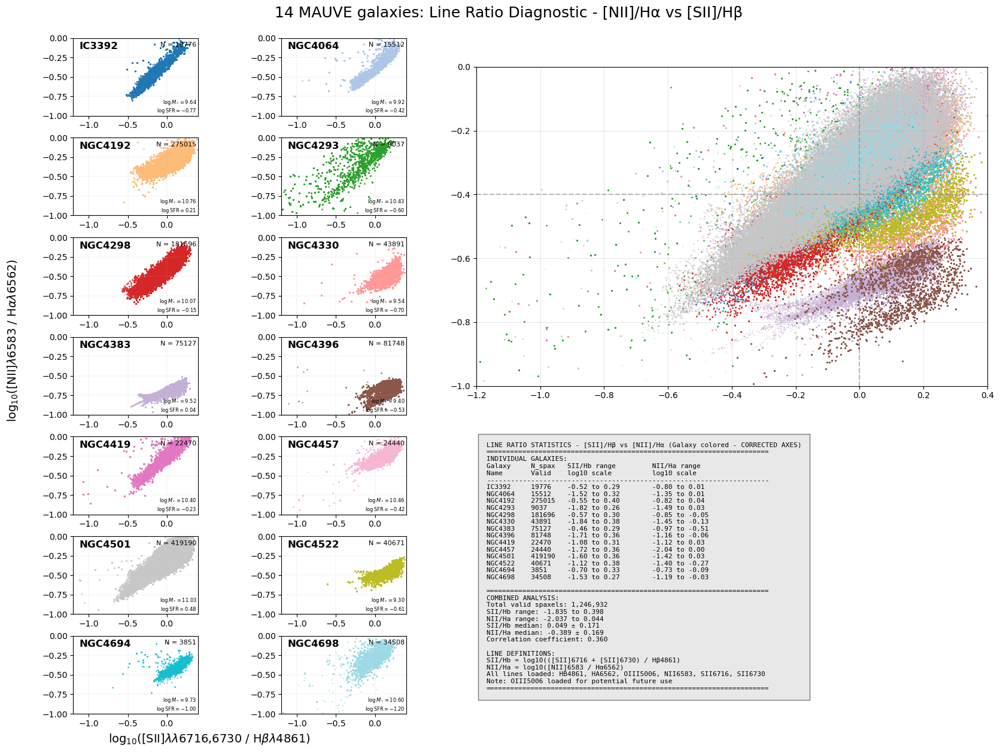

In [7]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (Line Ratios - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# [NII]/Hα vs [SII]/Hβ line ratio diagnostic plots
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_line_maps(gal):
    """Load emission line flux maps for line ratio calculations"""
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        # Load emission line fluxes
        hb4861_flux = h['HB4861_FLUX_corr'].data
        ha6562_flux = h['HA6562_FLUX_corr'].data
        oiii5006_flux = h['OIII5006_FLUX_corr'].data
        nii6583_flux = h['NII6583_FLUX_corr'].data
        sii6716_flux = h['SII6716_FLUX_corr'].data
        sii6730_flux = h['SII6730_FLUX_corr'].data

        # Load errors for quality control
        hb4861_err = h['HB4861_FLUX_ERR'].data
        ha6562_err = h['HA6562_FLUX_ERR'].data
        oiii5006_err = h['OIII5006_FLUX_ERR'].data
        nii6583_err = h['NII6583_FLUX_ERR'].data
        sii6716_err = h['SII6716_FLUX_ERR'].data
        sii6730_err = h['SII6730_FLUX_ERR'].data

        # Load valid O/H data to determine good spaxels
        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            # Fallback if this extension doesn't exist
            oh_d16_sf = None
        
    return (hb4861_flux, ha6562_flux, oiii5006_flux, nii6583_flux, sii6716_flux, sii6730_flux,
            hb4861_err, ha6562_err, oiii5006_err, nii6583_err, sii6716_err, sii6730_err, oh_d16_sf)

def calculate_line_ratios(hb4861, ha6562, oiii5006, nii6583, sii6716, sii6730, 
                         hb4861_err, ha6562_err, oiii5006_err, nii6583_err, sii6716_err, sii6730_err, oh_d16_sf):
    """Calculate line ratios using valid O/H regions"""
    
    # Use finite O/H values to determine valid spaxels
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        # Fallback: use basic finite checks on emission lines
        good_mask = (np.isfinite(hb4861) & np.isfinite(ha6562) & np.isfinite(oiii5006) & np.isfinite(nii6583) & 
                    np.isfinite(sii6716) & np.isfinite(sii6730) &
                    (hb4861 > 0) & (ha6562 > 0) & (oiii5006 > 0) & (nii6583 > 0) & 
                    (sii6716 > 0) & (sii6730 > 0))
    
    # Combine SII lines (6716 + 6730)
    sii_total = sii6716 + sii6730
    
    # Additional checks for positive fluxes where O/H is valid
    good_mask = good_mask & (hb4861 > 0) & (ha6562 > 0) & (nii6583 > 0) & (sii_total > 0)
    
    # Calculate ratios where good
    nii_ha = np.full_like(hb4861, np.nan)
    sii_hb = np.full_like(hb4861, np.nan)
    
    nii_ha[good_mask] = np.log10(nii6583[good_mask] / ha6562[good_mask])
    sii_hb[good_mask] = np.log10(sii_total[good_mask] / hb4861[good_mask])
    
    return nii_ha, sii_hb, good_mask

def calculate_median_statistics_2d(x, y, x_range=(-2, 2), y_range=(-2, 2), bin_width=0.2):
    """Calculate median and std in 2D binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    y_bins = np.arange(y_range[0], y_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    y_centers = (y_bins[:-1] + y_bins[1:]) / 2
    
    x_grid, y_grid = np.meshgrid(x_centers, y_centers)
    z_median = np.full_like(x_grid, np.nan)
    counts = np.zeros_like(x_grid, dtype=int)
    
    for i in range(len(x_bins) - 1):
        for j in range(len(y_bins) - 1):
            mask = ((x >= x_bins[i]) & (x < x_bins[i + 1]) & 
                   (y >= y_bins[j]) & (y < y_bins[j + 1]))
            count = np.sum(mask)
            counts[j, i] = count
            if count >= 5:  # Need at least 5 points for meaningful statistics
                z_median[j, i] = count
    
    return x_grid, y_grid, z_median, counts

# Extraction functions for log files (same as before)
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for title space
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    try:
        (hb4861, ha6562, oiii5006, nii6583, sii6716, sii6730, 
         hb4861_err, ha6562_err, oiii5006_err, nii6583_err, sii6716_err, sii6730_err, oh_d16_sf) = load_line_maps(gal)
        
        nii_ha, sii_hb, good_mask = calculate_line_ratios(
            hb4861, ha6562, oiii5006, nii6583, sii6716, sii6730,
            hb4861_err, ha6562_err, oiii5006_err, nii6583_err, sii6716_err, sii6730_err, oh_d16_sf)
        
        if not np.any(good_mask):
            print(f"Skipping {gal}: no valid line ratio data points")
            continue
            
    except Exception as e:
        print(f"Error loading {gal}: {e}")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    # CORRECTED: x_data is now SII/Hb, y_data is now NII/Ha
    x_data, y_data = sii_hb[good_mask], nii_ha[good_mask]
    individual_stats.append((gal, len(x_data), x_data.min(), x_data.max(), 
                           y_data.min(), y_data.max()))
    
    # Scatter plot colored by galaxy
    scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], 
                         s=2, alpha=0.7, marker='.')
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', 
                                           alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    # Add number of valid spaxels
    axP.text(0.99, 0.95, f'N = {len(x_data)}', transform=axP.transAxes, 
             va='top', ha='right', fontsize=8,
             bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    # CORRECTED axis limits
    axP.set_xlim(-1.2, 0.4)  # SII/Hb range
    axP.set_ylim(-1.0, 0)  # NII/Ha range
    axP.set_aspect('equal')  # Make 1 unit in x equal to 1 unit in y
    axP.grid(True, lw=0.25, alpha=0.5)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    try:
        (hb4861, ha6562, oiii5006, nii6583, sii6716, sii6730, 
         hb4861_err, ha6562_err, oiii5006_err, nii6583_err, sii6716_err, sii6730_err, oh_d16_sf) = load_line_maps(gal)
        
        nii_ha, sii_hb, good_mask = calculate_line_ratios(
            hb4861, ha6562, oiii5006, nii6583, sii6716, sii6730,
            hb4861_err, ha6562_err, oiii5006_err, nii6583_err, sii6716_err, sii6730_err, oh_d16_sf)
        
        if np.any(good_mask):
            # CORRECTED: x_data is now SII/Hb, y_data is now NII/Ha
            x_data, y_data = sii_hb[good_mask], nii_ha[good_mask]
            all_x.extend(x_data)
            all_y.extend(y_data)
            all_gal_ids.extend([idx] * len(x_data))
            galaxy_counts[gal] = len(x_data)
        else:
            galaxy_counts[gal] = 0
            
    except Exception as e:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal], 
                           s=1, alpha=0.6, marker='.', label=gal)

# CORRECTED axis limits
ax_combined.set_xlim(-1.2, 0.4)  # SII/Hb range
ax_combined.set_ylim(-1.0, 0)  # NII/Ha range
ax_combined.set_aspect('equal')  # Make 1 unit in x equal to 1 unit in y
ax_combined.grid(True, alpha=0.3)

# Add diagnostic region boundaries (optional - typical BPT-like boundaries)
# CORRECTED boundary lines
ax_combined.axhline(y=-0.4, color='gray', linestyle='--', alpha=0.5)  # NII/Ha boundary
ax_combined.axvline(x=0, color='gray', linestyle='--', alpha=0.5)     # SII/Hb boundary

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text (CORRECTED axis labels)
stats_table = "LINE RATIO STATISTICS - [SII]/Hβ vs [NII]/Hα (Galaxy colored - CORRECTED AXES)\n"
stats_table += "="*70 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'SII/Hb range':<20} {'NII/Ha range':<20}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'log10 scale':<20} {'log10 scale':<20}\n"
stats_table += "-"*70 + "\n"

for gal, n_spax, x_min, x_max, y_min, y_max in individual_stats:
    # CORRECTED: x is now SII/Hb, y is now NII/Ha
    sii_range = f"{x_min:.2f} to {x_max:.2f}"
    nii_range = f"{y_min:.2f} to {y_max:.2f}"
    stats_table += f"{gal:<10} {n_spax:<8} {sii_range:<20} {nii_range:<20}\n"

stats_table += "\n" + "="*70 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total valid spaxels: {len(all_x):,}\n"
if len(all_x) > 0:
    # CORRECTED: all_x is now SII/Hb, all_y is now NII/Ha
    stats_table += f"SII/Hb range: {all_x.min():.3f} to {all_x.max():.3f}\n"
    stats_table += f"NII/Ha range: {all_y.min():.3f} to {all_y.max():.3f}\n"
    stats_table += f"SII/Hb median: {np.median(all_x):.3f} ± {np.std(all_x):.3f}\n"
    stats_table += f"NII/Ha median: {np.median(all_y):.3f} ± {np.std(all_y):.3f}\n"
    
    # Calculate correlation
    if len(all_x) > 10:
        correlation = np.corrcoef(all_x, all_y)[0, 1]
        stats_table += f"Correlation coefficient: {correlation:.3f}\n"

stats_table += "\nLINE DEFINITIONS:\n"
stats_table += "SII/Hb = log10(([SII]6716 + [SII]6730) / Hβ4861)\n"
stats_table += "NII/Ha = log10([NII]6583 / Hα6562)\n"
stats_table += "All lines loaded: HB4861, HA6562, OIII5006, NII6583, SII6716, SII6730\n"
stats_table += "Note: OIII5006 loaded for potential future use\n"
        
stats_table += "="*70

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=8, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels (CORRECTED)
fig.suptitle(fr'{ngal} MAUVE galaxies: Line Ratio Diagnostic - [NII]/Hα vs [SII]/Hβ', 
             fontsize=18, y=0.85)

# Shared axis labels (CORRECTED)
fig.text(0.25, 0.08, r'log$_{10}$([SII]$\lambda\lambda$6716,6730 / H$\beta$$\lambda$4861)', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'log$_{10}$([NII]$\lambda$6583 / H$\alpha$$\lambda$6562)', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/2964796400.py:84: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=2, alpha=0.7, marker='.')
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/2964796400.py:138: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
/var/

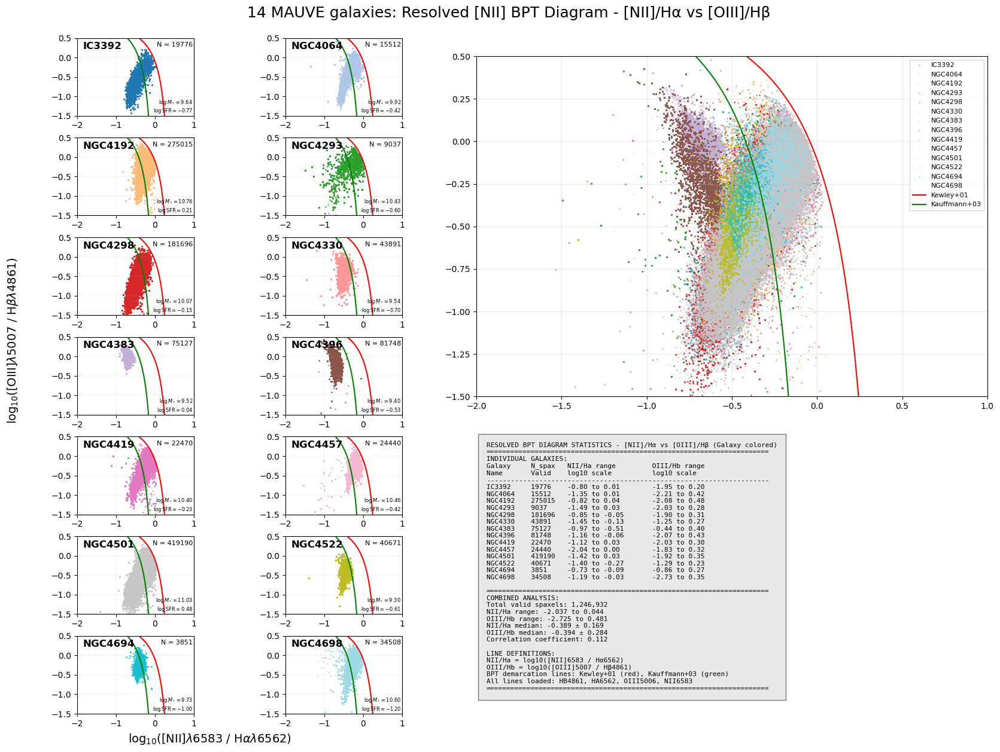

In [8]:
# ------------------------------------------------------------------
# Resolved BPT Diagram: [NII]/Hα vs [OIII]/Hβ for each galaxy and combined
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_line_maps(gal):
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        hb4861_flux = h['HB4861_FLUX_corr'].data
        ha6562_flux = h['HA6562_FLUX_corr'].data
        oiii5006_flux = h['OIII5006_FLUX_corr'].data
        nii6583_flux = h['NII6583_FLUX_corr'].data
        hb4861_err = h['HB4861_FLUX_ERR'].data
        ha6562_err = h['HA6562_FLUX_ERR'].data
        oiii5006_err = h['OIII5006_FLUX_ERR'].data
        nii6583_err = h['NII6583_FLUX_ERR'].data
        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            oh_d16_sf = None
    return (hb4861_flux, ha6562_flux, oiii5006_flux, nii6583_flux,
            hb4861_err, ha6562_err, oiii5006_err, nii6583_err, oh_d16_sf)

def calculate_bpt_ratios(hb4861, ha6562, oiii5006, nii6583, hb4861_err, ha6562_err, oiii5006_err, nii6583_err, oh_d16_sf):
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        good_mask = (np.isfinite(hb4861) & np.isfinite(ha6562) & np.isfinite(oiii5006) & np.isfinite(nii6583) &
                    (hb4861 > 0) & (ha6562 > 0) & (oiii5006 > 0) & (nii6583 > 0))
    nii_ha = np.full_like(nii6583, np.nan)
    oiii_hb = np.full_like(nii6583, np.nan)
    nii_ha[good_mask] = np.log10(nii6583[good_mask] / ha6562[good_mask])
    oiii_hb[good_mask] = np.log10(oiii5006[good_mask] / hb4861[good_mask])
    return nii_ha, oiii_hb, good_mask

def kewley01_N2(x):
    return 0.61/(x-0.47) + 1.19

def kauff03_N2(x):
    return 0.61/(x-0.05) + 1.30

fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    try:
        (hb4861, ha6562, oiii5006, nii6583,
         hb4861_err, ha6562_err, oiii5006_err, nii6583_err, oh_d16_sf) = load_line_maps(gal)
        nii_ha, oiii_hb, good_mask = calculate_bpt_ratios(
            hb4861, ha6562, oiii5006, nii6583,
            hb4861_err, ha6562_err, oiii5006_err, nii6583_err, oh_d16_sf)
        if not np.any(good_mask):
            print(f"Skipping {gal}: no valid BPT data points")
            continue
    except Exception as e:
        print(f"Error loading {gal}: {e}")
        continue
    row = (plot_idx // 2) + 1
    col = plot_idx % 2
    plot_idx += 1
    axP = fig.add_subplot(gs[row, col])
    x_data, y_data = nii_ha[good_mask], oiii_hb[good_mask]
    individual_stats.append((gal, len(x_data), x_data.min(), x_data.max(), y_data.min(), y_data.max()))
    scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=2, alpha=0.7, marker='.')
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    # BPT demarcation lines
    x_kewley_N2 = np.linspace(-2.0, 0.3, 200)
    x_kauff_N2 = np.linspace((286-np.sqrt(2871561))/1100, 0.0, 200)
    axP.plot(x_kewley_N2, kewley01_N2(x_kewley_N2), 'r-', lw=1.5, label='Kewley+01')
    axP.plot(x_kauff_N2, kauff03_N2(x_kauff_N2), 'g-', lw=1.5, label='Kauffmann+03')
    axP.set_xlim(-2.0, 1.0)
    axP.set_ylim(-1.5, 0.5)
    axP.set_aspect('equal')
    axP.grid(True, lw=0.25, alpha=0.5)

    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    # Add number of valid spaxels
    axP.text(0.99, 0.95, f'N = {len(x_data)}', transform=axP.transAxes, 
             va='top', ha='right', fontsize=8,
             bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))


# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}
for idx, gal in enumerate(galaxies):
    try:
        (hb4861, ha6562, oiii5006, nii6583,
         hb4861_err, ha6562_err, oiii5006_err, nii6583_err, oh_d16_sf) = load_line_maps(gal)
        nii_ha, oiii_hb, good_mask = calculate_bpt_ratios(
            hb4861, ha6562, oiii5006, nii6583,
            hb4861_err, ha6562_err, oiii5006_err, nii6583_err, oh_d16_sf)
        if np.any(good_mask):
            x_data, y_data = nii_ha[good_mask], oiii_hb[good_mask]
            all_x.extend(x_data)
            all_y.extend(y_data)
            all_gal_ids.extend([idx] * len(x_data))
            galaxy_counts[gal] = len(x_data)
        else:
            galaxy_counts[gal] = 0
    except Exception as e:
        galaxy_counts[gal] = 0
all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
                           s=1, alpha=0.6, marker='.', label=gal)
x_kewley_N2 = np.linspace(-2.0, 0.3, 200)
x_kauff_N2 = np.linspace(-1.5, 0.0, 200)
ax_combined.plot(x_kewley_N2, kewley01_N2(x_kewley_N2), 'r-', lw=1.5, label='Kewley+01')
ax_combined.plot(x_kauff_N2, kauff03_N2(x_kauff_N2), 'g-', lw=1.5, label='Kauffmann+03')
ax_combined.legend(fontsize=8, loc='upper right')
ax_combined.set_xlim(-2.0, 1.0)
ax_combined.set_ylim(-1.5, 0.5)
ax_combined.set_aspect('equal')
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])
ax_stats.axis('off')
stats_table = "RESOLVED BPT DIAGRAM STATISTICS - [NII]/Hα vs [OIII]/Hβ (Galaxy colored)\n"
stats_table += "="*70 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'NII/Ha range':<20} {'OIII/Hb range':<20}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'log10 scale':<20} {'log10 scale':<20}\n"
stats_table += "-"*70 + "\n"
for gal, n_spax, x_min, x_max, y_min, y_max in individual_stats:
    nii_range = f"{x_min:.2f} to {x_max:.2f}"
    oiii_range = f"{y_min:.2f} to {y_max:.2f}"
    stats_table += f"{gal:<10} {n_spax:<8} {nii_range:<20} {oiii_range:<20}\n"
stats_table += "\n" + "="*70 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total valid spaxels: {len(all_x):,}\n"
if len(all_x) > 0:
    stats_table += f"NII/Ha range: {all_x.min():.3f} to {all_x.max():.3f}\n"
    stats_table += f"OIII/Hb range: {all_y.min():.3f} to {all_y.max():.3f}\n"
    stats_table += f"NII/Ha median: {np.median(all_x):.3f} ± {np.std(all_x):.3f}\n"
    stats_table += f"OIII/Hb median: {np.median(all_y):.3f} ± {np.std(all_y):.3f}\n"
    if len(all_x) > 10:
        correlation = np.corrcoef(all_x, all_y)[0, 1]
        stats_table += f"Correlation coefficient: {correlation:.3f}\n"
stats_table += "\nLINE DEFINITIONS:\n"
stats_table += "NII/Ha = log10([NII]6583 / Hα6562)\n"
stats_table += "OIII/Hb = log10([OIII]5007 / Hβ4861)\n"
stats_table += "BPT demarcation lines: Kewley+01 (red), Kauffmann+03 (green)\n"
stats_table += "All lines loaded: HB4861, HA6562, OIII5006, NII6583\n"
stats_table += "="*70
ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=8, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved [NII] BPT Diagram - [NII]/Hα vs [OIII]/Hβ', fontsize=18, y=0.85)
fig.text(0.25, 0.08, r'log$_{10}$([NII]$\lambda$6583 / H$\alpha$$\lambda$6562)', ha='center', fontsize=14)
fig.text(0.08, 0.5, r'log$_{10}$([OIII]$\lambda$5007 / H$\beta$$\lambda$4861)', va='center', rotation='vertical', fontsize=14)
plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/3961127209.py:88: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=2, alpha=0.7, marker='.')
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/3961127209.py:141: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
/var/

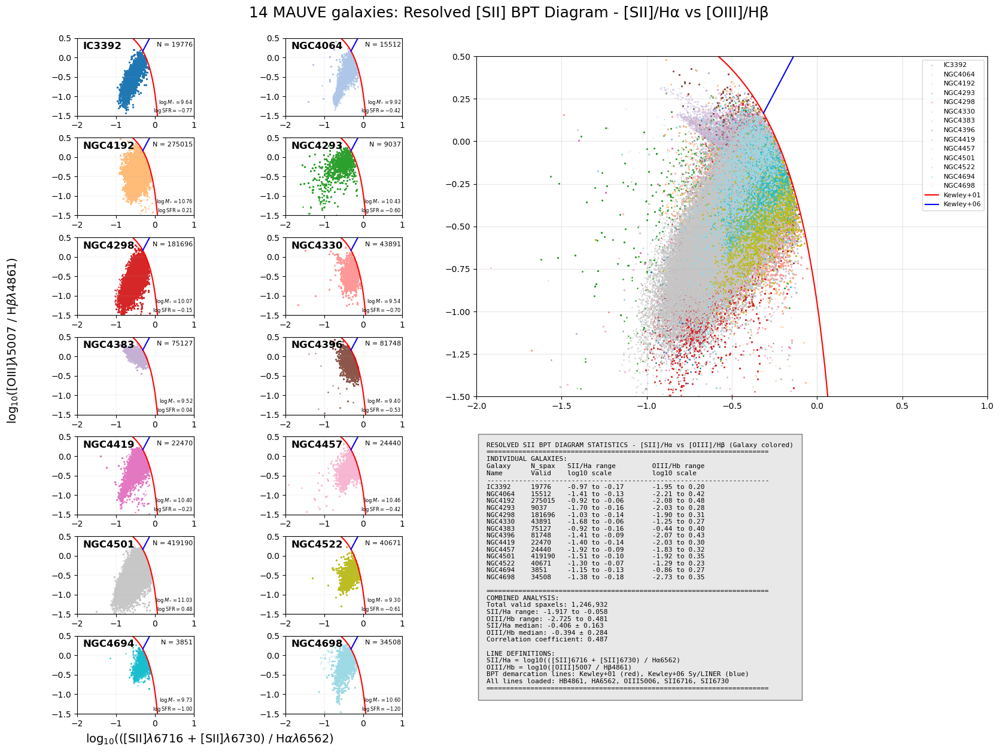

In [9]:
# ------------------------------------------------------------------
# Resolved SII BPT Diagram: [SII]/Hα vs [OIII]/Hβ for each galaxy and combined
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_line_maps(gal):
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        hb4861_flux = h['HB4861_FLUX_corr'].data
        ha6562_flux = h['HA6562_FLUX_corr'].data
        oiii5006_flux = h['OIII5006_FLUX_corr'].data
        sii6716_flux = h['SII6716_FLUX_corr'].data
        sii6730_flux = h['SII6730_FLUX_corr'].data
        hb4861_err = h['HB4861_FLUX_ERR'].data
        ha6562_err = h['HA6562_FLUX_ERR'].data
        oiii5006_err = h['OIII5006_FLUX_ERR'].data
        sii6716_err = h['SII6716_FLUX_ERR'].data
        sii6730_err = h['SII6730_FLUX_ERR'].data
        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            oh_d16_sf = None
    return (hb4861_flux, ha6562_flux, oiii5006_flux, sii6716_flux, sii6730_flux,
            hb4861_err, ha6562_err, oiii5006_err, sii6716_err, sii6730_err, oh_d16_sf)

def calculate_sii_bpt_ratios(hb4861, ha6562, oiii5006, sii6716, sii6730, hb4861_err, ha6562_err, oiii5006_err, sii6716_err, sii6730_err, oh_d16_sf):
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        good_mask = (np.isfinite(hb4861) & np.isfinite(ha6562) & np.isfinite(oiii5006) & 
                    np.isfinite(sii6716) & np.isfinite(sii6730) &
                    (hb4861 > 0) & (ha6562 > 0) & (oiii5006 > 0) & (sii6716 > 0) & (sii6730 > 0))
    sii_ha = np.full_like(sii6716, np.nan)
    oiii_hb = np.full_like(sii6716, np.nan)
    sii_total = sii6716 + sii6730
    sii_ha[good_mask] = np.log10(sii_total[good_mask] / ha6562[good_mask])
    oiii_hb[good_mask] = np.log10(oiii5006[good_mask] / hb4861[good_mask])
    return sii_ha, oiii_hb, good_mask

def kewley01_S2(x):
    return 0.72/(x-0.32) + 1.30

def kewley06_Sy_LIN(x):   # Seyfert/LINER division
    return 1.89*x + 0.76

fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    try:
        (hb4861, ha6562, oiii5006, sii6716, sii6730,
         hb4861_err, ha6562_err, oiii5006_err, sii6716_err, sii6730_err, oh_d16_sf) = load_line_maps(gal)
        sii_ha, oiii_hb, good_mask = calculate_sii_bpt_ratios(
            hb4861, ha6562, oiii5006, sii6716, sii6730,
            hb4861_err, ha6562_err, oiii5006_err, sii6716_err, sii6730_err, oh_d16_sf)
        if not np.any(good_mask):
            print(f"Skipping {gal}: no valid SII BPT data points")
            continue
    except Exception as e:
        print(f"Error loading {gal}: {e}")
        continue
    row = (plot_idx // 2) + 1
    col = plot_idx % 2
    plot_idx += 1
    axP = fig.add_subplot(gs[row, col])
    x_data, y_data = sii_ha[good_mask], oiii_hb[good_mask]
    individual_stats.append((gal, len(x_data), x_data.min(), x_data.max(), y_data.min(), y_data.max()))
    scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=2, alpha=0.7, marker='.')
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    # SII BPT demarcation lines
    x_kewley_S2 = np.linspace(-2.0, 0.3, 200)
    x_kewley06_S2 = np.linspace((159-np.sqrt(105081))/525, 0.5, 200)
    axP.plot(x_kewley_S2, kewley01_S2(x_kewley_S2), 'r-', lw=1.5, label='Kewley+01')
    axP.plot(x_kewley06_S2, kewley06_Sy_LIN(x_kewley06_S2), 'b-', lw=1.5, label='Kewley+06')
    axP.set_xlim(-2.0, 1.0)
    axP.set_ylim(-1.5, 0.5)
    axP.set_aspect('equal')
    axP.grid(True, lw=0.25, alpha=0.5)

    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    # Add number of valid spaxels
    axP.text(0.99, 0.95, f'N = {len(x_data)}', transform=axP.transAxes, 
             va='top', ha='right', fontsize=8,
             bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}
for idx, gal in enumerate(galaxies):
    try:
        (hb4861, ha6562, oiii5006, sii6716, sii6730,
         hb4861_err, ha6562_err, oiii5006_err, sii6716_err, sii6730_err, oh_d16_sf) = load_line_maps(gal)
        sii_ha, oiii_hb, good_mask = calculate_sii_bpt_ratios(
            hb4861, ha6562, oiii5006, sii6716, sii6730,
            hb4861_err, ha6562_err, oiii5006_err, sii6716_err, sii6730_err, oh_d16_sf)
        if np.any(good_mask):
            x_data, y_data = sii_ha[good_mask], oiii_hb[good_mask]
            all_x.extend(x_data)
            all_y.extend(y_data)
            all_gal_ids.extend([idx] * len(x_data))
            galaxy_counts[gal] = len(x_data)
        else:
            galaxy_counts[gal] = 0
    except Exception as e:
        galaxy_counts[gal] = 0
all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
                           s=1, alpha=0.6, marker='.', label=gal)
x_kewley_S2 = np.linspace(-2.0, 0.3, 200)
x_kewley06_S2 = np.linspace((159-np.sqrt(105081))/525, 0.5, 200)
ax_combined.plot(x_kewley_S2, kewley01_S2(x_kewley_S2), 'r-', lw=1.5, label='Kewley+01')
ax_combined.plot(x_kewley06_S2, kewley06_Sy_LIN(x_kewley06_S2), 'b-', lw=1.5, label='Kewley+06')
ax_combined.legend(fontsize=8, loc='upper right')
ax_combined.set_xlim(-2.0, 1.0)
ax_combined.set_ylim(-1.5, 0.5)
ax_combined.set_aspect('equal')
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])
ax_stats.axis('off')
stats_table = "RESOLVED SII BPT DIAGRAM STATISTICS - [SII]/Hα vs [OIII]/Hβ (Galaxy colored)\n"
stats_table += "="*70 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'SII/Ha range':<20} {'OIII/Hb range':<20}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'log10 scale':<20} {'log10 scale':<20}\n"
stats_table += "-"*70 + "\n"
for gal, n_spax, x_min, x_max, y_min, y_max in individual_stats:
    sii_range = f"{x_min:.2f} to {x_max:.2f}"
    oiii_range = f"{y_min:.2f} to {y_max:.2f}"
    stats_table += f"{gal:<10} {n_spax:<8} {sii_range:<20} {oiii_range:<20}\n"
stats_table += "\n" + "="*70 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total valid spaxels: {len(all_x):,}\n"
if len(all_x) > 0:
    stats_table += f"SII/Ha range: {all_x.min():.3f} to {all_x.max():.3f}\n"
    stats_table += f"OIII/Hb range: {all_y.min():.3f} to {all_y.max():.3f}\n"
    stats_table += f"SII/Ha median: {np.median(all_x):.3f} ± {np.std(all_x):.3f}\n"
    stats_table += f"OIII/Hb median: {np.median(all_y):.3f} ± {np.std(all_y):.3f}\n"
    if len(all_x) > 10:
        correlation = np.corrcoef(all_x, all_y)[0, 1]
        stats_table += f"Correlation coefficient: {correlation:.3f}\n"
stats_table += "\nLINE DEFINITIONS:\n"
stats_table += "SII/Ha = log10(([SII]6716 + [SII]6730) / Hα6562)\n"
stats_table += "OIII/Hb = log10([OIII]5007 / Hβ4861)\n"
stats_table += "BPT demarcation lines: Kewley+01 (red), Kewley+06 Sy/LINER (blue)\n"
stats_table += "All lines loaded: HB4861, HA6562, OIII5006, SII6716, SII6730\n"
stats_table += "="*70
ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=8, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved [SII] BPT Diagram - [SII]/Hα vs [OIII]/Hβ', fontsize=18, y=0.85)
fig.text(0.25, 0.08, r'log$_{10}$(([SII]$\lambda$6716 + [SII]$\lambda$6730) / H$\alpha$$\lambda$6562)', ha='center', fontsize=14)
fig.text(0.08, 0.5, r'log$_{10}$([OIII]$\lambda$5007 / H$\beta$$\lambda$4861)', va='center', rotation='vertical', fontsize=14)
plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()

## $\rm C_2^5$ permutation of $\rm H\alpha$, $\rm H\beta$, [O II], [N II], [S II] 

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/138947231.py:141: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/138947231.py:195: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
/var/f

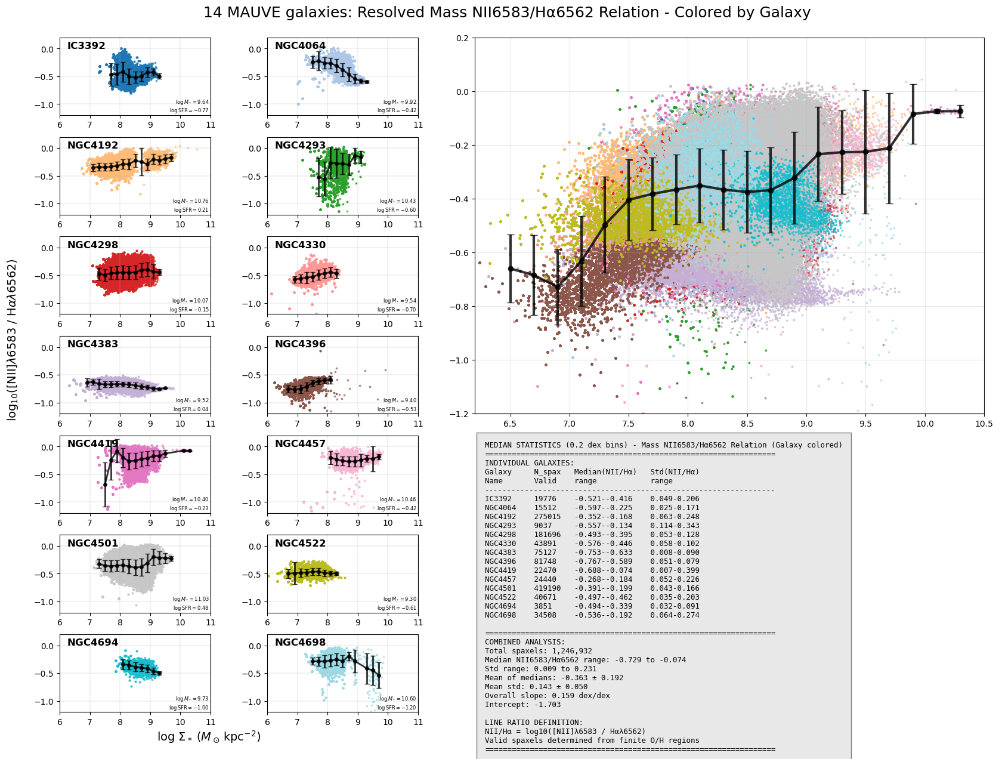

In [10]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (Mass NII6583/Halpha6562 Relation - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
        # Load emission line fluxes for NII6583/Halpha6562 ratio
        ha6562_flux = h['HA6562_FLUX_corr'].data
        nii6583_flux = h['NII6583_FLUX_corr'].data
        # Load valid O/H data to determine good spaxels
        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            oh_d16_sf = None
    return sigM, sigSFR, ha6562_flux, nii6583_flux, oh_d16_sf

def calculate_nii_ha_ratio(ha6562_flux, nii6583_flux, oh_d16_sf):
    """Calculate NII6583/Halpha6562 ratio using valid O/H regions"""
    # Use finite O/H values to determine valid spaxels
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        # Fallback: use basic finite checks on emission lines
        good_mask = (np.isfinite(ha6562_flux) & np.isfinite(nii6583_flux) &
                    (ha6562_flux > 0) & (nii6583_flux > 0))
    
    # Additional checks for positive fluxes where O/H is valid
    good_mask = good_mask & (ha6562_flux > 0) & (nii6583_flux > 0)
    
    # Calculate NII6583/Halpha6562 ratio where good
    nii_ha = np.full_like(ha6562_flux, np.nan)
    nii_ha[good_mask] = np.log10(nii6583_flux[good_mask] / ha6562_flux[good_mask])
    
    return nii_ha, good_mask

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, ha6562_flux, nii6583_flux, oh_d16_sf = load_maps(gal)
    nii_ha, good_mask = calculate_nii_ha_ratio(ha6562_flux, nii6583_flux, oh_d16_sf)
    
    if not np.any(good_mask):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    x_data, y_data, sfr_data = sigM[good_mask], nii_ha[good_mask], sigSFR[good_mask]
    
    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_data, y_data)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_data)))
    
    # Scatter plot colored by galaxy
    scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
    
    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(6, 11)
    axP.set_ylim(-1.2, 0.2)  # Typical NII6583/Halpha6562 ratio range
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, ha6562_flux, nii6583_flux, oh_d16_sf = load_maps(gal)
    nii_ha, good_mask = calculate_nii_ha_ratio(ha6562_flux, nii6583_flux, oh_d16_sf)
    
    if np.any(good_mask):
        x_data, y_data = sigM[good_mask], nii_ha[good_mask]
        all_x.extend(x_data)
        all_y.extend(y_data)
        all_gal_ids.extend([idx] * len(x_data))  # Store galaxy index for coloring
        galaxy_counts[gal] = len(x_data)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal], 
                           s=1, alpha=0.6, marker=',', label=gal)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
                        fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(-1.2, 0.2)  # Typical NII6583/Halpha6562 ratio range
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - Mass NII6583/Hα6562 Relation (Galaxy colored)\n"
stats_table += "="*65 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median(NII/Hα)':<16} {'Std(NII/Hα)':<15}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'range':<16} {'range':<15}\n"
stats_table += "-"*65 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<16} {std_range:<15}\n"

stats_table += "\n" + "="*65 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median NII6583/Hα6562 range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"
    
    # Calculate overall gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall slope: {slope:.3f} dex/dex\n"
        stats_table += f"Intercept: {intercept:.3f}\n"

stats_table += "\nLINE RATIO DEFINITION:\n"
stats_table += "NII/Hα = log10([NII]λ6583 / Hαλ6562)\n"
stats_table += "Valid spaxels determined from finite O/H regions\n"
        
stats_table += "="*65

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=9, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass NII6583/Hα6562 Relation - Colored by Galaxy', 
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'log$_{10}$([NII]$\lambda$6583 / H$\alpha$$\lambda$6562)', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/1616202949.py:141: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/1616202949.py:195: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
/var

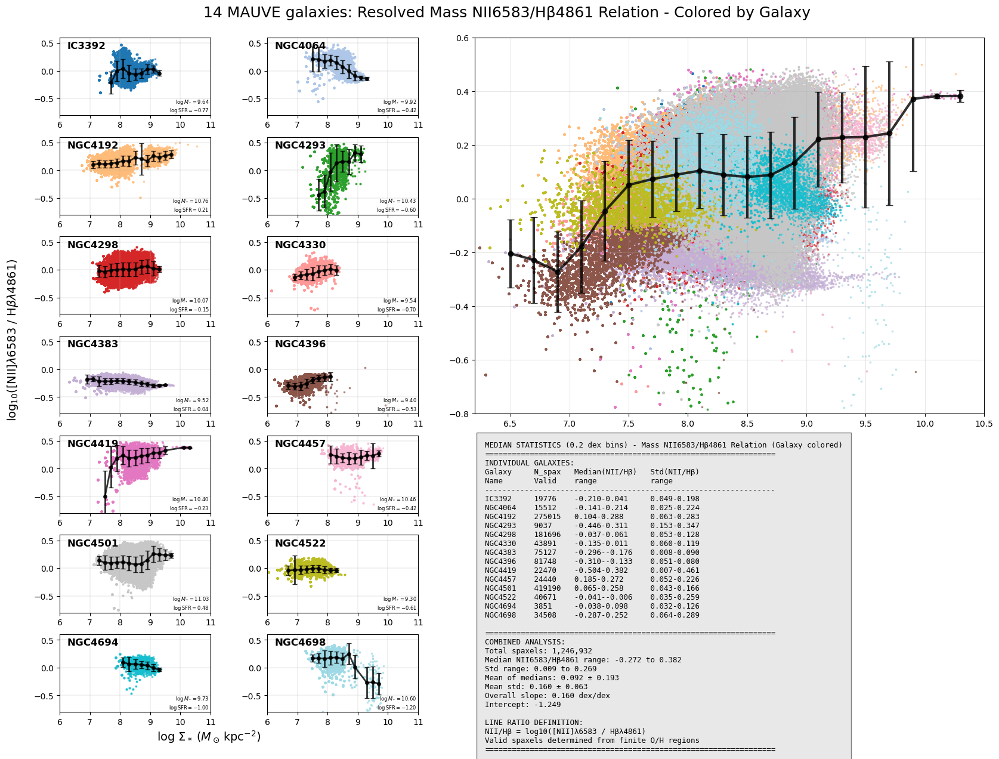

In [11]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (Mass NII6583/Hbeta4861 Relation - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
        # Load emission line fluxes for NII6583/Hbeta4861 ratio
        hb4861_flux = h['HB4861_FLUX_corr'].data
        nii6583_flux = h['NII6583_FLUX_corr'].data
        # Load valid O/H data to determine good spaxels
        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            oh_d16_sf = None
    return sigM, sigSFR, hb4861_flux, nii6583_flux, oh_d16_sf

def calculate_nii_hb_ratio(hb4861_flux, nii6583_flux, oh_d16_sf):
    """Calculate NII6583/Hbeta4861 ratio using valid O/H regions"""
    # Use finite O/H values to determine valid spaxels
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        # Fallback: use basic finite checks on emission lines
        good_mask = (np.isfinite(hb4861_flux) & np.isfinite(nii6583_flux) &
                    (hb4861_flux > 0) & (nii6583_flux > 0))
    
    # Additional checks for positive fluxes where O/H is valid
    good_mask = good_mask & (hb4861_flux > 0) & (nii6583_flux > 0)
    
    # Calculate NII6583/Hbeta4861 ratio where good
    nii_hb = np.full_like(hb4861_flux, np.nan)
    nii_hb[good_mask] = np.log10(nii6583_flux[good_mask] / hb4861_flux[good_mask])
    
    return nii_hb, good_mask

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, nii6583_flux, oh_d16_sf = load_maps(gal)
    nii_hb, good_mask = calculate_nii_hb_ratio(hb4861_flux, nii6583_flux, oh_d16_sf)
    
    if not np.any(good_mask):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    x_data, y_data, sfr_data = sigM[good_mask], nii_hb[good_mask], sigSFR[good_mask]
    
    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_data, y_data)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_data)))
    
    # Scatter plot colored by galaxy
    scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
    
    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(6, 11)
    axP.set_ylim(-0.8, 0.6)  # Typical NII6583/Hbeta4861 ratio range (higher than NII/Hα)
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, nii6583_flux, oh_d16_sf = load_maps(gal)
    nii_hb, good_mask = calculate_nii_hb_ratio(hb4861_flux, nii6583_flux, oh_d16_sf)
    
    if np.any(good_mask):
        x_data, y_data = sigM[good_mask], nii_hb[good_mask]
        all_x.extend(x_data)
        all_y.extend(y_data)
        all_gal_ids.extend([idx] * len(x_data))  # Store galaxy index for coloring
        galaxy_counts[gal] = len(x_data)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal], 
                           s=1, alpha=0.6, marker=',', label=gal)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
                        fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(-0.8, 0.6)  # Typical NII6583/Hbeta4861 ratio range
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - Mass NII6583/Hβ4861 Relation (Galaxy colored)\n"
stats_table += "="*65 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median(NII/Hβ)':<16} {'Std(NII/Hβ)':<15}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'range':<16} {'range':<15}\n"
stats_table += "-"*65 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<16} {std_range:<15}\n"

stats_table += "\n" + "="*65 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median NII6583/Hβ4861 range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"
    
    # Calculate overall gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall slope: {slope:.3f} dex/dex\n"
        stats_table += f"Intercept: {intercept:.3f}\n"

stats_table += "\nLINE RATIO DEFINITION:\n"
stats_table += "NII/Hβ = log10([NII]λ6583 / Hβλ4861)\n"
stats_table += "Valid spaxels determined from finite O/H regions\n"
        
stats_table += "="*65

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=9, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass NII6583/Hβ4861 Relation - Colored by Galaxy', 
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'log$_{10}$([NII]$\lambda$6583 / H$\beta$$\lambda$4861)', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/3203135721.py:141: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/3203135721.py:195: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
/var

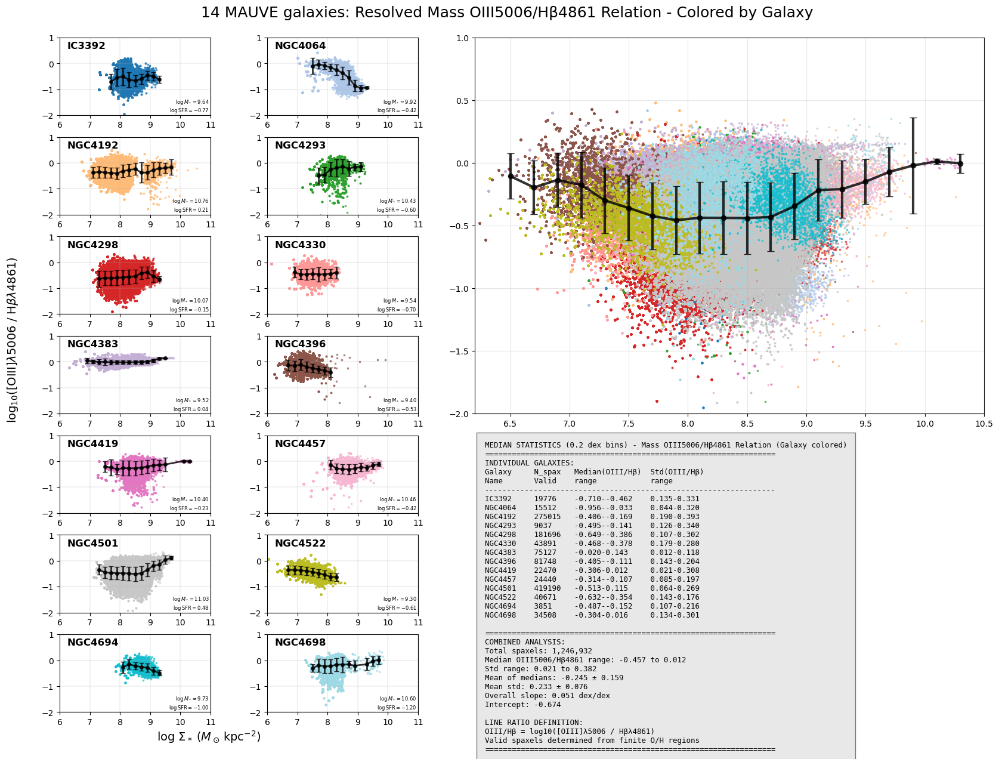

In [12]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (Mass OIII5006/Hbeta4861 Relation - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
        # Load emission line fluxes for OIII5006/Hbeta4861 ratio
        hb4861_flux = h['HB4861_FLUX_corr'].data
        oiii5006_flux = h['OIII5006_FLUX_corr'].data
        # Load valid O/H data to determine good spaxels
        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            oh_d16_sf = None
    return sigM, sigSFR, hb4861_flux, oiii5006_flux, oh_d16_sf

def calculate_oiii_hb_ratio(hb4861_flux, oiii5006_flux, oh_d16_sf):
    """Calculate OIII5006/Hbeta4861 ratio using valid O/H regions"""
    # Use finite O/H values to determine valid spaxels
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        # Fallback: use basic finite checks on emission lines
        good_mask = (np.isfinite(hb4861_flux) & np.isfinite(oiii5006_flux) &
                    (hb4861_flux > 0) & (oiii5006_flux > 0))
    
    # Additional checks for positive fluxes where O/H is valid
    good_mask = good_mask & (hb4861_flux > 0) & (oiii5006_flux > 0)
    
    # Calculate OIII5006/Hbeta4861 ratio where good
    oiii_hb = np.full_like(hb4861_flux, np.nan)
    oiii_hb[good_mask] = np.log10(oiii5006_flux[good_mask] / hb4861_flux[good_mask])
    
    return oiii_hb, good_mask

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, oiii5006_flux, oh_d16_sf = load_maps(gal)
    oiii_hb, good_mask = calculate_oiii_hb_ratio(hb4861_flux, oiii5006_flux, oh_d16_sf)
    
    if not np.any(good_mask):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    x_data, y_data, sfr_data = sigM[good_mask], oiii_hb[good_mask], sigSFR[good_mask]
    
    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_data, y_data)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_data)))
    
    # Scatter plot colored by galaxy
    scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
    
    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(6, 11)
    axP.set_ylim(-2.0, 1.0)  # Typical OIII5006/Hbeta4861 ratio range
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, oiii5006_flux, oh_d16_sf = load_maps(gal)
    oiii_hb, good_mask = calculate_oiii_hb_ratio(hb4861_flux, oiii5006_flux, oh_d16_sf)
    
    if np.any(good_mask):
        x_data, y_data = sigM[good_mask], oiii_hb[good_mask]
        all_x.extend(x_data)
        all_y.extend(y_data)
        all_gal_ids.extend([idx] * len(x_data))  # Store galaxy index for coloring
        galaxy_counts[gal] = len(x_data)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal], 
                           s=1, alpha=0.6, marker=',', label=gal)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
                        fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(-2.0, 1.0)  # Typical OIII5006/Hbeta4861 ratio range
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - Mass OIII5006/Hβ4861 Relation (Galaxy colored)\n"
stats_table += "="*65 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median(OIII/Hβ)':<16} {'Std(OIII/Hβ)':<15}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'range':<16} {'range':<15}\n"
stats_table += "-"*65 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<16} {std_range:<15}\n"

stats_table += "\n" + "="*65 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median OIII5006/Hβ4861 range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"
    
    # Calculate overall gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall slope: {slope:.3f} dex/dex\n"
        stats_table += f"Intercept: {intercept:.3f}\n"

stats_table += "\nLINE RATIO DEFINITION:\n"
stats_table += "OIII/Hβ = log10([OIII]λ5006 / Hβλ4861)\n"
stats_table += "Valid spaxels determined from finite O/H regions\n"
        
stats_table += "="*65

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=9, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass OIII5006/Hβ4861 Relation - Colored by Galaxy', 
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'log$_{10}$([OIII]$\lambda$5006 / H$\beta$$\lambda$4861)', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/2756156705.py:145: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/2756156705.py:199: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
/var

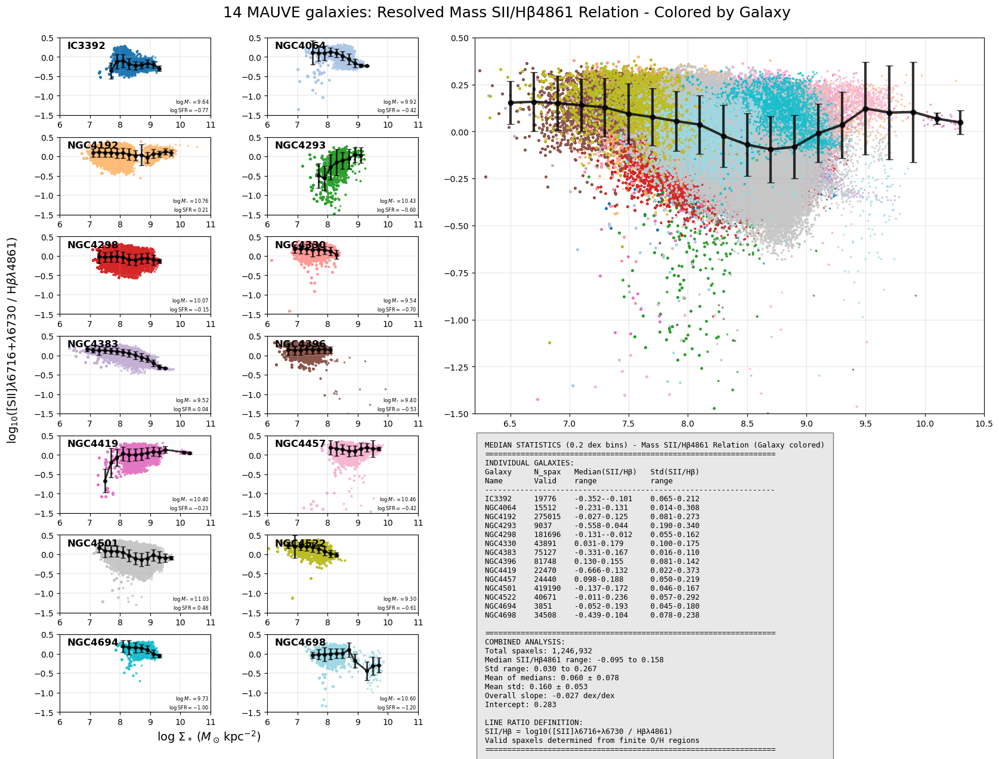

In [13]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (Mass SII/Hbeta4861 Relation - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
        # Load emission line fluxes for SII/Hbeta4861 ratio
        hb4861_flux = h['HB4861_FLUX_corr'].data
        sii6716_flux = h['SII6716_FLUX_corr'].data
        sii6730_flux = h['SII6730_FLUX_corr'].data
        # Load valid O/H data to determine good spaxels
        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            oh_d16_sf = None
    return sigM, sigSFR, hb4861_flux, sii6716_flux, sii6730_flux, oh_d16_sf

def calculate_sii_hb_ratio(hb4861_flux, sii6716_flux, sii6730_flux, oh_d16_sf):
    """Calculate SII/Hbeta4861 ratio using valid O/H regions"""
    # Calculate total SII flux
    sii_total_flux = sii6716_flux + sii6730_flux
    
    # Use finite O/H values to determine valid spaxels
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        # Fallback: use basic finite checks on emission lines
        good_mask = (np.isfinite(hb4861_flux) & np.isfinite(sii_total_flux) &
                    (hb4861_flux > 0) & (sii_total_flux > 0))
    
    # Additional checks for positive fluxes where O/H is valid
    good_mask = good_mask & (hb4861_flux > 0) & (sii_total_flux > 0)
    
    # Calculate SII/Hbeta4861 ratio where good
    sii_hb = np.full_like(hb4861_flux, np.nan)
    sii_hb[good_mask] = np.log10(sii_total_flux[good_mask] / hb4861_flux[good_mask])
    
    return sii_hb, good_mask

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, sii6716_flux, sii6730_flux, oh_d16_sf = load_maps(gal)
    sii_hb, good_mask = calculate_sii_hb_ratio(hb4861_flux, sii6716_flux, sii6730_flux, oh_d16_sf)
    
    if not np.any(good_mask):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    x_data, y_data, sfr_data = sigM[good_mask], sii_hb[good_mask], sigSFR[good_mask]
    
    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_data, y_data)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_data)))
    
    # Scatter plot colored by galaxy
    scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
    
    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(6, 11)
    axP.set_ylim(-1.5, 0.5)  # Typical SII/Hbeta4861 ratio range
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, sii6716_flux, sii6730_flux, oh_d16_sf = load_maps(gal)
    sii_hb, good_mask = calculate_sii_hb_ratio(hb4861_flux, sii6716_flux, sii6730_flux, oh_d16_sf)
    
    if np.any(good_mask):
        x_data, y_data = sigM[good_mask], sii_hb[good_mask]
        all_x.extend(x_data)
        all_y.extend(y_data)
        all_gal_ids.extend([idx] * len(x_data))  # Store galaxy index for coloring
        galaxy_counts[gal] = len(x_data)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal], 
                           s=1, alpha=0.6, marker=',', label=gal)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
                        fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(-1.5, 0.5)  # Typical SII/Hbeta4861 ratio range
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - Mass SII/Hβ4861 Relation (Galaxy colored)\n"
stats_table += "="*65 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median(SII/Hβ)':<16} {'Std(SII/Hβ)':<15}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'range':<16} {'range':<15}\n"
stats_table += "-"*65 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<16} {std_range:<15}\n"

stats_table += "\n" + "="*65 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median SII/Hβ4861 range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"
    
    # Calculate overall gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall slope: {slope:.3f} dex/dex\n"
        stats_table += f"Intercept: {intercept:.3f}\n"

stats_table += "\nLINE RATIO DEFINITION:\n"
stats_table += "SII/Hβ = log10([SII]λ6716+λ6730 / Hβλ4861)\n"
stats_table += "Valid spaxels determined from finite O/H regions\n"
        
stats_table += "="*65

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=9, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass SII/Hβ4861 Relation - Colored by Galaxy', 
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'log$_{10}$([SII]$\lambda$6716+$\lambda$6730 / H$\beta$$\lambda$4861)', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/3806679654.py:145: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/3806679654.py:199: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
/var

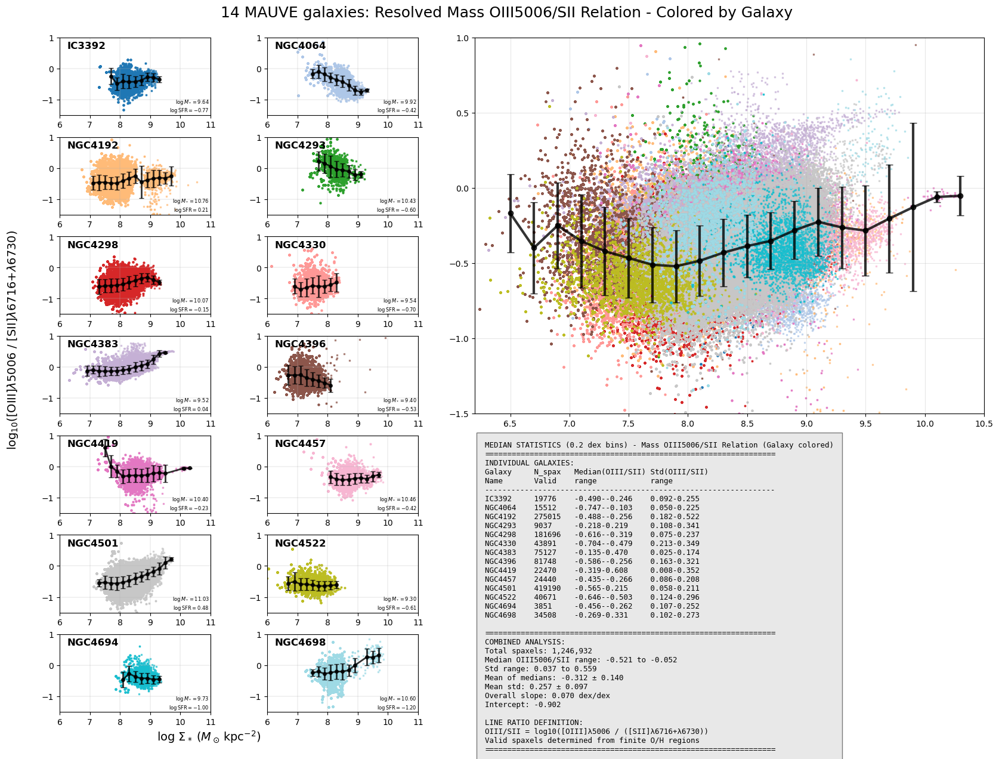

In [14]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (Mass OIII5006/SII Relation - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
        # Load emission line fluxes for OIII5006/SII ratio
        oiii5006_flux = h['OIII5006_FLUX_corr'].data
        sii6716_flux = h['SII6716_FLUX_corr'].data
        sii6730_flux = h['SII6730_FLUX_corr'].data
        # Load valid O/H data to determine good spaxels
        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            oh_d16_sf = None
    return sigM, sigSFR, oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf

def calculate_oiii_sii_ratio(oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf):
    """Calculate OIII5006/SII ratio using valid O/H regions"""
    # Calculate total SII flux
    sii_total_flux = sii6716_flux + sii6730_flux
    
    # Use finite O/H values to determine valid spaxels
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        # Fallback: use basic finite checks on emission lines
        good_mask = (np.isfinite(oiii5006_flux) & np.isfinite(sii_total_flux) &
                    (oiii5006_flux > 0) & (sii_total_flux > 0))
    
    # Additional checks for positive fluxes where O/H is valid
    good_mask = good_mask & (oiii5006_flux > 0) & (sii_total_flux > 0)
    
    # Calculate OIII5006/SII ratio where good
    oiii_sii = np.full_like(oiii5006_flux, np.nan)
    oiii_sii[good_mask] = np.log10(oiii5006_flux[good_mask] / sii_total_flux[good_mask])
    
    return oiii_sii, good_mask

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf = load_maps(gal)
    oiii_sii, good_mask = calculate_oiii_sii_ratio(oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf)
    
    if not np.any(good_mask):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    x_data, y_data, sfr_data = sigM[good_mask], oiii_sii[good_mask], sigSFR[good_mask]
    
    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_data, y_data)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_data)))
    
    # Scatter plot colored by galaxy
    scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
    
    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(6, 11)
    axP.set_ylim(-1.5, 1.0)  # Typical OIII5006/SII ratio range
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf = load_maps(gal)
    oiii_sii, good_mask = calculate_oiii_sii_ratio(oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf)
    
    if np.any(good_mask):
        x_data, y_data = sigM[good_mask], oiii_sii[good_mask]
        all_x.extend(x_data)
        all_y.extend(y_data)
        all_gal_ids.extend([idx] * len(x_data))  # Store galaxy index for coloring
        galaxy_counts[gal] = len(x_data)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal], 
                           s=1, alpha=0.6, marker=',', label=gal)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
                        fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(-1.5, 1.0)  # Typical OIII5006/SII ratio range
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - Mass OIII5006/SII Relation (Galaxy colored)\n"
stats_table += "="*65 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median(OIII/SII)':<16} {'Std(OIII/SII)':<15}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'range':<16} {'range':<15}\n"
stats_table += "-"*65 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<16} {std_range:<15}\n"

stats_table += "\n" + "="*65 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median OIII5006/SII range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"
    
    # Calculate overall gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall slope: {slope:.3f} dex/dex\n"
        stats_table += f"Intercept: {intercept:.3f}\n"

stats_table += "\nLINE RATIO DEFINITION:\n"
stats_table += "OIII/SII = log10([OIII]λ5006 / ([SII]λ6716+λ6730))\n"
stats_table += "Valid spaxels determined from finite O/H regions\n"
        
stats_table += "="*65

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=9, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass OIII5006/SII Relation - Colored by Galaxy', 
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'log$_{10}$([OIII]$\lambda$5006 / [SII]$\lambda$6716+$\lambda$6730)', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/1298475174.py:145: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/1298475174.py:199: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
/var

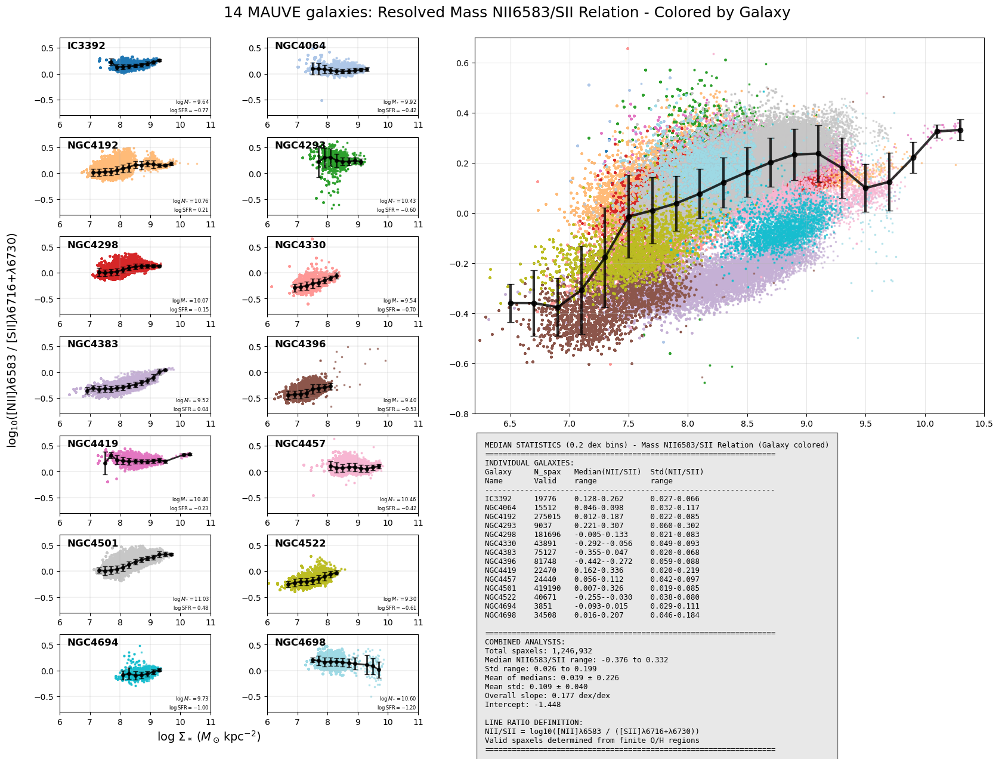

In [15]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (Mass NII6583/SII Relation - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
        # Load emission line fluxes for NII6583/SII ratio
        nii6583_flux = h['NII6583_FLUX_corr'].data
        sii6716_flux = h['SII6716_FLUX_corr'].data
        sii6730_flux = h['SII6730_FLUX_corr'].data
        # Load valid O/H data to determine good spaxels
        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            oh_d16_sf = None
    return sigM, sigSFR, nii6583_flux, sii6716_flux, sii6730_flux, oh_d16_sf

def calculate_nii_sii_ratio(nii6583_flux, sii6716_flux, sii6730_flux, oh_d16_sf):
    """Calculate NII6583/SII ratio using valid O/H regions"""
    # Calculate total SII flux
    sii_total_flux = sii6716_flux + sii6730_flux
    
    # Use finite O/H values to determine valid spaxels
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        # Fallback: use basic finite checks on emission lines
        good_mask = (np.isfinite(nii6583_flux) & np.isfinite(sii_total_flux) &
                    (nii6583_flux > 0) & (sii_total_flux > 0))
    
    # Additional checks for positive fluxes where O/H is valid
    good_mask = good_mask & (nii6583_flux > 0) & (sii_total_flux > 0)
    
    # Calculate NII6583/SII ratio where good
    nii_sii = np.full_like(nii6583_flux, np.nan)
    nii_sii[good_mask] = np.log10(nii6583_flux[good_mask] / sii_total_flux[good_mask])
    
    return nii_sii, good_mask

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, nii6583_flux, sii6716_flux, sii6730_flux, oh_d16_sf = load_maps(gal)
    nii_sii, good_mask = calculate_nii_sii_ratio(nii6583_flux, sii6716_flux, sii6730_flux, oh_d16_sf)
    
    if not np.any(good_mask):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    x_data, y_data, sfr_data = sigM[good_mask], nii_sii[good_mask], sigSFR[good_mask]
    
    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_data, y_data)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_data)))
    
    # Scatter plot colored by galaxy
    scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
    
    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(6, 11)
    axP.set_ylim(-0.8, 0.7)  # Typical NII6583/SII ratio range
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, nii6583_flux, sii6716_flux, sii6730_flux, oh_d16_sf = load_maps(gal)
    nii_sii, good_mask = calculate_nii_sii_ratio(nii6583_flux, sii6716_flux, sii6730_flux, oh_d16_sf)
    
    if np.any(good_mask):
        x_data, y_data = sigM[good_mask], nii_sii[good_mask]
        all_x.extend(x_data)
        all_y.extend(y_data)
        all_gal_ids.extend([idx] * len(x_data))  # Store galaxy index for coloring
        galaxy_counts[gal] = len(x_data)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal], 
                           s=1, alpha=0.6, marker=',', label=gal)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
                        fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(-0.8, 0.7)  # Typical NII6583/SII ratio range
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - Mass NII6583/SII Relation (Galaxy colored)\n"
stats_table += "="*65 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median(NII/SII)':<16} {'Std(NII/SII)':<15}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'range':<16} {'range':<15}\n"
stats_table += "-"*65 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<16} {std_range:<15}\n"

stats_table += "\n" + "="*65 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median NII6583/SII range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"
    
    # Calculate overall gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall slope: {slope:.3f} dex/dex\n"
        stats_table += f"Intercept: {intercept:.3f}\n"

stats_table += "\nLINE RATIO DEFINITION:\n"
stats_table += "NII/SII = log10([NII]λ6583 / ([SII]λ6716+λ6730))\n"
stats_table += "Valid spaxels determined from finite O/H regions\n"
        
stats_table += "="*65

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=9, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass NII6583/SII Relation - Colored by Galaxy', 
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'log$_{10}$([NII]$\lambda$6583 / [SII]$\lambda$6716+$\lambda$6730)', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/1219533459.py:141: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/1219533459.py:195: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
/var

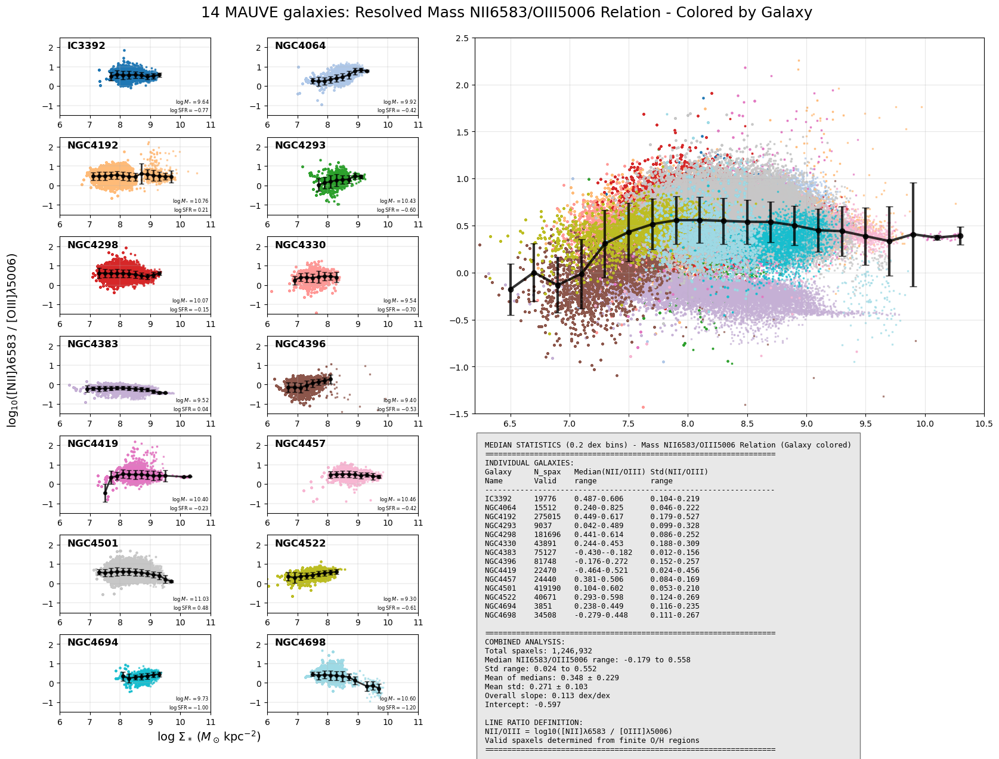

In [16]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (Mass NII6583/OIII5006 Relation - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
        # Load emission line fluxes for NII6583/OIII5006 ratio
        oiii5006_flux = h['OIII5006_FLUX_corr'].data
        nii6583_flux = h['NII6583_FLUX_corr'].data
        # Load valid O/H data to determine good spaxels
        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            oh_d16_sf = None
    return sigM, sigSFR, oiii5006_flux, nii6583_flux, oh_d16_sf

def calculate_nii_oiii_ratio(oiii5006_flux, nii6583_flux, oh_d16_sf):
    """Calculate NII6583/OIII5006 ratio using valid O/H regions"""
    # Use finite O/H values to determine valid spaxels
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        # Fallback: use basic finite checks on emission lines
        good_mask = (np.isfinite(oiii5006_flux) & np.isfinite(nii6583_flux) &
                    (oiii5006_flux > 0) & (nii6583_flux > 0))
    
    # Additional checks for positive fluxes where O/H is valid
    good_mask = good_mask & (oiii5006_flux > 0) & (nii6583_flux > 0)
    
    # Calculate NII6583/OIII5006 ratio where good (inverted from before)
    nii_oiii = np.full_like(oiii5006_flux, np.nan)
    nii_oiii[good_mask] = np.log10(nii6583_flux[good_mask] / oiii5006_flux[good_mask])
    
    return nii_oiii, good_mask

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, oiii5006_flux, nii6583_flux, oh_d16_sf = load_maps(gal)
    nii_oiii, good_mask = calculate_nii_oiii_ratio(oiii5006_flux, nii6583_flux, oh_d16_sf)
    
    if not np.any(good_mask):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    x_data, y_data, sfr_data = sigM[good_mask], nii_oiii[good_mask], sigSFR[good_mask]
    
    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_data, y_data)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_data)))
    
    # Scatter plot colored by galaxy
    scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
    
    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(6, 11)
    axP.set_ylim(-1.5, 2.5)  # Inverted range for NII6583/OIII5006 ratio
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, oiii5006_flux, nii6583_flux, oh_d16_sf = load_maps(gal)
    nii_oiii, good_mask = calculate_nii_oiii_ratio(oiii5006_flux, nii6583_flux, oh_d16_sf)
    
    if np.any(good_mask):
        x_data, y_data = sigM[good_mask], nii_oiii[good_mask]
        all_x.extend(x_data)
        all_y.extend(y_data)
        all_gal_ids.extend([idx] * len(x_data))  # Store galaxy index for coloring
        galaxy_counts[gal] = len(x_data)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal], 
                           s=1, alpha=0.6, marker=',', label=gal)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
                        fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(-1.5, 2.5)  # Inverted range for NII6583/OIII5006 ratio
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - Mass NII6583/OIII5006 Relation (Galaxy colored)\n"
stats_table += "="*65 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median(NII/OIII)':<16} {'Std(NII/OIII)':<15}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'range':<16} {'range':<15}\n"
stats_table += "-"*65 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<16} {std_range:<15}\n"

stats_table += "\n" + "="*65 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median NII6583/OIII5006 range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"
    
    # Calculate overall gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall slope: {slope:.3f} dex/dex\n"
        stats_table += f"Intercept: {intercept:.3f}\n"

stats_table += "\nLINE RATIO DEFINITION:\n"
stats_table += "NII/OIII = log10([NII]λ6583 / [OIII]λ5006)\n"
stats_table += "Valid spaxels determined from finite O/H regions\n"
        
stats_table += "="*65

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=9, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass NII6583/OIII5006 Relation - Colored by Galaxy', 
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'log$_{10}$([NII]$\lambda$6583 / [OIII]$\lambda$5006)', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()


## Complex line ratios: O3N2 ($\rm \frac{OIII}{H\beta}/\frac{NII}{H\alpha}$), O3S2 ($\rm \frac{OIII}{H\beta}/\frac{SII}{H\alpha}$), RS32 ($\rm \frac{OIII}{H\beta}+\frac{SII}{H\alpha}$)

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/258217534.py:57: RuntimeWarning: divide by zero encountered in divide
  oiii_hb = oiii5006_flux / hb4861_flux
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/258217534.py:57: RuntimeWarning: invalid value encountered in divide
  oiii_hb = oiii5006_flux / hb4861_flux
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/258217534.py:147: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/258217534.py:58: RuntimeWarning: divide by zero encountered in divide
  nii_ha 

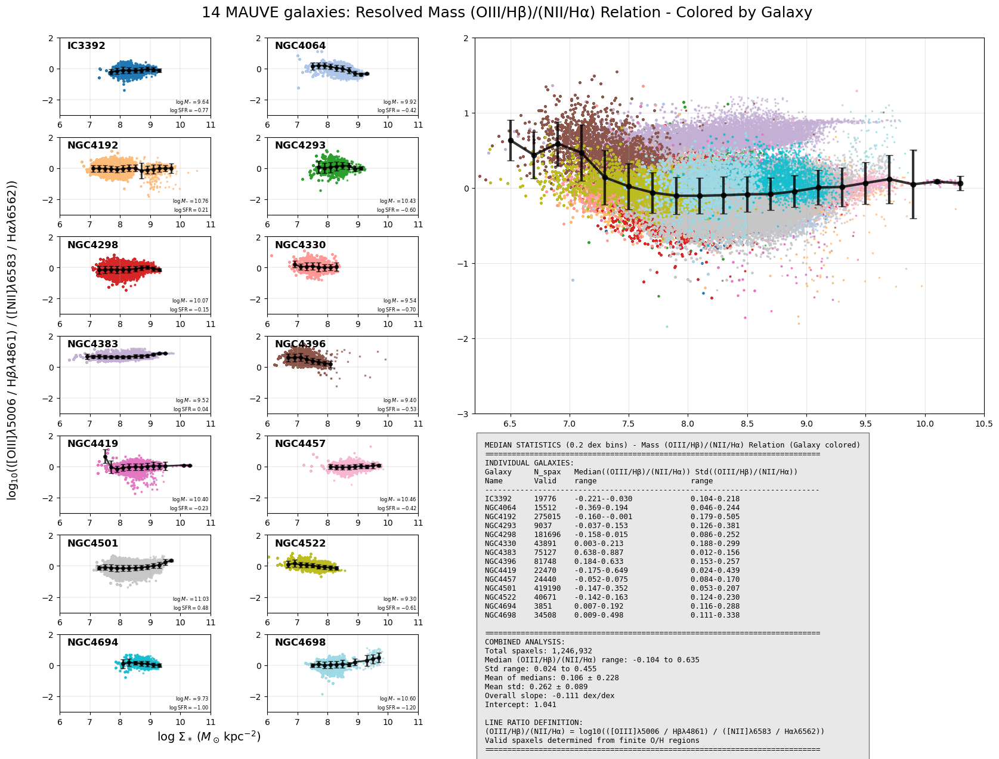

In [17]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (Mass (OIII/Hbeta)/(NII/Halpha) Relation - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
        # Load emission line fluxes for (OIII5006/Hbeta4861)/(NII6583/Halpha6562) ratio
        hb4861_flux = h['HB4861_FLUX_corr'].data
        oiii5006_flux = h['OIII5006_FLUX_corr'].data
        nii6583_flux = h['NII6583_FLUX_corr'].data
        ha6562_flux = h['HA6562_FLUX_corr'].data
        # Load valid O/H data to determine good spaxels
        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            oh_d16_sf = None
    return sigM, sigSFR, hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf

def calculate_oiii_hb_nii_ha_ratio(hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf):
    """Calculate (OIII5006/Hbeta4861)/(NII6583/Halpha6562) ratio using valid O/H regions"""
    # Use finite O/H values to determine valid spaxels
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        # Fallback: use basic finite checks on emission lines
        good_mask = (np.isfinite(hb4861_flux) & np.isfinite(oiii5006_flux) &
                    np.isfinite(nii6583_flux) & np.isfinite(ha6562_flux) &
                    (hb4861_flux > 0) & (oiii5006_flux > 0) &
                    (nii6583_flux > 0) & (ha6562_flux > 0))
    
    # Additional checks for positive fluxes where O/H is valid
    good_mask = good_mask & (hb4861_flux > 0) & (oiii5006_flux > 0) & (nii6583_flux > 0) & (ha6562_flux > 0)
    
    # Calculate (OIII5006/Hbeta4861)/(NII6583/Halpha6562) ratio where good
    oiii_hb_nii_ha = np.full_like(hb4861_flux, np.nan)
    oiii_hb = oiii5006_flux / hb4861_flux
    nii_ha = nii6583_flux / ha6562_flux
    oiii_hb_nii_ha[good_mask] = np.log10(oiii_hb[good_mask] / nii_ha[good_mask])
    
    return oiii_hb_nii_ha, good_mask

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf = load_maps(gal)
    oiii_hb_nii_ha, good_mask = calculate_oiii_hb_nii_ha_ratio(hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf)
    
    if not np.any(good_mask):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    x_data, y_data, sfr_data = sigM[good_mask], oiii_hb_nii_ha[good_mask], sigSFR[good_mask]
    
    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_data, y_data)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_data)))
    
    # Scatter plot colored by galaxy
    scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
    
    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(6, 11)
    axP.set_ylim(-3.0, 2.0)  # Adjusted range for (OIII/Hβ)/(NII/Hα) ratio
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf = load_maps(gal)
    oiii_hb_nii_ha, good_mask = calculate_oiii_hb_nii_ha_ratio(hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf)
    
    if np.any(good_mask):
        x_data, y_data = sigM[good_mask], oiii_hb_nii_ha[good_mask]
        all_x.extend(x_data)
        all_y.extend(y_data)
        all_gal_ids.extend([idx] * len(x_data))  # Store galaxy index for coloring
        galaxy_counts[gal] = len(x_data)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal], 
                           s=1, alpha=0.6, marker=',', label=gal)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
                        fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(-3.0, 2.0)  # Adjusted range for (OIII/Hβ)/(NII/Hα) ratio
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - Mass (OIII/Hβ)/(NII/Hα) Relation (Galaxy colored)\n"
stats_table += "="*75 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median((OIII/Hβ)/(NII/Hα))':<25} {'Std((OIII/Hβ)/(NII/Hα))':<20}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'range':<25} {'range':<20}\n"
stats_table += "-"*75 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<25} {std_range:<20}\n"

stats_table += "\n" + "="*75 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median (OIII/Hβ)/(NII/Hα) range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"
    
    # Calculate overall gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall slope: {slope:.3f} dex/dex\n"
        stats_table += f"Intercept: {intercept:.3f}\n"

stats_table += "\nLINE RATIO DEFINITION:\n"
stats_table += "(OIII/Hβ)/(NII/Hα) = log10(([OIII]λ5006 / Hβλ4861) / ([NII]λ6583 / Hαλ6562))\n"
stats_table += "Valid spaxels determined from finite O/H regions\n"
        
stats_table += "="*75

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=9, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass (OIII/Hβ)/(NII/Hα) Relation - Colored by Galaxy', 
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'log$_{10}$(([OIII]$\lambda$5006 / H$\beta$$\lambda$4861) / ([NII]$\lambda$6583 / H$\alpha$$\lambda$6562))', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()

## rMZR by other calibrations

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/4189785915.py:57: RuntimeWarning: divide by zero encountered in divide
  oiii_hb = oiii5006_flux / hb4861_flux
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/4189785915.py:57: RuntimeWarning: invalid value encountered in divide
  oiii_hb = oiii5006_flux / hb4861_flux
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/4189785915.py:59: RuntimeWarning: divide by zero encountered in log10
  o3n2_ratio = np.log10(oiii_hb / nii_ha)
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/4189785915.py:180: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = axP.scatter(x_data, y_data, c=galaxy_color_dic

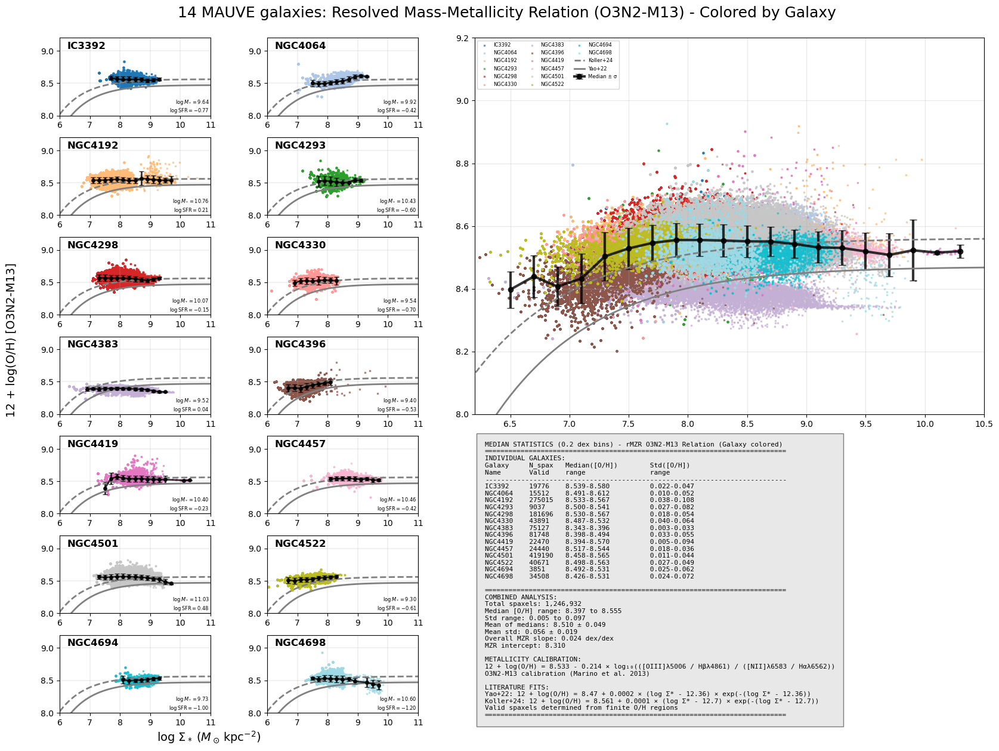

In [18]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (rMZR O3N2-M13 Relation - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
        # Load emission line fluxes for O3N2 ratio
        hb4861_flux = h['HB4861_FLUX_corr'].data
        oiii5006_flux = h['OIII5006_FLUX_corr'].data
        nii6583_flux = h['NII6583_FLUX_corr'].data
        ha6562_flux = h['HA6562_FLUX_corr'].data
        # Load valid O/H data to determine good spaxels
        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            oh_d16_sf = None
    return sigM, sigSFR, hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf

def calculate_o3n2_metallicity(hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf):
    """Calculate [O/H] using O3N2-M13 calibration: [O/H] = 8.533 - 0.214 * O3N2"""
    # Use finite O/H values to determine valid spaxels
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        # Fallback: use basic finite checks on emission lines
        good_mask = (np.isfinite(hb4861_flux) & np.isfinite(oiii5006_flux) &
                    np.isfinite(nii6583_flux) & np.isfinite(ha6562_flux) &
                    (hb4861_flux > 0) & (oiii5006_flux > 0) &
                    (nii6583_flux > 0) & (ha6562_flux > 0))
    
    # Additional checks for positive fluxes where O/H is valid
    good_mask = good_mask & (hb4861_flux > 0) & (oiii5006_flux > 0) & (nii6583_flux > 0) & (ha6562_flux > 0)
    
    # Calculate O3N2 ratio and then [O/H] metallicity
    oh_o3n2_m13 = np.full_like(hb4861_flux, np.nan)
    oiii_hb = oiii5006_flux / hb4861_flux
    nii_ha = nii6583_flux / ha6562_flux
    o3n2_ratio = np.log10(oiii_hb / nii_ha)
    # Apply O3N2-M13 calibration: [O/H] = 8.533 - 0.214 * O3N2
    oh_o3n2_m13[good_mask] = 8.533 - 0.214 * o3n2_ratio[good_mask]
    
    return oh_o3n2_m13, good_mask

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

def plot_literature_mzr_fits(ax, show_legend=False):
    """Plot literature MZR fits on the given axis"""
    # Define x range for plotting literature fits
    x = np.linspace(6, 11, 100)
    
    # Yao+22
    # 12 + log(O/H) = a + b(log Σ* - c)e^(-(x-c))
    # Coefficients: a = 8.47, b = 0.0002, c = 12.36
    a1, b1, c1 = 8.47, 0.0002, 12.36
    y_yao22 = a1 + b1 * (x - c1) * np.exp(-(x - c1))

    # Koller+24
    # 12 + log(O/H) = a + b(log Σ* - c)exp(-(log Σ* - c))
    # Coefficients: a = 8.561, b = 0.0001, c = 12.7
    a2, b2, c2 = 8.561, 0.0001, 12.7
    y_koller24 = a2 + b2 * (x - c2) * np.exp(-(x - c2))

    # MZR literature data
    plot_data = [
        (y_koller24, 'Koller+24', '--'),
        (y_yao22, 'Yao+22', '-'),
    ]
    
    # Plot all literature fits
    colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
    for i, (y, label, linestyle) in enumerate(plot_data):
        if show_legend:
            ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color='gray')
        else:
            ax.plot(x, y, linewidth=2, linestyle=linestyle, color='gray')

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf = load_maps(gal)
    oh_o3n2_m13, good_mask = calculate_o3n2_metallicity(hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf)
    
    if not np.any(good_mask):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    x_data, y_data, sfr_data = sigM[good_mask], oh_o3n2_m13[good_mask], sigSFR[good_mask]
    
    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_data, y_data)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_data)))
    
    # Scatter plot colored by galaxy
    scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
    
    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
    
    # Add literature fits to individual panels (no legend)
    plot_literature_mzr_fits(axP, show_legend=False)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(6, 11)
    axP.set_ylim(8.0, 9.2)  # Same y-axis range as reference D16 MZR
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf = load_maps(gal)
    oh_o3n2_m13, good_mask = calculate_o3n2_metallicity(hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf)
    
    if np.any(good_mask):
        x_data, y_data = sigM[good_mask], oh_o3n2_m13[good_mask]
        all_x.extend(x_data)
        all_y.extend(y_data)
        all_gal_ids.extend([idx] * len(x_data))  # Store galaxy index for coloring
        galaxy_counts[gal] = len(x_data)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal], 
                           s=1, alpha=0.6, marker=',', label=gal)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
                        fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

# Add literature fits to combined panel (with legend)
plot_literature_mzr_fits(ax_combined, show_legend=True)

# Add legend with small font - only show galaxies
ax_combined.legend(fontsize=6, ncol=3, loc='upper left', markerscale=1)

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(8.0, 9.2)  # Same y-axis range as reference D16 MZR
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - rMZR O3N2-M13 Relation (Galaxy colored)\n"
stats_table += "="*75 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median([O/H])':<20} {'Std([O/H])':<15}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'range':<20} {'range':<15}\n"
stats_table += "-"*75 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<20} {std_range:<15}\n"

stats_table += "\n" + "="*75 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median [O/H] range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"
    
    # Calculate overall MZR gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall MZR slope: {slope:.3f} dex/dex\n"
        stats_table += f"MZR intercept: {intercept:.3f}\n"

stats_table += "\nMETALLICITY CALIBRATION:\n"
stats_table += "12 + log(O/H) = 8.533 - 0.214 × log₁₀(([OIII]λ5006 / Hβλ4861) / ([NII]λ6583 / Hαλ6562))\n"
stats_table += "O3N2-M13 calibration (Marino et al. 2013)\n"
stats_table += "\nLITERATURE FITS:\n"
stats_table += "Yao+22: 12 + log(O/H) = 8.47 + 0.0002 × (log Σ* - 12.36) × exp(-(log Σ* - 12.36))\n"
stats_table += "Koller+24: 12 + log(O/H) = 8.561 + 0.0001 × (log Σ* - 12.7) × exp(-(log Σ* - 12.7))\n"
stats_table += "Valid spaxels determined from finite O/H regions\n"
        
stats_table += "="*75

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=8, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass-Metallicity Relation (O3N2-M13) - Colored by Galaxy', 
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'12 + log(O/H) [O3N2-M13]', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/2635393527.py:174: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/2635393527.py:53: RuntimeWarning: divide by zero encountered in divide
  n2_ratio = np.log10(nii6583_flux / ha6562_flux)
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/2635393527.py:53: RuntimeWarning: divide by zero encountered in log10
  n2_ratio = np.log10(nii6583_flux / ha6562_flux)
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/2635393527.py:53: RuntimeWarning: invalid value encounte

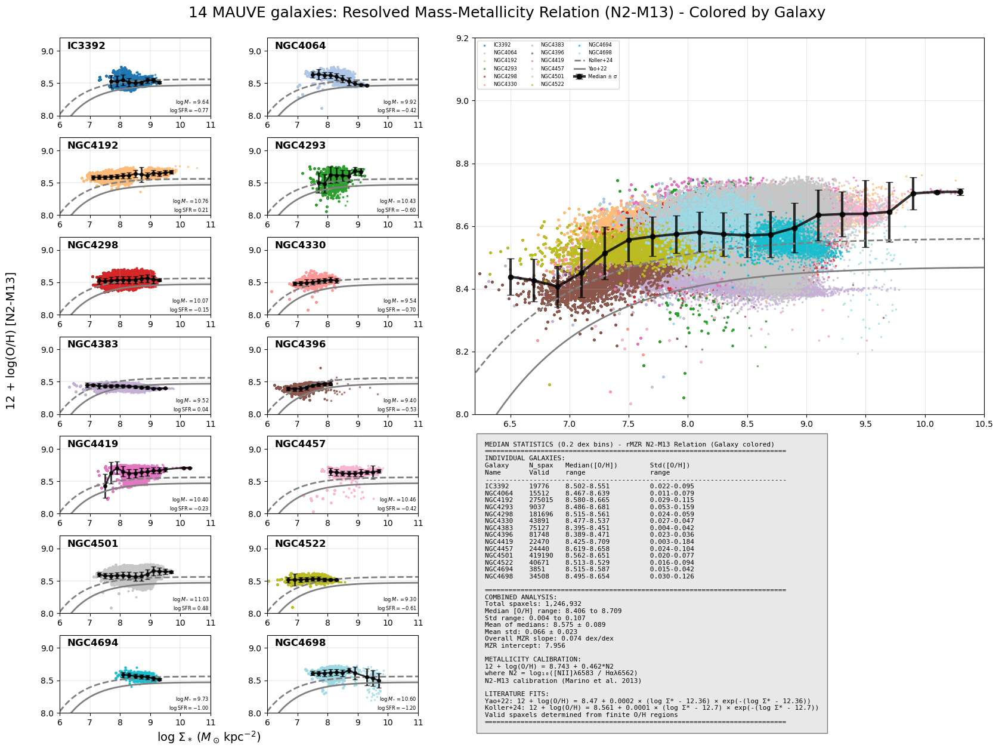

In [19]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (rMZR N2-M13 Relation - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
        # Load emission line fluxes for N2 ratio
        nii6583_flux = h['NII6583_FLUX_corr'].data
        ha6562_flux = h['HA6562_FLUX_corr'].data
        # Load valid O/H data to determine good spaxels
        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            oh_d16_sf = None
    return sigM, sigSFR, nii6583_flux, ha6562_flux, oh_d16_sf

def calculate_n2_metallicity(nii6583_flux, ha6562_flux, oh_d16_sf):
    """Calculate [O/H] using N2 calibration: [O/H] = 8.743 + 0.462*N2"""
    # Use finite O/H values to determine valid spaxels
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        # Fallback: use basic finite checks on emission lines
        good_mask = (np.isfinite(nii6583_flux) & np.isfinite(ha6562_flux) &
                    (nii6583_flux > 0) & (ha6562_flux > 0))
    
    # Additional checks for positive fluxes where O/H is valid
    good_mask = good_mask & (nii6583_flux > 0) & (ha6562_flux > 0)
    
    # Calculate N2 ratio and then [O/H] metallicity
    oh_n2_m13 = np.full_like(nii6583_flux, np.nan)
    n2_ratio = np.log10(nii6583_flux / ha6562_flux)
    # Apply N2-M13 calibration: [O/H] = 8.743 + 0.462*N2
    oh_n2_m13[good_mask] = 8.743 + 0.462 * n2_ratio[good_mask]
    
    return oh_n2_m13, good_mask

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

def plot_literature_mzr_fits(ax, show_legend=False):
    """Plot literature MZR fits on the given axis"""
    # Define x range for plotting literature fits
    x = np.linspace(6, 11, 100)
    
    # Yao+22
    # 12 + log(O/H) = a + b(log Σ* - c)e^(-(x-c))
    # Coefficients: a = 8.47, b = 0.0002, c = 12.36
    a1, b1, c1 = 8.47, 0.0002, 12.36
    y_yao22 = a1 + b1 * (x - c1) * np.exp(-(x - c1))

    # Koller+24
    # 12 + log(O/H) = a + b(log Σ* - c)exp(-(log Σ* - c))
    # Coefficients: a = 8.561, b = 0.0001, c = 12.7
    a2, b2, c2 = 8.561, 0.0001, 12.7
    y_koller24 = a2 + b2 * (x - c2) * np.exp(-(x - c2))

    # MZR literature data
    plot_data = [
        (y_koller24, 'Koller+24', '--'),
        (y_yao22, 'Yao+22', '-'),
    ]
    
    # Plot all literature fits
    colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
    for i, (y, label, linestyle) in enumerate(plot_data):
        if show_legend:
            ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color='gray')
        else:
            ax.plot(x, y, linewidth=2, linestyle=linestyle, color='gray')

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, nii6583_flux, ha6562_flux, oh_d16_sf = load_maps(gal)
    oh_n2_m13, good_mask = calculate_n2_metallicity(nii6583_flux, ha6562_flux, oh_d16_sf)
    
    if not np.any(good_mask):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    x_data, y_data, sfr_data = sigM[good_mask], oh_n2_m13[good_mask], sigSFR[good_mask]
    
    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_data, y_data)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_data)))
    
    # Scatter plot colored by galaxy
    scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
    
    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
    
    # Add literature fits to individual panels (no legend)
    plot_literature_mzr_fits(axP, show_legend=False)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(6, 11)
    axP.set_ylim(8.0, 9.2)  # Same y-axis range as reference D16 MZR
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, nii6583_flux, ha6562_flux, oh_d16_sf = load_maps(gal)
    oh_n2_m13, good_mask = calculate_n2_metallicity(nii6583_flux, ha6562_flux, oh_d16_sf)
    
    if np.any(good_mask):
        x_data, y_data = sigM[good_mask], oh_n2_m13[good_mask]
        all_x.extend(x_data)
        all_y.extend(y_data)
        all_gal_ids.extend([idx] * len(x_data))  # Store galaxy index for coloring
        galaxy_counts[gal] = len(x_data)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal], 
                           s=1, alpha=0.6, marker=',', label=gal)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
                        fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

# Add literature fits to combined panel (with legend)
plot_literature_mzr_fits(ax_combined, show_legend=True)

# Add legend with small font - only show galaxies
ax_combined.legend(fontsize=6, ncol=3, loc='upper left', markerscale=1)

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(8.0, 9.2)  # Same y-axis range as reference D16 MZR
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - rMZR N2-M13 Relation (Galaxy colored)\n"
stats_table += "="*75 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median([O/H])':<20} {'Std([O/H])':<15}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'range':<20} {'range':<15}\n"
stats_table += "-"*75 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<20} {std_range:<15}\n"

stats_table += "\n" + "="*75 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median [O/H] range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"
    
    # Calculate overall MZR gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall MZR slope: {slope:.3f} dex/dex\n"
        stats_table += f"MZR intercept: {intercept:.3f}\n"

stats_table += "\nMETALLICITY CALIBRATION:\n"
stats_table += "12 + log(O/H) = 8.743 + 0.462*N2\n"
stats_table += "where N2 = log₁₀([NII]λ6583 / Hαλ6562)\n"
stats_table += "N2-M13 calibration (Marino et al. 2013)\n"
stats_table += "\nLITERATURE FITS:\n"
stats_table += "Yao+22: 12 + log(O/H) = 8.47 + 0.0002 × (log Σ* - 12.36) × exp(-(log Σ* - 12.36))\n"
stats_table += "Koller+24: 12 + log(O/H) = 8.561 + 0.0001 × (log Σ* - 12.7) × exp(-(log Σ* - 12.7))\n"
stats_table += "Valid spaxels determined from finite O/H regions\n"
        
stats_table += "="*75

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=8, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass-Metallicity Relation (N2-M13) - Colored by Galaxy', 
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'12 + log(O/H) [N2-M13]', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()


/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/3887812559.py:57: RuntimeWarning: divide by zero encountered in divide
  oiii_hb = oiii5006_flux / hb4861_flux
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/3887812559.py:57: RuntimeWarning: invalid value encountered in divide
  oiii_hb = oiii5006_flux / hb4861_flux
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/3887812559.py:59: RuntimeWarning: divide by zero encountered in log10
  o3n2_ratio = np.log10(oiii_hb / nii_ha)
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/3887812559.py:180: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = axP.scatter(x_data, y_data, c=galaxy_color_dic

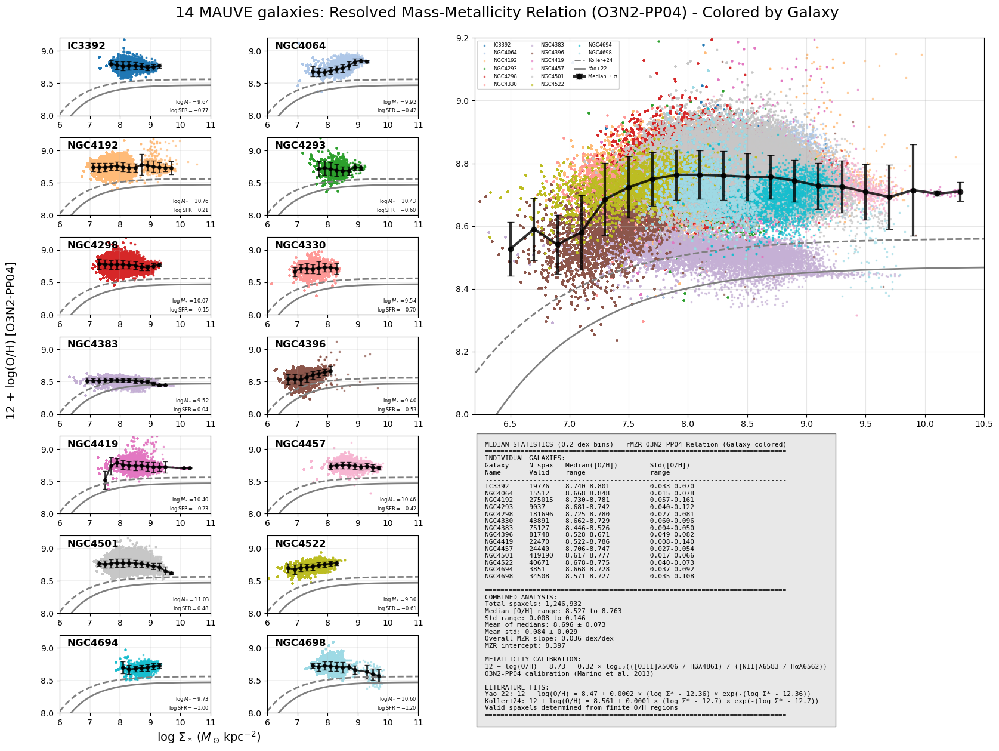

In [20]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (rMZR O3N2-PP04 Relation - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
        # Load emission line fluxes for O3N2 ratio
        hb4861_flux = h['HB4861_FLUX_corr'].data
        oiii5006_flux = h['OIII5006_FLUX_corr'].data
        nii6583_flux = h['NII6583_FLUX_corr'].data
        ha6562_flux = h['HA6562_FLUX_corr'].data
        # Load valid O/H data to determine good spaxels
        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            oh_d16_sf = None
    return sigM, sigSFR, hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf

def calculate_o3n2_metallicity(hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf):
    """Calculate [O/H] using O3N2-PP04 calibration: [O/H] = 8.73 - 0.32 * O3N2"""
    # Use finite O/H values to determine valid spaxels
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        # Fallback: use basic finite checks on emission lines
        good_mask = (np.isfinite(hb4861_flux) & np.isfinite(oiii5006_flux) &
                    np.isfinite(nii6583_flux) & np.isfinite(ha6562_flux) &
                    (hb4861_flux > 0) & (oiii5006_flux > 0) &
                    (nii6583_flux > 0) & (ha6562_flux > 0))
    
    # Additional checks for positive fluxes where O/H is valid
    good_mask = good_mask & (hb4861_flux > 0) & (oiii5006_flux > 0) & (nii6583_flux > 0) & (ha6562_flux > 0)
    
    # Calculate O3N2 ratio and then [O/H] metallicity
    oh_o3n2_pp04 = np.full_like(hb4861_flux, np.nan)
    oiii_hb = oiii5006_flux / hb4861_flux
    nii_ha = nii6583_flux / ha6562_flux
    o3n2_ratio = np.log10(oiii_hb / nii_ha)
    # Apply O3N2-PP04 calibration: [O/H] = 8.73 - 0.32 * O3N2
    oh_o3n2_pp04[good_mask] = 8.73 - 0.32 * o3n2_ratio[good_mask]
    
    return oh_o3n2_pp04, good_mask

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

def plot_literature_mzr_fits(ax, show_legend=False):
    """Plot literature MZR fits on the given axis"""
    # Define x range for plotting literature fits
    x = np.linspace(6, 11, 100)
    
    # Yao+22
    # 12 + log(O/H) = a + b(log Σ* - c)e^(-(x-c))
    # Coefficients: a = 8.47, b = 0.0002, c = 12.36
    a1, b1, c1 = 8.47, 0.0002, 12.36
    y_yao22 = a1 + b1 * (x - c1) * np.exp(-(x - c1))

    # Koller+24
    # 12 + log(O/H) = a + b(log Σ* - c)exp(-(log Σ* - c))
    # Coefficients: a = 8.561, b = 0.0001, c = 12.7
    a2, b2, c2 = 8.561, 0.0001, 12.7
    y_koller24 = a2 + b2 * (x - c2) * np.exp(-(x - c2))

    # MZR literature data
    plot_data = [
        (y_koller24, 'Koller+24', '--'),
        (y_yao22, 'Yao+22', '-'),
    ]
    
    # Plot all literature fits
    colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
    for i, (y, label, linestyle) in enumerate(plot_data):
        if show_legend:
            ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color='gray')
        else:
            ax.plot(x, y, linewidth=2, linestyle=linestyle, color='gray')

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf = load_maps(gal)
    oh_o3n2_m13, good_mask = calculate_o3n2_metallicity(hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf)
    
    if not np.any(good_mask):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    x_data, y_data, sfr_data = sigM[good_mask], oh_o3n2_m13[good_mask], sigSFR[good_mask]
    
    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_data, y_data)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_data)))
    
    # Scatter plot colored by galaxy
    scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
    
    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
    
    # Add literature fits to individual panels (no legend)
    plot_literature_mzr_fits(axP, show_legend=False)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(6, 11)
    axP.set_ylim(8.0, 9.2)  # Same y-axis range as reference D16 MZR
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf = load_maps(gal)
    oh_o3n2_m13, good_mask = calculate_o3n2_metallicity(hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf)
    
    if np.any(good_mask):
        x_data, y_data = sigM[good_mask], oh_o3n2_m13[good_mask]
        all_x.extend(x_data)
        all_y.extend(y_data)
        all_gal_ids.extend([idx] * len(x_data))  # Store galaxy index for coloring
        galaxy_counts[gal] = len(x_data)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal], 
                           s=1, alpha=0.6, marker=',', label=gal)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
                        fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

# Add literature fits to combined panel (with legend)
plot_literature_mzr_fits(ax_combined, show_legend=True)

# Add legend with small font - only show galaxies
ax_combined.legend(fontsize=6, ncol=3, loc='upper left', markerscale=1)

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(8.0, 9.2)  # Same y-axis range as reference D16 MZR
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - rMZR O3N2-PP04 Relation (Galaxy colored)\n"
stats_table += "="*75 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median([O/H])':<20} {'Std([O/H])':<15}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'range':<20} {'range':<15}\n"
stats_table += "-"*75 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<20} {std_range:<15}\n"

stats_table += "\n" + "="*75 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median [O/H] range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"
    
    # Calculate overall MZR gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall MZR slope: {slope:.3f} dex/dex\n"
        stats_table += f"MZR intercept: {intercept:.3f}\n"

stats_table += "\nMETALLICITY CALIBRATION:\n"
stats_table += "12 + log(O/H) = 8.73 - 0.32 × log₁₀(([OIII]λ5006 / Hβλ4861) / ([NII]λ6583 / Hαλ6562))\n"
stats_table += "O3N2-PP04 calibration (Marino et al. 2013)\n"
stats_table += "\nLITERATURE FITS:\n"
stats_table += "Yao+22: 12 + log(O/H) = 8.47 + 0.0002 × (log Σ* - 12.36) × exp(-(log Σ* - 12.36))\n"
stats_table += "Koller+24: 12 + log(O/H) = 8.561 + 0.0001 × (log Σ* - 12.7) × exp(-(log Σ* - 12.7))\n"
stats_table += "Valid spaxels determined from finite O/H regions\n"
        
stats_table += "="*75

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=8, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass-Metallicity Relation (O3N2-PP04) - Colored by Galaxy', 
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'12 + log(O/H) [O3N2-PP04]', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/3208873583.py:176: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/3208873583.py:53: RuntimeWarning: divide by zero encountered in divide
  n2_ratio = np.log10(nii6583_flux / ha6562_flux)
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/3208873583.py:53: RuntimeWarning: divide by zero encountered in log10
  n2_ratio = np.log10(nii6583_flux / ha6562_flux)
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/3208873583.py:53: RuntimeWarning: invalid value encounte

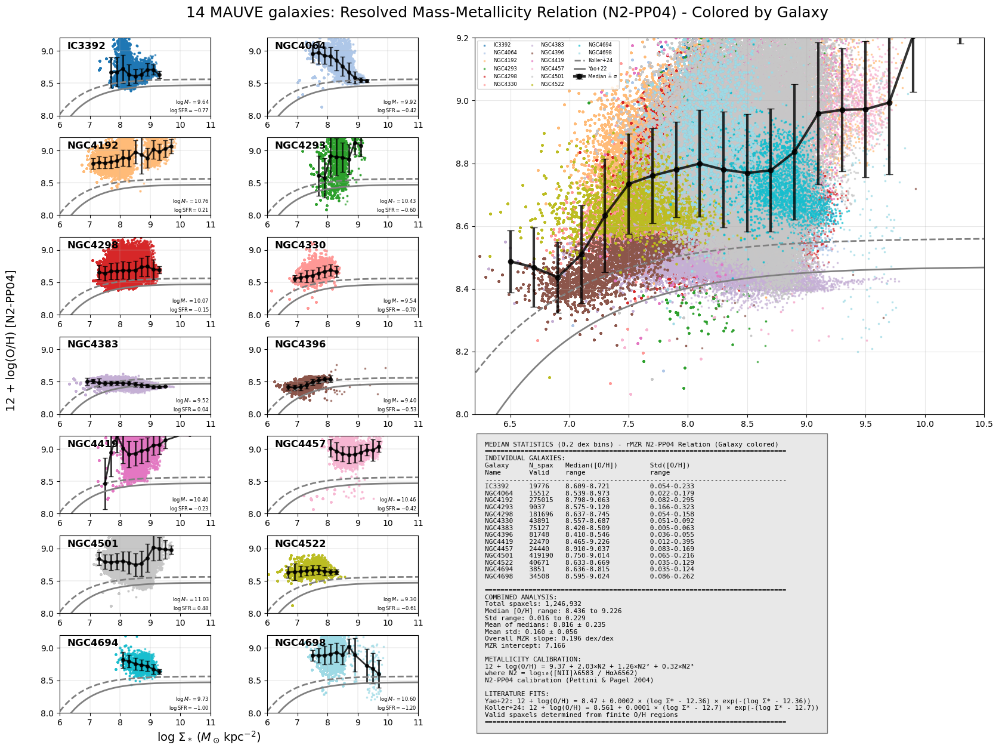

In [21]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (rMZR N2-PP04 Relation - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
        # Load emission line fluxes for N2 ratio
        nii6583_flux = h['NII6583_FLUX_corr'].data
        ha6562_flux = h['HA6562_FLUX_corr'].data
        # Load valid O/H data to determine good spaxels
        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            oh_d16_sf = None
    return sigM, sigSFR, nii6583_flux, ha6562_flux, oh_d16_sf

def calculate_n2_metallicity(nii6583_flux, ha6562_flux, oh_d16_sf):
    """Calculate [O/H] using N2-PP04 calibration: [O/H] = 9.37 + 2.03*N2 + 1.26*N2^2 + 0.32*N2^3"""
    # Use finite O/H values to determine valid spaxels
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        # Fallback: use basic finite checks on emission lines
        good_mask = (np.isfinite(nii6583_flux) & np.isfinite(ha6562_flux) &
                    (nii6583_flux > 0) & (ha6562_flux > 0))
    
    # Additional checks for positive fluxes where O/H is valid
    good_mask = good_mask & (nii6583_flux > 0) & (ha6562_flux > 0)
    
    # Calculate N2 ratio and then [O/H] metallicity
    oh_n2_pp04 = np.full_like(nii6583_flux, np.nan)
    n2_ratio = np.log10(nii6583_flux / ha6562_flux)
    # Apply N2-PP04 calibration: [O/H] = 9.37 + 2.03*N2 + 1.26*N2^2 + 0.32*N2^3
    oh_n2_pp04[good_mask] = (9.37 + 2.03 * n2_ratio[good_mask] + 
                            1.26 * n2_ratio[good_mask]**2 + 
                            0.32 * n2_ratio[good_mask]**3)
    
    return oh_n2_pp04, good_mask

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

def plot_literature_mzr_fits(ax, show_legend=False):
    """Plot literature MZR fits on the given axis"""
    # Define x range for plotting literature fits
    x = np.linspace(6, 11, 100)
    
    # Yao+22
    # 12 + log(O/H) = a + b(log Σ* - c)e^(-(x-c))
    # Coefficients: a = 8.47, b = 0.0002, c = 12.36
    a1, b1, c1 = 8.47, 0.0002, 12.36
    y_yao22 = a1 + b1 * (x - c1) * np.exp(-(x - c1))

    # Koller+24
    # 12 + log(O/H) = a + b(log Σ* - c)exp(-(log Σ* - c))
    # Coefficients: a = 8.561, b = 0.0001, c = 12.7
    a2, b2, c2 = 8.561, 0.0001, 12.7
    y_koller24 = a2 + b2 * (x - c2) * np.exp(-(x - c2))

    # MZR literature data
    plot_data = [
        (y_koller24, 'Koller+24', '--'),
        (y_yao22, 'Yao+22', '-'),
    ]
    
    # Plot all literature fits
    colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
    for i, (y, label, linestyle) in enumerate(plot_data):
        if show_legend:
            ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color='gray')
        else:
            ax.plot(x, y, linewidth=2, linestyle=linestyle, color='gray')

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, nii6583_flux, ha6562_flux, oh_d16_sf = load_maps(gal)
    oh_n2_pp04, good_mask = calculate_n2_metallicity(nii6583_flux, ha6562_flux, oh_d16_sf)
    
    if not np.any(good_mask):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    x_data, y_data, sfr_data = sigM[good_mask], oh_n2_pp04[good_mask], sigSFR[good_mask]
    
    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_data, y_data)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_data)))
    
    # Scatter plot colored by galaxy
    scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
    
    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
    
    # Add literature fits to individual panels (no legend)
    plot_literature_mzr_fits(axP, show_legend=False)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(6, 11)
    axP.set_ylim(8.0, 9.2)  # Same y-axis range as reference D16 MZR
    axP.grid(True, lw=0.25)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, nii6583_flux, ha6562_flux, oh_d16_sf = load_maps(gal)
    oh_n2_pp04, good_mask = calculate_n2_metallicity(nii6583_flux, ha6562_flux, oh_d16_sf)
    
    if np.any(good_mask):
        x_data, y_data = sigM[good_mask], oh_n2_pp04[good_mask]
        all_x.extend(x_data)
        all_y.extend(y_data)
        all_gal_ids.extend([idx] * len(x_data))  # Store galaxy index for coloring
        galaxy_counts[gal] = len(x_data)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal], 
                           s=1, alpha=0.6, marker=',', label=gal)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
                        fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

# Add literature fits to combined panel (with legend)
plot_literature_mzr_fits(ax_combined, show_legend=True)

# Add legend with small font - only show galaxies
ax_combined.legend(fontsize=6, ncol=3, loc='upper left', markerscale=1)

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(8.0, 9.2)  # Same y-axis range as reference D16 MZR
ax_combined.grid(True, alpha=0.3)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - rMZR N2-PP04 Relation (Galaxy colored)\n"
stats_table += "="*75 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median([O/H])':<20} {'Std([O/H])':<15}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'range':<20} {'range':<15}\n"
stats_table += "-"*75 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<20} {std_range:<15}\n"

stats_table += "\n" + "="*75 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median [O/H] range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"
    
    # Calculate overall MZR gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall MZR slope: {slope:.3f} dex/dex\n"
        stats_table += f"MZR intercept: {intercept:.3f}\n"

stats_table += "\nMETALLICITY CALIBRATION:\n"
stats_table += "12 + log(O/H) = 9.37 + 2.03×N2 + 1.26×N2² + 0.32×N2³\n"
stats_table += "where N2 = log₁₀([NII]λ6583 / Hαλ6562)\n"
stats_table += "N2-PP04 calibration (Pettini & Pagel 2004)\n"
stats_table += "\nLITERATURE FITS:\n"
stats_table += "Yao+22: 12 + log(O/H) = 8.47 + 0.0002 × (log Σ* - 12.36) × exp(-(log Σ* - 12.36))\n"
stats_table += "Koller+24: 12 + log(O/H) = 8.561 + 0.0001 × (log Σ* - 12.7) × exp(-(log Σ* - 12.7))\n"
stats_table += "Valid spaxels determined from finite O/H regions\n"
        
stats_table += "="*75

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=8, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass-Metallicity Relation (N2-PP04) - Colored by Galaxy', 
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'12 + log(O/H) [N2-PP04]', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()


/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/728043234.py:57: RuntimeWarning: divide by zero encountered in divide
  oiii_hb = oiii5006_flux / hb4861_flux
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/728043234.py:57: RuntimeWarning: invalid value encountered in divide
  oiii_hb = oiii5006_flux / hb4861_flux
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/728043234.py:59: RuntimeWarning: divide by zero encountered in log10
  o3n2_ratio = np.log10(oiii_hb / nii_ha)
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/728043234.py:214: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[ga

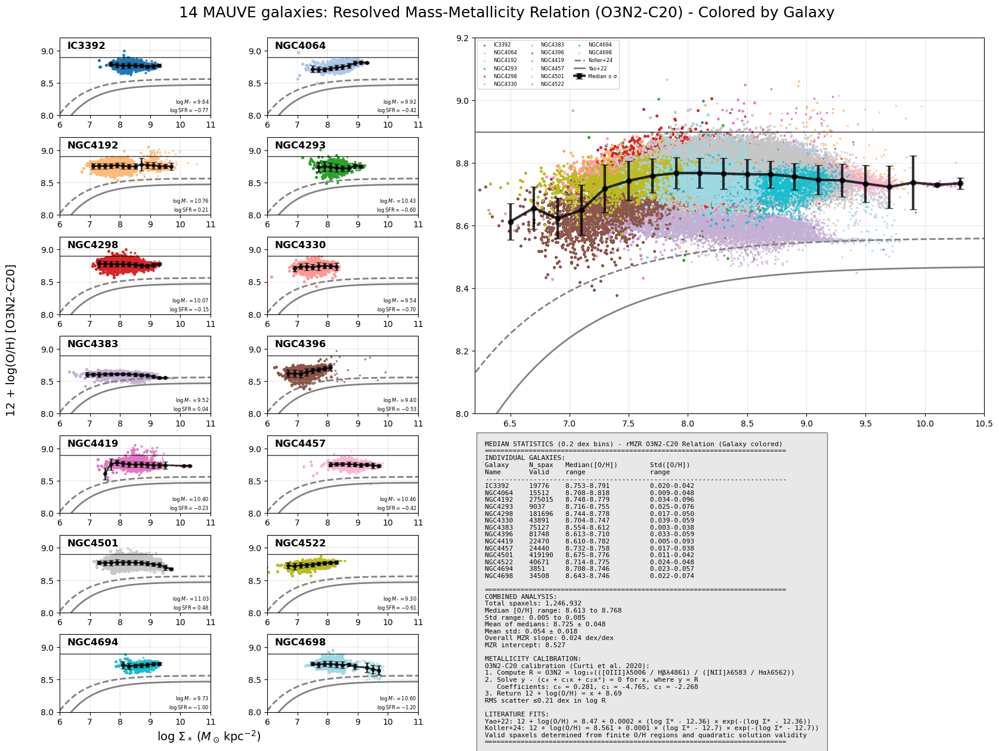

In [22]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (rMZR O3N2-C20 Relation - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
        # Load emission line fluxes for O3N2 ratio
        hb4861_flux = h['HB4861_FLUX_corr'].data
        oiii5006_flux = h['OIII5006_FLUX_corr'].data
        nii6583_flux = h['NII6583_FLUX_corr'].data
        ha6562_flux = h['HA6562_FLUX_corr'].data
        # Load valid O/H data to determine good spaxels
        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            oh_d16_sf = None
    return sigM, sigSFR, hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf

def calculate_o3n2_c20_metallicity(hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf):
    """Calculate [O/H] using O3N2-C20 calibration from Curti+2020"""
    # Use finite O/H values to determine valid spaxels
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        # Fallback: use basic finite checks on emission lines
        good_mask = (np.isfinite(hb4861_flux) & np.isfinite(oiii5006_flux) &
                    np.isfinite(nii6583_flux) & np.isfinite(ha6562_flux) &
                    (hb4861_flux > 0) & (oiii5006_flux > 0) &
                    (nii6583_flux > 0) & (ha6562_flux > 0))
    
    # Additional checks for positive fluxes where O/H is valid
    good_mask = good_mask & (hb4861_flux > 0) & (oiii5006_flux > 0) & (nii6583_flux > 0) & (ha6562_flux > 0)
    
    # Calculate O3N2 ratio and then [O/H] metallicity using C20 calibration
    oh_o3n2_c20 = np.full_like(hb4861_flux, np.nan)
    oiii_hb = oiii5006_flux / hb4861_flux
    nii_ha = nii6583_flux / ha6562_flux
    o3n2_ratio = np.log10(oiii_hb / nii_ha)
    
    # Apply O3N2-C20 calibration (Curti+2020)
    # Step 1: Compute R = O3N2 and y = log10(R)
    R = o3n2_ratio  # This is already log10(O3N2)
    y = R
    
    # Step 2: Solve quadratic equation y - (c0 + c1*x + c2*x^2) = 0 for x
    # Coefficients from Curti+2020
    c0 = 0.281
    c1 = -4.765
    c2 = -2.268
    
    # Rearrange to standard form: c2*x^2 + c1*x + (c0 - y) = 0
    # Using quadratic formula: x = (-b ± sqrt(b^2 - 4ac)) / (2a)
    a = c2
    b = c1
    c = c0 - y
    
    # Calculate discriminant
    discriminant = b**2 - 4*a*c
    
    # Only calculate where discriminant is positive
    valid_discriminant = discriminant >= 0
    combined_mask = good_mask & valid_discriminant
    
    if np.any(combined_mask):
        # Use the appropriate root (typically the positive one for metallicity)
        x_solution1 = (-b + np.sqrt(discriminant[combined_mask])) / (2*a)
        x_solution2 = (-b - np.sqrt(discriminant[combined_mask])) / (2*a)
        
        # Choose the solution that gives reasonable metallicity values
        # Typically x should be in the range corresponding to 12+log(O/H) ~ 7.6 to 8.85
        x_final = np.where((x_solution1 >= -1.1) & (x_solution1 <= 1.25), x_solution1, x_solution2)
        
        # Step 3: Return 12 + log(O/H) = x + 8.69
        oh_o3n2_c20[combined_mask] = x_final + 8.69
    
    return oh_o3n2_c20, combined_mask

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

def plot_literature_mzr_fits(ax, show_legend=False):
    """Plot literature MZR fits on the given axis"""
    # Define x range for plotting literature fits
    x = np.linspace(6, 11, 100)
    
    # Yao+22
    # 12 + log(O/H) = a + b(log Σ* - c)e^(-(x-c))
    # Coefficients: a = 8.47, b = 0.0002, c = 12.36
    a1, b1, c1 = 8.47, 0.0002, 12.36
    y_yao22 = a1 + b1 * (x - c1) * np.exp(-(x - c1))

    # Koller+24
    # 12 + log(O/H) = a + b(log Σ* - c)exp(-(log Σ* - c))
    # Coefficients: a = 8.561, b = 0.0001, c = 12.7
    a2, b2, c2 = 8.561, 0.0001, 12.7
    y_koller24 = a2 + b2 * (x - c2) * np.exp(-(x - c2))

    # MZR literature data
    plot_data = [
        (y_koller24, 'Koller+24', '--'),
        (y_yao22, 'Yao+22', '-'),
    ]
    
    # Plot all literature fits
    colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
    for i, (y, label, linestyle) in enumerate(plot_data):
        if show_legend:
            ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color='gray')
        else:
            ax.plot(x, y, linewidth=2, linestyle=linestyle, color='gray')

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf = load_maps(gal)
    oh_o3n2_c20, good_mask = calculate_o3n2_c20_metallicity(hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf)
    
    if not np.any(good_mask):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    x_data, y_data, sfr_data = sigM[good_mask], oh_o3n2_c20[good_mask], sigSFR[good_mask]
    
    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_data, y_data)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_data)))
    
    # Scatter plot colored by galaxy
    scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
    
    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
    
    # Add literature fits to individual panels (no legend)
    plot_literature_mzr_fits(axP, show_legend=False)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(6, 11)
    axP.set_ylim(8.0, 9.2)  # Same y-axis range as reference D16 MZR
    axP.grid(True, lw=0.25)
    axP.axhline(y=8.9, color='black', linestyle='-', linewidth=1, alpha=0.8)      # For individual plots

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf = load_maps(gal)
    oh_o3n2_c20, good_mask = calculate_o3n2_c20_metallicity(hb4861_flux, oiii5006_flux, nii6583_flux, ha6562_flux, oh_d16_sf)
    
    if np.any(good_mask):
        x_data, y_data = sigM[good_mask], oh_o3n2_c20[good_mask]
        all_x.extend(x_data)
        all_y.extend(y_data)
        all_gal_ids.extend([idx] * len(x_data))  # Store galaxy index for coloring
        galaxy_counts[gal] = len(x_data)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal], 
                           s=1, alpha=0.6, marker=',', label=gal)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
                        fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

# Add literature fits to combined panel (with legend)
plot_literature_mzr_fits(ax_combined, show_legend=True)

# Add legend with small font - only show galaxies
ax_combined.legend(fontsize=6, ncol=3, loc='upper left', markerscale=1)

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(8.0, 9.2)  # Same y-axis range as reference D16 MZR
ax_combined.grid(True, alpha=0.3)
ax_combined.axhline(y=8.9, color='black', linestyle='-', linewidth=1, alpha=0.8)  # For combined plot

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - rMZR O3N2-C20 Relation (Galaxy colored)\n"
stats_table += "="*75 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median([O/H])':<20} {'Std([O/H])':<15}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'range':<20} {'range':<15}\n"
stats_table += "-"*75 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<20} {std_range:<15}\n"

stats_table += "\n" + "="*75 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median [O/H] range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"
    
    # Calculate overall MZR gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall MZR slope: {slope:.3f} dex/dex\n"
        stats_table += f"MZR intercept: {intercept:.3f}\n"

stats_table += "\nMETALLICITY CALIBRATION:\n"
stats_table += "O3N2-C20 calibration (Curti et al. 2020):\n"
stats_table += "1. Compute R = O3N2 = log₁₀(([OIII]λ5006 / Hβλ4861) / ([NII]λ6583 / Hαλ6562))\n"
stats_table += "2. Solve y - (c₀ + c₁x + c₂x²) = 0 for x, where y = R\n"
stats_table += "   Coefficients: c₀ = 0.281, c₁ = -4.765, c₂ = -2.268\n"
stats_table += "3. Return 12 + log(O/H) = x + 8.69\n"
stats_table += "RMS scatter ≲0.21 dex in log R\n"
stats_table += "\nLITERATURE FITS:\n"
stats_table += "Yao+22: 12 + log(O/H) = 8.47 + 0.0002 × (log Σ* - 12.36) × exp(-(log Σ* - 12.36))\n"
stats_table += "Koller+24: 12 + log(O/H) = 8.561 + 0.0001 × (log Σ* - 12.7) × exp(-(log Σ* - 12.7))\n"
stats_table += "Valid spaxels determined from finite O/H regions and quadratic solution validity\n"
        
stats_table += "="*75

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=8, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass-Metallicity Relation (O3N2-C20) - Colored by Galaxy', 
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'12 + log(O/H) [O3N2-C20]', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/2530316244.py:57: RuntimeWarning: divide by zero encountered in divide
  oiii_hb = oiii5006_flux / hb4861_flux
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/2530316244.py:57: RuntimeWarning: invalid value encountered in divide
  oiii_hb = oiii5006_flux / hb4861_flux
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/2530316244.py:59: RuntimeWarning: divide by zero encountered in divide
  o3s2_ratio = np.log10(oiii_hb / (sii_total / hb4861_flux))  # ([OIII]/Hβ) / ([SII]/Hβ)
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/2530316244.py:59: RuntimeWarning: invalid value encountered in divide
  o3s2_ratio = np.log10(oiii_hb / (sii_total / hb4861_flux))  # ([OIII]/Hβ) / ([SII]/Hβ)
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/2530316244.py:59: RuntimeWarning: divide by zero encountered in log10
  o3s2_ratio = np.log10(oiii_hb / (sii_total / hb4861_flux))  # (

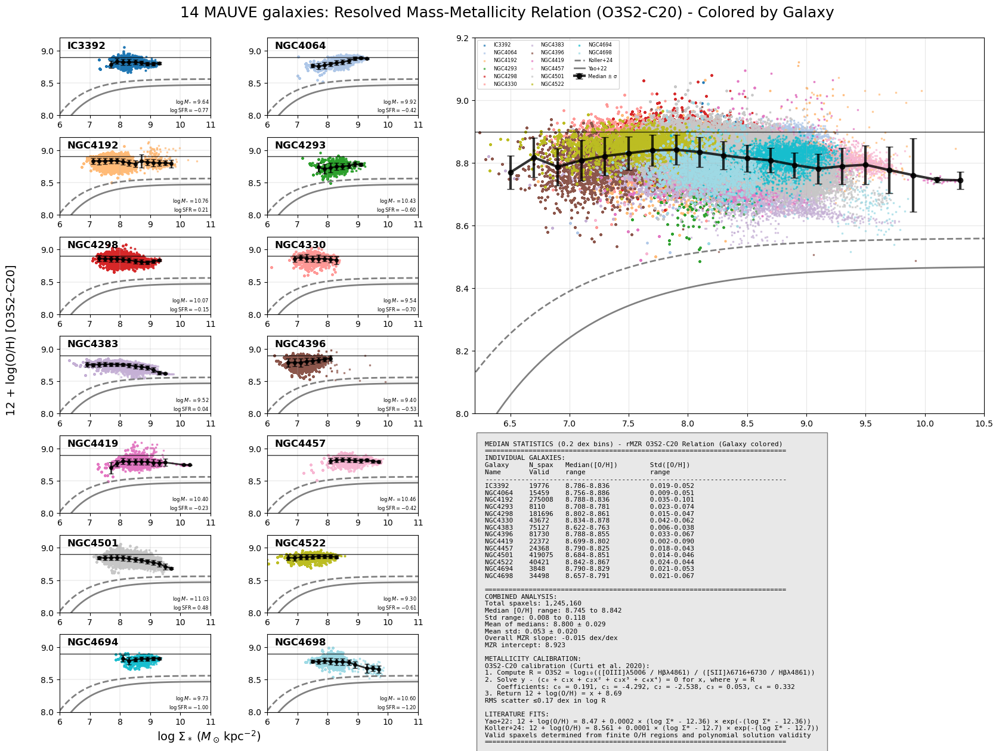

In [23]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (rMZR O3S2-C20 Relation - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR = h['LOGSFR_SURFACE_DENSITY_SF'].data
        # Load emission line fluxes for O3S2 ratio
        hb4861_flux = h['HB4861_FLUX_corr'].data
        oiii5006_flux = h['OIII5006_FLUX_corr'].data
        sii6716_flux = h['SII6716_FLUX_corr'].data
        sii6730_flux = h['SII6730_FLUX_corr'].data
        # Load valid O/H data to determine good spaxels
        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            oh_d16_sf = None
    return sigM, sigSFR, hb4861_flux, oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf

def calculate_o3s2_c20_metallicity(hb4861_flux, oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf):
    """Calculate [O/H] using O3S2-C20 calibration from Curti+2020"""
    # Use finite O/H values to determine valid spaxels
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        # Fallback: use basic finite checks on emission lines
        good_mask = (np.isfinite(hb4861_flux) & np.isfinite(oiii5006_flux) &
                    np.isfinite(sii6716_flux) & np.isfinite(sii6730_flux) &
                    (hb4861_flux > 0) & (oiii5006_flux > 0) &
                    (sii6716_flux > 0) & (sii6730_flux > 0))
    
    # Additional checks for positive fluxes where O/H is valid
    good_mask = good_mask & (hb4861_flux > 0) & (oiii5006_flux > 0) & (sii6716_flux > 0) & (sii6730_flux > 0)
    
    # Calculate O3S2 ratio and then [O/H] metallicity using C20 calibration
    oh_o3s2_c20 = np.full_like(hb4861_flux, np.nan)
    oiii_hb = oiii5006_flux / hb4861_flux
    sii_total = sii6716_flux + sii6730_flux  # Total [SII] flux
    o3s2_ratio = np.log10(oiii_hb / (sii_total / hb4861_flux))  # ([OIII]/Hβ) / ([SII]/Hβ)
    
    # Apply O3S2-C20 calibration (Curti+2020)
    # Step 1: Compute R = O3S2 and y = log10(R)
    R = o3s2_ratio  # This is already log10(O3S2)
    y = R
    
    # Step 2: Solve polynomial equation y - (c0 + c1*x + c2*x^2 + c3*x^3 + c4*x^4) = 0 for x
    # Coefficients from Curti+2020 for O3S2
    c0 = 0.191
    c1 = -4.292
    c2 = -2.538
    c3 = 0.053
    c4 = 0.332
    
    # This is now a 4th order polynomial: c4*x^4 + c3*x^3 + c2*x^2 + c1*x + (c0 - y) = 0
    # We need to solve this numerically for each valid spaxel
    oh_o3s2_c20 = np.full_like(hb4861_flux, np.nan)
    
    if np.any(good_mask):
        valid_indices = np.where(good_mask)
        for i in range(len(valid_indices[0])):
            idx_y, idx_x = valid_indices[0][i], valid_indices[1][i]
            y_val = y[idx_y, idx_x]
            
            # Polynomial coefficients for numpy.roots (highest degree first)
            poly_coeffs = [c4, c3, c2, c1, (c0 - y_val)]
            roots = np.roots(poly_coeffs)
            
            # Select the real root that gives reasonable metallicity values
            real_roots = roots[np.isreal(roots)].real
            if len(real_roots) > 0:
                # Choose root that gives reasonable x values (around -1 to 1 for typical metallicities)
                reasonable_roots = real_roots[(real_roots >= -2) & (real_roots <= 2)]
                if len(reasonable_roots) > 0:
                    x_final = reasonable_roots[0]  # Take first reasonable root
                    oh_o3s2_c20[idx_y, idx_x] = x_final + 8.69
    
    # Update the combined mask to only include spaxels where we found valid solutions
    combined_mask = good_mask & np.isfinite(oh_o3s2_c20)
    
    return oh_o3s2_c20, combined_mask

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    
    medians = []
    stds = []
    x_valid = []
    
    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])
    
    return np.array(x_valid), np.array(medians), np.array(stds)

def plot_literature_mzr_fits(ax, show_legend=False):
    """Plot literature MZR fits on the given axis"""
    # Define x range for plotting literature fits
    x = np.linspace(6, 11, 100)
    
    # Yao+22
    # 12 + log(O/H) = a + b(log Σ* - c)e^(-(x-c))
    # Coefficients: a = 8.47, b = 0.0002, c = 12.36
    a1, b1, c1 = 8.47, 0.0002, 12.36
    y_yao22 = a1 + b1 * (x - c1) * np.exp(-(x - c1))

    # Koller+24
    # 12 + log(O/H) = a + b(log Σ* - c)exp(-(log Σ* - c))
    # Coefficients: a = 8.561, b = 0.0001, c = 12.7
    a2, b2, c2 = 8.561, 0.0001, 12.7
    y_koller24 = a2 + b2 * (x - c2) * np.exp(-(x - c2))

    # MZR literature data
    plot_data = [
        (y_koller24, 'Koller+24', '--'),
        (y_yao22, 'Yao+22', '-'),
    ]
    
    # Plot all literature fits
    colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
    for i, (y, label, linestyle) in enumerate(plot_data):
        if show_legend:
            ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color='gray')
        else:
            ax.plot(x, y, linewidth=2, linestyle=linestyle, color='gray')

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf = load_maps(gal)
    oh_o3s2_c20, good_mask = calculate_o3s2_c20_metallicity(hb4861_flux, oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf)
    
    if not np.any(good_mask):
        print(f"Skipping {gal}: no valid data points")
        continue
    
    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])
    
    x_data, y_data, sfr_data = sigM[good_mask], oh_o3s2_c20[good_mask], sigSFR[good_mask]
    
    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_data, y_data)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_data)))
    
    # Scatter plot colored by galaxy
    scatter = axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
    
    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2, 
                    markersize=4, capsize=3, alpha=0.8)
    
    # Add literature fits to individual panels (no legend)
    plot_literature_mzr_fits(axP, show_legend=False)
    
    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))
    
    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)
    
    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))
    
    axP.set_xlim(6, 11)
    axP.set_ylim(8.0, 9.2)  # Same y-axis range as reference D16 MZR
    axP.grid(True, lw=0.25)
    axP.axhline(y=8.9, color='black', linestyle='-', linewidth=1, alpha=0.8)      # For individual plots

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf = load_maps(gal)
    oh_o3s2_c20, good_mask = calculate_o3s2_c20_metallicity(hb4861_flux, oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf)
    
    if np.any(good_mask):
        x_data, y_data = sigM[good_mask], oh_o3s2_c20[good_mask]
        all_x.extend(x_data)
        all_y.extend(y_data)
        all_gal_ids.extend([idx] * len(x_data))  # Store galaxy index for coloring
        galaxy_counts[gal] = len(x_data)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal], 
                           s=1, alpha=0.6, marker=',', label=gal)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined, 
                        fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

# Add literature fits to combined panel (with legend)
plot_literature_mzr_fits(ax_combined, show_legend=True)

# Add legend with small font - only show galaxies
ax_combined.legend(fontsize=6, ncol=3, loc='upper left', markerscale=1)

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(8.0, 9.2)  # Same y-axis range as reference D16 MZR
ax_combined.grid(True, alpha=0.3)
ax_combined.axhline(y=8.9, color='black', linestyle='-', linewidth=1, alpha=0.8)  # For combined plot

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - rMZR O3S2-C20 Relation (Galaxy colored)\n"
stats_table += "="*75 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median([O/H])':<20} {'Std([O/H])':<15}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'range':<20} {'range':<15}\n"
stats_table += "-"*75 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<20} {std_range:<15}\n"

stats_table += "\n" + "="*75 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median [O/H] range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"
    
    # Calculate overall MZR gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall MZR slope: {slope:.3f} dex/dex\n"
        stats_table += f"MZR intercept: {intercept:.3f}\n"

stats_table += "\nMETALLICITY CALIBRATION:\n"
stats_table += "O3S2-C20 calibration (Curti et al. 2020):\n"
stats_table += "1. Compute R = O3S2 = log₁₀(([OIII]λ5006 / Hβλ4861) / ([SII]λ6716+6730 / Hβλ4861))\n"
stats_table += "2. Solve y - (c₀ + c₁x + c₂x² + c₃x³ + c₄x⁴) = 0 for x, where y = R\n"
stats_table += "   Coefficients: c₀ = 0.191, c₁ = -4.292, c₂ = -2.538, c₃ = 0.053, c₄ = 0.332\n"
stats_table += "3. Return 12 + log(O/H) = x + 8.69\n"
stats_table += "RMS scatter ≲0.17 dex in log R\n"
stats_table += "\nLITERATURE FITS:\n"
stats_table += "Yao+22: 12 + log(O/H) = 8.47 + 0.0002 × (log Σ* - 12.36) × exp(-(log Σ* - 12.36))\n"
stats_table += "Koller+24: 12 + log(O/H) = 8.561 + 0.0001 × (log Σ* - 12.7) × exp(-(log Σ* - 12.7))\n"
stats_table += "Valid spaxels determined from finite O/H regions and polynomial solution validity\n"
        
stats_table += "="*75

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=8, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass-Metallicity Relation (O3S2-C20) - Colored by Galaxy', 
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$', 
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'12 + log(O/H) [O3S2-C20]', 
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()

/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/3412452164.py:224: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/3412452164.py:284: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
/var/folders/r

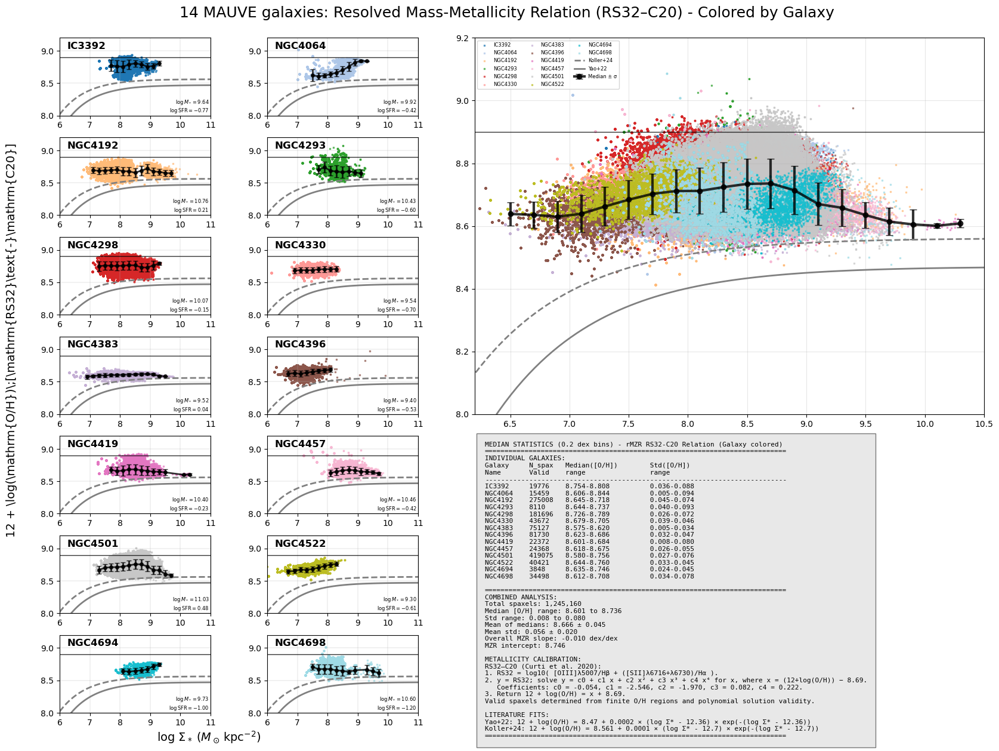

In [24]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (rMZR RS32-C20 Relation - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR        = h['LOGSFR_SURFACE_DENSITY_SF'].data
        hb4861_flux   = h['HB4861_FLUX_corr'].data
        oiii5006_flux = h['OIII5006_FLUX_corr'].data
        sii6716_flux  = h['SII6716_FLUX_corr'].data
        sii6730_flux  = h['SII6730_FLUX_corr'].data

        # --- Hα: try a few common extension names (kept minimal & robust) ---
        ha_key_candidates = (
            'HA6563_FLUX_corr', 'HA6562_FLUX_corr',
            'HALPHA6563_FLUX_corr', 'HALPHA_FLUX_corr'
        )
        ha6563_flux = None
        for k in ha_key_candidates:
            if k in h:
                ha6563_flux = h[k].data
                break
        if ha6563_flux is None:
            raise KeyError(f"No Hα flux HDU found for {gal}. Tried: {ha_key_candidates}")

        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            oh_d16_sf = None
    return sigM, sigSFR, hb4861_flux, ha6563_flux, oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf

def calculate_rs32_c20_metallicity(hb4861_flux, ha6563_flux,
                                   oiii5006_flux, sii6716_flux, sii6730_flux,
                                   oh_d16_sf,
                                   coeffs=(-0.054, -2.546, -1.970, 0.082, 0.222)):
    """
    RS32–C20 calibration (Curti+2020; user-provided coefficients):
      RS32 = log10( [OIII]/Hβ + ([SII]6716+6730)/Hα )
      Let y = RS32 and x = (12+log(O/H)) - 8.69
      Then: y = c0 + c1 x + c2 x^2 + c3 x^3 + c4 x^4
      Solve per spaxel for x, return 12+log(O/H) = x + 8.69
    """
    c0, c1, c2, c3, c4 = coeffs

    # Good spaxels: prefer finite O/H mask if present; enforce positive, finite fluxes
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        good_mask = np.ones_like(hb4861_flux, dtype=bool)

    pos = (
        np.isfinite(hb4861_flux) & np.isfinite(ha6563_flux) &
        np.isfinite(oiii5006_flux) & np.isfinite(sii6716_flux) & np.isfinite(sii6730_flux) &
        (hb4861_flux > 0) & (ha6563_flux > 0) &
        (oiii5006_flux > 0) & (sii6716_flux > 0) & (sii6730_flux > 0)
    )
    good_mask &= pos

    oh_rs32_c20 = np.full_like(hb4861_flux, np.nan, dtype=float)

    if np.any(good_mask):
        # RS32 (linear inside the log): [OIII]/Hβ + [SII]/Hα
        r_lin = (oiii5006_flux[good_mask] / hb4861_flux[good_mask]) + \
                ((sii6716_flux[good_mask] + sii6730_flux[good_mask]) / ha6563_flux[good_mask])
        r_lin = np.where(r_lin > 0, r_lin, np.nan)
        y = np.log10(r_lin)

        # Solve quartic per valid pixel:
        # c4*x^4 + c3*x^3 + c2*x^2 + c1*x + (c0 - y) = 0
        idxs = np.argwhere(good_mask)
        for (iy, ix), y_val in zip(idxs, y):
            if not np.isfinite(y_val):
                continue
            roots = np.roots([c4, c3, c2, c1, (c0 - y_val)])
            real = roots[np.isreal(roots)].real
            if real.size:
                # Sensible metallicity range for Te-anchored scales:
                # 12+log(O/H) ~ 8.0–8.9 ⇒ x = (12+log(O/H))-8.69 ∈ [-0.7, +0.3]
                phys = real[(real >= -0.7) & (real <= 0.3)]
                cand = phys if phys.size else real  # fallback if nothing in phys range
                # choose the root that best reproduces y
                y_pred = c0 + c1*cand + c2*cand**2 + c3*cand**3 + c4*cand**4
                x_final = cand[np.argmin(np.abs(y_pred - y_val))]
                oh_rs32_c20[iy, ix] = x_final + 8.69

    combined_mask = good_mask & np.isfinite(oh_rs32_c20)
    return oh_rs32_c20, combined_mask

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2

    medians = []
    stds = []
    x_valid = []

    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])

    return np.array(x_valid), np.array(medians), np.array(stds)

def plot_literature_mzr_fits(ax, show_legend=False):
    """Plot literature MZR fits on the given axis"""
    # Define x range for plotting literature fits
    x = np.linspace(6, 11, 100)

    # Yao+22
    # 12 + log(O/H) = a + b(log Σ* - c)e^(-(x-c))
    # Coefficients: a = 8.47, b = 0.0002, c = 12.36
    a1, b1, c1 = 8.47, 0.0002, 12.36
    y_yao22 = a1 + b1 * (x - c1) * np.exp(-(x - c1))

    # Koller+24
    # 12 + log(O/H) = a + b(log Σ* - c)exp(-(log Σ* - c))
    # Coefficients: a = 8.561, b = 0.0001, c = 12.7
    a2, b2, c2 = 8.561, 0.0001, 12.7
    y_koller24 = a2 + b2 * (x - c2) * np.exp(-(x - c2))

    # MZR literature data
    plot_data = [
        (y_koller24, 'Koller+24', '--'),
        (y_yao22, 'Yao+22', '-'),
    ]

    # Plot all literature fits
    colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
    for i, (y, label, linestyle) in enumerate(plot_data):
        if show_legend:
            ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color='gray')
        else:
            ax.plot(x, y, linewidth=2, linestyle=linestyle, color='gray')

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, ha6563_flux, oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf = load_maps(gal)
    oh_rs32_c20, good_mask = calculate_rs32_c20_metallicity(
        hb4861_flux, ha6563_flux, oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf
    )

    if not np.any(good_mask):
        print(f"Skipping {gal}: no valid data points")
        continue

    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])

    x_data, y_data, sfr_data = sigM[good_mask], oh_rs32_c20[good_mask], sigSFR[good_mask]

    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_data, y_data)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_data)))

    # Scatter plot colored by galaxy
    axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')

    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2,
                     markersize=4, capsize=3, alpha=0.8)

    # Add literature fits to individual panels (no legend)
    plot_literature_mzr_fits(axP, show_legend=False)

    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))

    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)

    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))

    axP.set_xlim(6, 11)
    axP.set_ylim(8.0, 9.2)  # Same y-axis range as reference D16 MZR
    axP.grid(True, lw=0.25)
    axP.axhline(y=8.9, color='black', linestyle='-', linewidth=1, alpha=0.8)      # For individual plots

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, ha6563_flux, oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf = load_maps(gal)
    oh_rs32_c20, good_mask = calculate_rs32_c20_metallicity(
        hb4861_flux, ha6563_flux, oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf
    )

    if np.any(good_mask):
        x_data, y_data = sigM[good_mask], oh_rs32_c20[good_mask]
        all_x.extend(x_data)
        all_y.extend(y_data)
        all_gal_ids.extend([idx] * len(x_data))  # Store galaxy index for coloring
        galaxy_counts[gal] = len(x_data)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
                            s=1, alpha=0.6, marker=',', label=gal)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined,
                         fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

# Add literature fits to combined panel (with legend)
plot_literature_mzr_fits(ax_combined, show_legend=True)

# Add legend with small font - only show galaxies
ax_combined.legend(fontsize=6, ncol=3, loc='upper left', markerscale=1)

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(8.0, 9.2)  # Same y-axis range as reference D16 MZR
ax_combined.grid(True, alpha=0.3)
ax_combined.axhline(y=8.9, color='black', linestyle='-', linewidth=1, alpha=0.8)  # For combined plot

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - rMZR RS32-C20 Relation (Galaxy colored)\n"
stats_table += "="*75 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median([O/H])':<20} {'Std([O/H])':<15}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'range':<20} {'range':<15}\n"
stats_table += "-"*75 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<20} {std_range:<15}\n"

stats_table += "\n" + "="*75 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median [O/H] range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"

    # Overall MZR gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall MZR slope: {slope:.3f} dex/dex\n"
        stats_table += f"MZR intercept: {intercept:.3f}\n"

stats_table += "\nMETALLICITY CALIBRATION:\n"
stats_table += "RS32–C20 (Curti et al. 2020):\n"
stats_table += "1. RS32 = log10( [OIII]λ5007/Hβ + ([SII]λ6716+λ6730)/Hα ).\n"
stats_table += "2. y = RS32; solve y = c0 + c1 x + c2 x² + c3 x³ + c4 x⁴ for x, where x = (12+log(O/H)) − 8.69.\n"
stats_table += "   Coefficients: c0 = -0.054, c1 = -2.546, c2 = -1.970, c3 = 0.082, c4 = 0.222.\n"
stats_table += "3. Return 12 + log(O/H) = x + 8.69.\n"
stats_table += "Valid spaxels determined from finite O/H regions and polynomial solution validity.\n"

stats_table += "\nLITERATURE FITS:\n"
stats_table += "Yao+22: 12 + log(O/H) = 8.47 + 0.0002 × (log Σ* - 12.36) × exp(-(log Σ* - 12.36))\n"
stats_table += "Koller+24: 12 + log(O/H) = 8.561 + 0.0001 × (log Σ* - 12.7) × exp(-(log Σ* - 12.7))\n"
stats_table += "="*75

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=8, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass-Metallicity Relation (RS32–C20) - Colored by Galaxy',
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$',
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'12 + \log(\mathrm{O/H})\;[\mathrm{RS32}\text{-}\mathrm{C20}]',
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()


/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/1650175455.py:221: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/1650175455.py:281: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
/var/folders/r

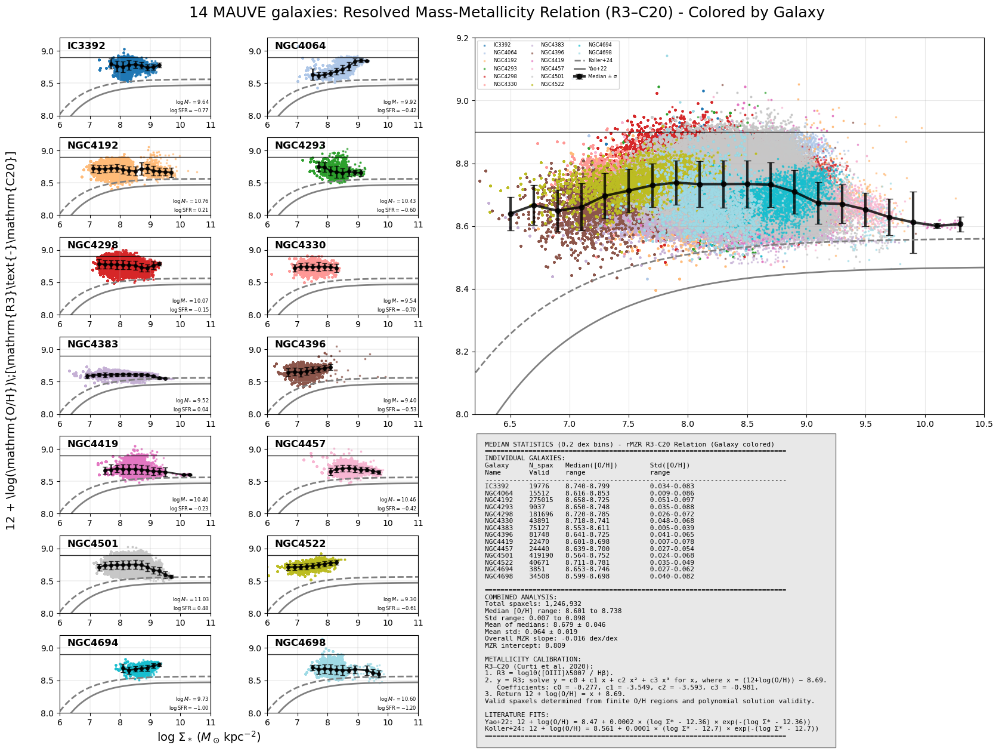

In [25]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (rMZR R3-C20 Relation - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR        = h['LOGSFR_SURFACE_DENSITY_SF'].data
        hb4861_flux   = h['HB4861_FLUX_corr'].data
        oiii5006_flux = h['OIII5006_FLUX_corr'].data
        sii6716_flux  = h['SII6716_FLUX_corr'].data
        sii6730_flux  = h['SII6730_FLUX_corr'].data

        # --- Hα: try a few common extension names (kept minimal & robust) ---
        ha_key_candidates = (
            'HA6563_FLUX_corr', 'HA6562_FLUX_corr',
            'HALPHA6563_FLUX_corr', 'HALPHA_FLUX_corr'
        )
        ha6563_flux = None
        for k in ha_key_candidates:
            if k in h:
                ha6563_flux = h[k].data
                break
        if ha6563_flux is None:
            raise KeyError(f"No Hα flux HDU found for {gal}. Tried: {ha_key_candidates}")

        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            oh_d16_sf = None
    return sigM, sigSFR, hb4861_flux, ha6563_flux, oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf

def calculate_r3_c20_metallicity(hb4861_flux,
                                 oiii5006_flux,
                                 oh_d16_sf,
                                 coeffs=(-0.277, -3.549, -3.593, -0.981)):
    """
    R3–C20 calibration (Curti+2020; user-provided coefficients):
      R3 = log10( [OIII]5007 / Hβ )
      Let y = R3 and x = (12+log(O/H)) - 8.69
      Then: y = c0 + c1 x + c2 x^2 + c3 x^3
      Solve per spaxel for x, return 12+log(O/H) = x + 8.69
    """
    c0, c1, c2, c3 = coeffs

    # Good spaxels: prefer finite O/H mask if present; enforce positive, finite fluxes
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        good_mask = np.ones_like(hb4861_flux, dtype=bool)

    pos = (
        np.isfinite(hb4861_flux) & np.isfinite(oiii5006_flux) &
        (hb4861_flux > 0) & (oiii5006_flux > 0)
    )
    good_mask &= pos

    oh_r3_c20 = np.full_like(hb4861_flux, np.nan, dtype=float)

    if np.any(good_mask):
        # R3 = log10([OIII]/Hβ)
        r_lin = (oiii5006_flux[good_mask] / hb4861_flux[good_mask])
        r_lin = np.where(r_lin > 0, r_lin, np.nan)
        y = np.log10(r_lin)

        # Solve cubic per valid pixel:
        # c3*x^3 + c2*x^2 + c1*x + (c0 - y) = 0
        idxs = np.argwhere(good_mask)
        for (iy, ix), y_val in zip(idxs, y):
            if not np.isfinite(y_val):
                continue
            roots = np.roots([c3, c2, c1, (c0 - y_val)])
            real = roots[np.isreal(roots)].real
            if real.size:
                # Sensible metallicity range for Te-anchored scales:
                # 12+log(O/H) ~ 8.0–8.9 ⇒ x = (12+log(O/H))-8.69 ∈ [-0.7, +0.3]
                phys = real[(real >= -0.7) & (real <= 0.3)]
                cand = phys if phys.size else real  # fallback if nothing in phys range
                # choose the root that best reproduces y
                y_pred = c0 + c1*cand + c2*cand**2 + c3*cand**3
                x_final = cand[np.argmin(np.abs(y_pred - y_val))]
                oh_r3_c20[iy, ix] = x_final + 8.69

    combined_mask = good_mask & np.isfinite(oh_r3_c20)
    return oh_r3_c20, combined_mask

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2

    medians = []
    stds = []
    x_valid = []

    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])

    return np.array(x_valid), np.array(medians), np.array(stds)

def plot_literature_mzr_fits(ax, show_legend=False):
    """Plot literature MZR fits on the given axis"""
    # Define x range for plotting literature fits
    x = np.linspace(6, 11, 100)

    # Yao+22
    # 12 + log(O/H) = a + b(log Σ* - c)e^(-(x-c))
    # Coefficients: a = 8.47, b = 0.0002, c = 12.36
    a1, b1, c1 = 8.47, 0.0002, 12.36
    y_yao22 = a1 + b1 * (x - c1) * np.exp(-(x - c1))

    # Koller+24
    # 12 + log(O/H) = a + b(log Σ* - c)exp(-(log Σ* - c))
    # Coefficients: a = 8.561, b = 0.0001, c = 12.7
    a2, b2, c2 = 8.561, 0.0001, 12.7
    y_koller24 = a2 + b2 * (x - c2) * np.exp(-(x - c2))

    # MZR literature data
    plot_data = [
        (y_koller24, 'Koller+24', '--'),
        (y_yao22, 'Yao+22', '-'),
    ]

    # Plot all literature fits
    colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
    for i, (y, label, linestyle) in enumerate(plot_data):
        if show_legend:
            ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color='gray')
        else:
            ax.plot(x, y, linewidth=2, linestyle=linestyle, color='gray')

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, ha6563_flux, oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf = load_maps(gal)
    oh_r3_c20, good_mask = calculate_r3_c20_metallicity(
        hb4861_flux, oiii5006_flux, oh_d16_sf
    )

    if not np.any(good_mask):
        print(f"Skipping {gal}: no valid data points")
        continue

    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])

    x_data, y_data, sfr_data = sigM[good_mask], oh_r3_c20[good_mask], sigSFR[good_mask]

    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_data, y_data)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_data)))

    # Scatter plot colored by galaxy
    axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')

    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2,
                     markersize=4, capsize=3, alpha=0.8)

    # Add literature fits to individual panels (no legend)
    plot_literature_mzr_fits(axP, show_legend=False)

    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))

    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)

    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))

    axP.set_xlim(6, 11)
    axP.set_ylim(8.0, 9.2)  # Same y-axis range as reference D16 MZR
    axP.grid(True, lw=0.25)
    axP.axhline(y=8.9, color='black', linestyle='-', linewidth=1, alpha=0.8)      # For individual plots

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, ha6563_flux, oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf = load_maps(gal)
    oh_r3_c20, good_mask = calculate_r3_c20_metallicity(
        hb4861_flux, oiii5006_flux, oh_d16_sf
    )

    if np.any(good_mask):
        x_data, y_data = sigM[good_mask], oh_r3_c20[good_mask]
        all_x.extend(x_data)
        all_y.extend(y_data)
        all_gal_ids.extend([idx] * len(x_data))  # Store galaxy index for coloring
        galaxy_counts[gal] = len(x_data)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
                            s=1, alpha=0.6, marker=',', label=gal)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined,
                         fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

# Add literature fits to combined panel (with legend)
plot_literature_mzr_fits(ax_combined, show_legend=True)

# Add legend with small font - only show galaxies
ax_combined.legend(fontsize=6, ncol=3, loc='upper left', markerscale=1)

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(8.0, 9.2)  # Same y-axis range as reference D16 MZR
ax_combined.grid(True, alpha=0.3)
ax_combined.axhline(y=8.9, color='black', linestyle='-', linewidth=1, alpha=0.8)  # For combined plot

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - rMZR R3-C20 Relation (Galaxy colored)\n"
stats_table += "="*75 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median([O/H])':<20} {'Std([O/H])':<15}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'range':<20} {'range':<15}\n"
stats_table += "-"*75 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<20} {std_range:<15}\n"

stats_table += "\n" + "="*75 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median [O/H] range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"

    # Overall MZR gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall MZR slope: {slope:.3f} dex/dex\n"
        stats_table += f"MZR intercept: {intercept:.3f}\n"

stats_table += "\nMETALLICITY CALIBRATION:\n"
stats_table += "R3–C20 (Curti et al. 2020):\n"
stats_table += "1. R3 = log10([OIII]λ5007 / Hβ).\n"
stats_table += "2. y = R3; solve y = c0 + c1 x + c2 x² + c3 x³ for x, where x = (12+log(O/H)) − 8.69.\n"
stats_table += "   Coefficients: c0 = -0.277, c1 = -3.549, c2 = -3.593, c3 = -0.981.\n"
stats_table += "3. Return 12 + log(O/H) = x + 8.69.\n"
stats_table += "Valid spaxels determined from finite O/H regions and polynomial solution validity.\n"

stats_table += "\nLITERATURE FITS:\n"
stats_table += "Yao+22: 12 + log(O/H) = 8.47 + 0.0002 × (log Σ* - 12.36) × exp(-(log Σ* - 12.36))\n"
stats_table += "Koller+24: 12 + log(O/H) = 8.561 + 0.0001 × (log Σ* - 12.7) × exp(-(log Σ* - 12.7))\n"
stats_table += "="*75

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=8, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass-Metallicity Relation (R3–C20) - Colored by Galaxy',
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$',
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'12 + \log(\mathrm{O/H})\;[\mathrm{R3}\text{-}\mathrm{C20}]',
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()


/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/3701812278.py:261: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/3701812278.py:323: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
/var/folders/r

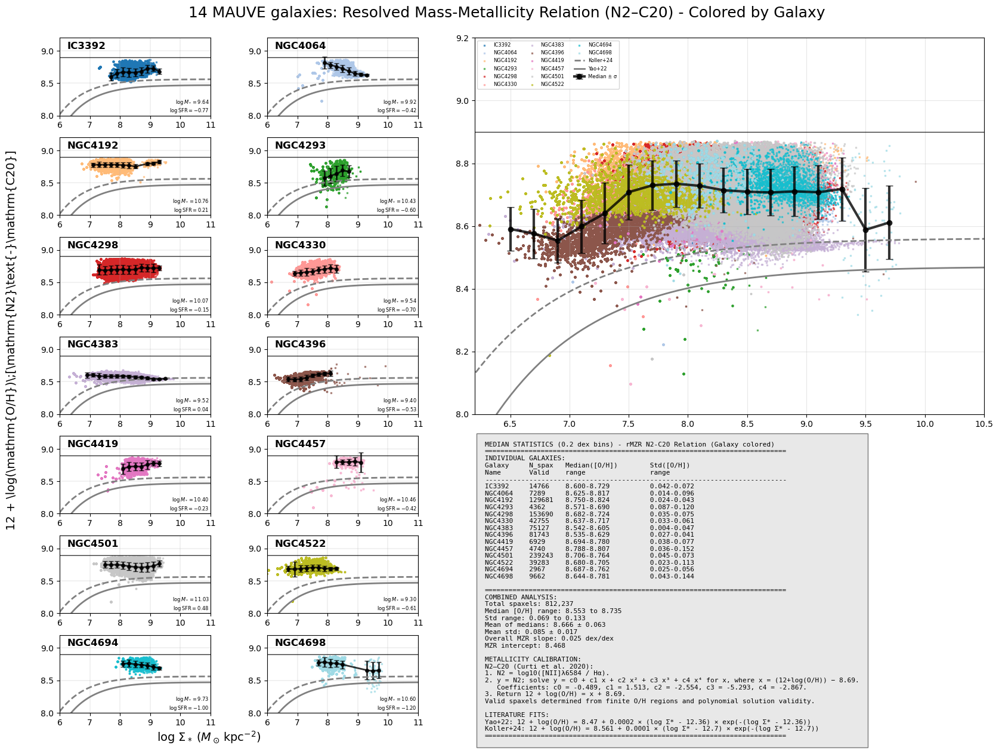

In [26]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (rMZR N2-C20 Relation - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR        = h['LOGSFR_SURFACE_DENSITY_SF'].data
        hb4861_flux   = h['HB4861_FLUX_corr'].data
        oiii5006_flux = h['OIII5006_FLUX_corr'].data
        sii6716_flux  = h['SII6716_FLUX_corr'].data
        sii6730_flux  = h['SII6730_FLUX_corr'].data

        # --- Hα: try a few common extension names (kept minimal & robust) ---
        ha_key_candidates = (
            'HA6563_FLUX_corr', 'HA6562_FLUX_corr',
            'HALPHA6563_FLUX_corr', 'HALPHA_FLUX_corr'
        )
        ha6563_flux = None
        for k in ha_key_candidates:
            if k in h:
                ha6563_flux = h[k].data
                break
        if ha6563_flux is None:
            raise KeyError(f"No Hα flux HDU found for {gal}. Tried: {ha_key_candidates}")

        # --- [N II]6584: allow 6584/6583 naming variations ---
        nii_key_candidates = (
            'NII6584_FLUX_corr', 'NII6583_FLUX_corr',
            'NII6584_FLUX', 'NII6583_FLUX'
        )
        nii6584_flux = None
        for k in nii_key_candidates:
            if k in h:
                nii6584_flux = h[k].data
                break
        if nii6584_flux is None:
            raise KeyError(f"No [N II]6584 flux HDU found for {gal}. Tried: {nii_key_candidates}")

        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            oh_d16_sf = None

    # Return unchanged structure + NII appended (minimal logic changes downstream)
    return (sigM, sigSFR, hb4861_flux, ha6563_flux,
            oiii5006_flux, sii6716_flux, sii6730_flux, nii6584_flux, oh_d16_sf)

def calculate_n2_c20_metallicity(ha6563_flux,
                                 nii6584_flux,
                                 oh_d16_sf,
                                 coeffs=(-0.489, 1.513, -2.554, -5.293, -2.867)):
    """
    N2–C20 calibration (Curti+2020; user-provided coefficients):
      N2 = log10( [NII]6584 / Hα )
      Let y = N2 and x = (12+log(O/H)) - 8.69
      Then: y = c0 + c1 x + c2 x^2 + c3 x^3 + c4 x^4
      Solve per spaxel for x, return 12+log(O/H) = x + 8.69

    Selection rule (as requested):
      • Get ALL (near-)real roots of the quartic.
      • Keep only roots with x ∈ [-0.7, 0.3].
      • If multiple such roots exist, pick the SMALLEST one.
      • If none exist, discard the spaxel (leave NaN).
      • No post-hoc clipping.
    """
    c0, c1, c2, c3, c4 = coeffs

    # Good spaxels: prefer finite O/H mask if present; enforce positive, finite fluxes
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        good_mask = np.ones_like(ha6563_flux, dtype=bool)

    pos = (
        np.isfinite(ha6563_flux) & np.isfinite(nii6584_flux) &
        (ha6563_flux > 0) & (nii6584_flux > 0)
    )
    good_mask &= pos

    oh_n2_c20 = np.full_like(ha6563_flux, np.nan, dtype=float)

    if np.any(good_mask):
        # N2 (linear inside the log): [NII]6584 / Hα
        n2_lin = nii6584_flux[good_mask] / ha6563_flux[good_mask]
        n2_lin = np.where(n2_lin > 0, n2_lin, np.nan)
        y = np.log10(n2_lin)

        idxs = np.argwhere(good_mask)

        # tolerances for "almost-real" roots and range comparison
        REAL_ATOL = 1e-8
        RANGE_EPS = 0.0  # exact bounds as requested

        for (iy, ix), y_val in zip(idxs, y):
            if not np.isfinite(y_val):
                continue

            roots = np.roots([c4, c3, c2, c1, (c0 - y_val)])

            # treat tiny-imag roots as real
            realish = roots[np.abs(roots.imag) <= REAL_ATOL].real
            if realish.size == 0:
                # fall back to the least-imag root if imag part is tiny-ish
                k = np.argmin(np.abs(roots.imag))
                if np.abs(roots[k].imag) <= 1e-6:
                    realish = np.array([roots[k].real])

            if realish.size == 0:
                continue  # no usable real roots

            # STRICT selection inside [-0.7, 0.3]
            in_rng = realish[(realish >= -0.7 - RANGE_EPS) & (realish <= 0.3 + RANGE_EPS)]
            if in_rng.size == 0:
                # No in-range root → discard this spaxel
                continue

            # If multiple, pick the smallest one
            x_final = np.min(in_rng)
            oh_n2_c20[iy, ix] = x_final + 8.69

    combined_mask = good_mask & np.isfinite(oh_n2_c20)
    return oh_n2_c20, combined_mask

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2

    medians = []
    stds = []
    x_valid = []

    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])

    return np.array(x_valid), np.array(medians), np.array(stds)

def plot_literature_mzr_fits(ax, show_legend=False):
    """Plot literature MZR fits on the given axis"""
    # Define x range for plotting literature fits
    x = np.linspace(6, 11, 100)

    # Yao+22
    # 12 + log(O/H) = a + b(log Σ* - c)e^(-(x-c))
    # Coefficients: a = 8.47, b = 0.0002, c = 12.36
    a1, b1, c1 = 8.47, 0.0002, 12.36
    y_yao22 = a1 + b1 * (x - c1) * np.exp(-(x - c1))

    # Koller+24
    # 12 + log(O/H) = a + b(log Σ* - c)exp(-(log Σ* - c))
    # Coefficients: a = 8.561, b = 0.0001, c = 12.7
    a2, b2, c2 = 8.561, 0.0001, 12.7
    y_koller24 = a2 + b2 * (x - c2) * np.exp(-(x - c2))

    # MZR literature data
    plot_data = [
        (y_koller24, 'Koller+24', '--'),
        (y_yao22, 'Yao+22', '-'),
    ]

    # Plot all literature fits
    colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
    for i, (y, label, linestyle) in enumerate(plot_data):
        if show_legend:
            ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color='gray')
        else:
            ax.plot(x, y, linewidth=2, linestyle=linestyle, color='gray')

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    (sigM, sigSFR, hb4861_flux, ha6563_flux,
     oiii5006_flux, sii6716_flux, sii6730_flux, nii6584_flux, oh_d16_sf) = load_maps(gal)

    oh_n2_c20, good_mask = calculate_n2_c20_metallicity(
        ha6563_flux, nii6584_flux, oh_d16_sf
    )

    if not np.any(good_mask):
        print(f"Skipping {gal}: no valid data points")
        continue

    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])

    x_data, y_data, sfr_data = sigM[good_mask], oh_n2_c20[good_mask], sigSFR[good_mask]

    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_data, y_data)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_data)))

    # Scatter plot colored by galaxy
    axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')

    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2,
                     markersize=4, capsize=3, alpha=0.8)

    # Add literature fits to individual panels (no legend)
    plot_literature_mzr_fits(axP, show_legend=False)

    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))

    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)

    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))

    axP.set_xlim(6, 11)
    axP.set_ylim(8.0, 9.2)  # Same y-axis range as reference D16 MZR
    axP.grid(True, lw=0.25)
    axP.axhline(y=8.9, color='black', linestyle='-', linewidth=1, alpha=0.8)  # Valid-limit line (kept)

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    (sigM, sigSFR, hb4861_flux, ha6563_flux,
     oiii5006_flux, sii6716_flux, sii6730_flux, nii6584_flux, oh_d16_sf) = load_maps(gal)

    oh_n2_c20, good_mask = calculate_n2_c20_metallicity(
        ha6563_flux, nii6584_flux, oh_d16_sf
    )

    if np.any(good_mask):
        x_data, y_data = sigM[good_mask], oh_n2_c20[good_mask]
        all_x.extend(x_data)
        all_y.extend(y_data)
        all_gal_ids.extend([idx] * len(x_data))  # Store galaxy index for coloring
        galaxy_counts[gal] = len(x_data)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
                            s=1, alpha=0.6, marker=',', label=gal)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined,
                         fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

# Add literature fits to combined panel (with legend)
plot_literature_mzr_fits(ax_combined, show_legend=True)

# Add legend with small font - only show galaxies
ax_combined.legend(fontsize=6, ncol=3, loc='upper left', markerscale=1)

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(8.0, 9.2)  # Same y-axis range as reference D16 MZR
ax_combined.grid(True, alpha=0.3)
ax_combined.axhline(y=8.9, color='black', linestyle='-', linewidth=1, alpha=0.8)  # Valid-limit line (kept)

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - rMZR N2-C20 Relation (Galaxy colored)\n"
stats_table += "="*75 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median([O/H])':<20} {'Std([O/H])':<15}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'range':<20} {'range':<15}\n"
stats_table += "-"*75 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<20} {std_range:<15}\n"

stats_table += "\n" + "="*75 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median [O/H] range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"

    # Overall MZR gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall MZR slope: {slope:.3f} dex/dex\n"
        stats_table += f"MZR intercept: {intercept:.3f}\n"

stats_table += "\nMETALLICITY CALIBRATION:\n"
stats_table += "N2–C20 (Curti et al. 2020):\n"
stats_table += "1. N2 = log10([NII]λ6584 / Hα).\n"
stats_table += "2. y = N2; solve y = c0 + c1 x + c2 x² + c3 x³ + c4 x⁴ for x, where x = (12+log(O/H)) − 8.69.\n"
stats_table += "   Coefficients: c0 = -0.489, c1 = 1.513, c2 = -2.554, c3 = -5.293, c4 = -2.867.\n"
stats_table += "3. Return 12 + log(O/H) = x + 8.69.\n"
stats_table += "Valid spaxels determined from finite O/H regions and polynomial solution validity.\n"

stats_table += "\nLITERATURE FITS:\n"
stats_table += "Yao+22: 12 + log(O/H) = 8.47 + 0.0002 × (log Σ* - 12.36) × exp(-(log Σ* - 12.36))\n"
stats_table += "Koller+24: 12 + log(O/H) = 8.561 + 0.0001 × (log Σ* - 12.7) × exp(-(log Σ* - 12.7))\n"
stats_table += "="*75

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=8, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass-Metallicity Relation (N2–C20) - Colored by Galaxy',
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$',
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'12 + \log(\mathrm{O/H})\;[\mathrm{N2}\text{-}\mathrm{C20}]',
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()


/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/1136284607.py:240: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')
/var/folders/rm/clp89v210v32vh5vjt2kx7b80000gr/T/ipykernel_66122/1136284607.py:300: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
/var/folders/r

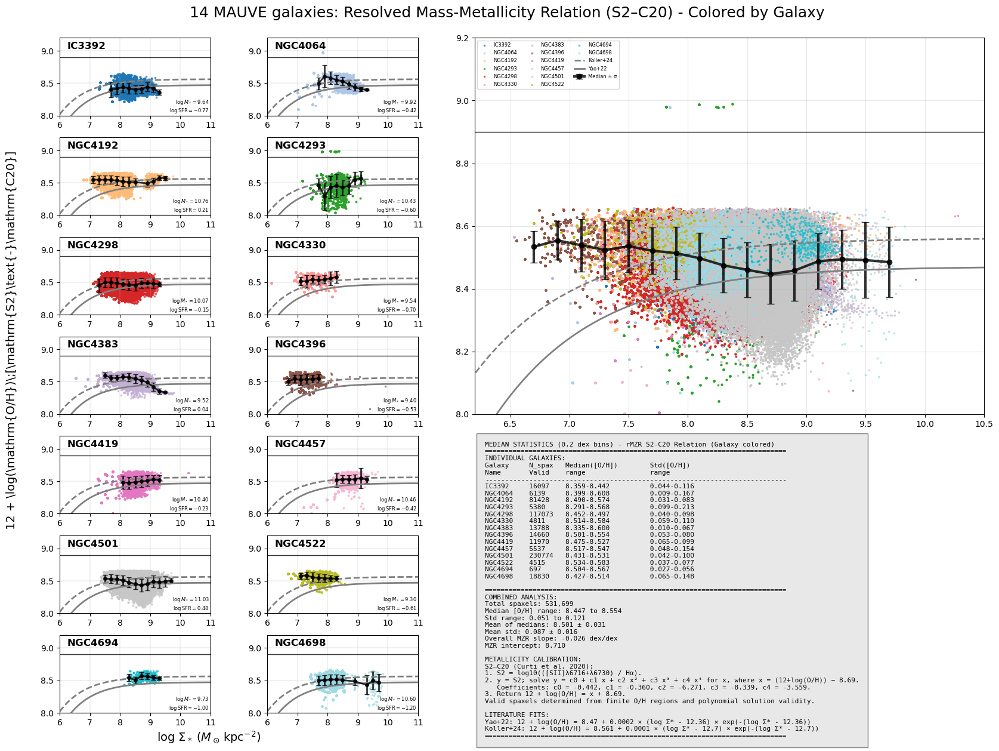

In [27]:
# ------------------------------------------------------------------
# COMPREHENSIVE LAYOUT: Individual galaxies + Combined plot + Statistics (rMZR S2-C20 Relation - Galaxy colored)
# 4-column layout: Cols 1-2 = Individual galaxies, Col 3 = Combined plot, Col 4 = Statistics
# ------------------------------------------------------------------
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from pathlib import Path
from astropy.io import fits
import itertools
import re  # Add this import for regex

# 0 · discover galaxies & colour palette
bins = sorted(Path('.').glob('*_SPATIAL_BINNING_maps_extended.fits'))
galaxies = [f.name.split('_')[0] for f in bins]
ngal = len(galaxies)
assert ngal <= 14, "This layout assumes ≤ 14 galaxies."

# Create distinct colors for each galaxy
galaxy_colors = plt.cm.tab20(np.linspace(0, 1, ngal))
galaxy_color_dict = dict(zip(galaxies, galaxy_colors))

def load_maps(gal):
    with fits.open(f'{gal}_SPATIAL_BINNING_maps_extended.fits') as h:
        sigM = h['LOGMASS_SURFACE_DENSITY'].data
    with fits.open(f'{gal}_gas_BIN_maps_extended.fits') as h:
        sigSFR        = h['LOGSFR_SURFACE_DENSITY_SF'].data
        hb4861_flux   = h['HB4861_FLUX_corr'].data
        oiii5006_flux = h['OIII5006_FLUX_corr'].data
        sii6716_flux  = h['SII6716_FLUX_corr'].data
        sii6730_flux  = h['SII6730_FLUX_corr'].data

        # --- Hα: try a few common extension names (kept minimal & robust) ---
        ha_key_candidates = (
            'HA6563_FLUX_corr', 'HA6562_FLUX_corr',
            'HALPHA6563_FLUX_corr', 'HALPHA_FLUX_corr'
        )
        ha6563_flux = None
        for k in ha_key_candidates:
            if k in h:
                ha6563_flux = h[k].data
                break
        if ha6563_flux is None:
            raise KeyError(f"No Hα flux HDU found for {gal}. Tried: {ha_key_candidates}")

        try:
            oh_d16_sf = h['O_H_D16_SF'].data
        except KeyError:
            oh_d16_sf = None
    return sigM, sigSFR, hb4861_flux, ha6563_flux, oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf

def calculate_s2_c20_metallicity(ha6563_flux,
                                 sii6716_flux, sii6730_flux,
                                 oh_d16_sf,
                                 coeffs=(-0.442, -0.360, -6.271, -8.339, -3.559)):
    """
    S2–C20 calibration (Curti+2020; user-provided coefficients):
      S2 = log10( ([SII]6716 + [SII]6730) / Hα )
      Let y = S2 and x = (12+log(O/H)) - 8.69
      Then: y = c0 + c1 x + c2 x^2 + c3 x^3 + c4 x^4
      Solve per spaxel for x, return 12+log(O/H) = x + 8.69

    Root selection (strict):
      • Collect all (near-)real roots.
      • Keep only roots with x ∈ [-0.7, 0.3].
      • If multiple, choose the smallest.
      • If none in range, discard spaxel (NaN).
      • No post-hoc clipping.
    """
    c0, c1, c2, c3, c4 = coeffs

    # Good spaxels: prefer finite O/H mask if present; enforce positive, finite fluxes
    if oh_d16_sf is not None:
        good_mask = np.isfinite(oh_d16_sf)
    else:
        good_mask = np.ones_like(ha6563_flux, dtype=bool)

    pos = (
        np.isfinite(ha6563_flux) & np.isfinite(sii6716_flux) & np.isfinite(sii6730_flux) &
        (ha6563_flux > 0) & (sii6716_flux > 0) & (sii6730_flux > 0)
    )
    good_mask &= pos

    oh_s2_c20 = np.full_like(ha6563_flux, np.nan, dtype=float)

    if np.any(good_mask):
        # S2 (linear inside the log): ([SII]6716+6730)/Hα
        s2_lin = (sii6716_flux[good_mask] + sii6730_flux[good_mask]) / ha6563_flux[good_mask]
        s2_lin = np.where(s2_lin > 0, s2_lin, np.nan)
        y = np.log10(s2_lin)

        idxs = np.argwhere(good_mask)

        REAL_ATOL = 1e-8  # accept roots with tiny imaginary part as real

        for (iy, ix), y_val in zip(idxs, y):
            if not np.isfinite(y_val):
                continue

            # Solve: c4*x^4 + c3*x^3 + c2*x^2 + c1*x + (c0 - y) = 0
            roots = np.roots([c4, c3, c2, c1, (c0 - y_val)])

            # Treat tiny-imag roots as real
            realish = roots[np.abs(roots.imag) <= REAL_ATOL].real
            if realish.size == 0:
                # fallback: least-imag root if imag part is still tiny-ish
                k = np.argmin(np.abs(roots.imag))
                if np.abs(roots[k].imag) <= 1e-6:
                    realish = np.array([roots[k].real])
                else:
                    continue  # no usable real roots

            # STRICT in-range selection: x ∈ [-0.7, 0.3]
            in_range = realish[(realish >= -0.7) & (realish <= 0.3)]
            if in_range.size == 0:
                continue  # discard spaxel if no valid root in range

            # If multiple, pick the smallest
            x_final = np.min(in_range)
            oh_s2_c20[iy, ix] = x_final + 8.69

    combined_mask = good_mask & np.isfinite(oh_s2_c20)
    return oh_s2_c20, combined_mask

# Extraction functions for log files
def extract_total_stellar_mass(galaxy_name):
    """Extract total stellar mass from mass log file. Returns log10(M☉) value or None if not found."""
    log_file = Path(f'mass_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total stellar mass \(R\)\s*:\s*([\d.-]+)\s*log10\(M☉\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading mass log for {galaxy_name}: {e}")
        return None

def extract_total_sfr(galaxy_name):
    """Extract total SFR from SFR log file. Returns log10(M☉/yr) value or None if not found."""
    log_file = Path(f'sfr_logs/{galaxy_name}.log')
    if not log_file.exists():
        return None
    try:
        with open(log_file, 'r') as f:
            content = f.read()
        pattern = r'Total Halpha SFR:.*?in log10 scale:\s*([\d.-]+)\s*log\(M☉/yr\)'
        match = re.search(pattern, content)
        return float(match.group(1)) if match else None
    except Exception as e:
        print(f"Error reading SFR log for {galaxy_name}: {e}")
        return None

def calculate_median_statistics(x, y, x_range=(6, 11), bin_width=0.2):
    """Calculate median and std in binned intervals"""
    x_bins = np.arange(x_range[0], x_range[1] + bin_width, bin_width)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2

    medians = []
    stds = []
    x_valid = []

    for i in range(len(x_bins) - 1):
        mask = (x >= x_bins[i]) & (x < x_bins[i + 1])
        if len(np.unique(x[mask])) >= 10:  # Need at least 10 distinct x values
            y_bin = y[mask]
            medians.append(np.median(y_bin))
            stds.append(np.std(y_bin))
            x_valid.append(x_centers[i])

    return np.array(x_valid), np.array(medians), np.array(stds)

def plot_literature_mzr_fits(ax, show_legend=False):
    """Plot literature MZR fits on the given axis"""
    # Define x range for plotting literature fits
    x = np.linspace(6, 11, 100)

    # Yao+22
    # 12 + log(O/H) = a + b(log Σ* - c)e^(-(x-c))
    # Coefficients: a = 8.47, b = 0.0002, c = 12.36
    a1, b1, c1 = 8.47, 0.0002, 12.36
    y_yao22 = a1 + b1 * (x - c1) * np.exp(-(x - c1))

    # Koller+24
    # 12 + log(O/H) = a + b(log Σ* - c)exp(-(log Σ* - c))
    # Coefficients: a = 8.561, b = 0.0001, c = 12.7
    a2, b2, c2 = 8.561, 0.0001, 12.7
    y_koller24 = a2 + b2 * (x - c2) * np.exp(-(x - c2))

    # MZR literature data
    plot_data = [
        (y_koller24, 'Koller+24', '--'),
        (y_yao22, 'Yao+22', '-'),
    ]

    # Plot all literature fits
    colors = plt.cm.tab20(np.linspace(0, 1, len(plot_data)))
    for i, (y, label, linestyle) in enumerate(plot_data):
        if show_legend:
            ax.plot(x, y, label=label, linewidth=2, linestyle=linestyle, color='gray')
        else:
            ax.plot(x, y, linewidth=2, linestyle=linestyle, color='gray')

# 1 · Create comprehensive figure with 4-column layout
fig = plt.figure(figsize=(20, 16))
gs = GridSpec(nrows=8, ncols=4, figure=fig,
              width_ratios=[1, 1, 1.5, 1.5],  # Cols 3&4 slightly wider
              height_ratios=[0.5, 1, 1, 1, 1, 1, 1, 1],  # Row 0 for colorbar
              wspace=0.3, hspace=0.3)

plot_idx = 0
individual_stats = []

# COLUMNS 1-2: Individual galaxy plots
for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, ha6563_flux, oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf = load_maps(gal)
    oh_s2_c20, good_mask = calculate_s2_c20_metallicity(
        ha6563_flux, sii6716_flux, sii6730_flux, oh_d16_sf
    )

    if not np.any(good_mask):
        print(f"Skipping {gal}: no valid data points")
        continue

    row = (plot_idx // 2) + 1  # Start from row 1 (row 0 for colorbar)
    col = plot_idx % 2
    plot_idx += 1

    axP = fig.add_subplot(gs[row, col])

    x_data, y_data, sfr_data = sigM[good_mask], oh_s2_c20[good_mask], sigSFR[good_mask]

    # Calculate median statistics
    x_median, y_median, y_std = calculate_median_statistics(x_data, y_data)
    individual_stats.append((gal, x_median, y_median, y_std, len(x_data)))

    # Scatter plot colored by galaxy
    axP.scatter(x_data, y_data, c=galaxy_color_dict[gal], s=1, alpha=0.6, marker=',')

    # Plot median with error bars
    if len(x_median) > 0:
        axP.errorbar(x_median, y_median, yerr=y_std, fmt='ko-', linewidth=2,
                     markersize=4, capsize=3, alpha=0.8)

    # Add literature fits to individual panels (no legend)
    plot_literature_mzr_fits(axP, show_legend=False)

    # Add galaxy name in top left corner
    axP.text(0.05, 0.95, gal, transform=axP.transAxes, fontsize=12, fontweight='bold',
             va='top', ha='left', bbox=dict(boxstyle='round,pad=0.3', facecolor='none', alpha=0.8, edgecolor='none'))

    # Bottom right: total stellar mass and SFR from log files
    total_mass = extract_total_stellar_mass(gal)
    total_sfr = extract_total_sfr(gal)

    if total_mass is not None and total_sfr is not None:
        log_text = fr'$\log M_* = {total_mass:.2f}$' '\n' fr'$\log \mathrm{{SFR}} = {total_sfr:.2f}$'
        axP.text(0.99, 0.01, log_text,
                 transform=axP.transAxes, va='bottom', ha='right', fontsize=6,
                 bbox=dict(facecolor='none', alpha=0.8, edgecolor='none', pad=2))

    axP.set_xlim(6, 11)
    axP.set_ylim(8.0, 9.2)  # Same y-axis range as reference D16 MZR
    axP.grid(True, lw=0.25)
    axP.axhline(y=8.9, color='black', linestyle='-', linewidth=1, alpha=0.8)      # For individual plots

# COLUMNS 3-4: Combined plot - Upper panel
ax_combined = fig.add_subplot(gs[1:5, 2:4])  # Spans rows 1-4, columns 2-3

# Collect all data for combined analysis
all_x, all_y, all_gal_ids = [], [], []
galaxy_counts = {}

for idx, gal in enumerate(galaxies):
    sigM, sigSFR, hb4861_flux, ha6563_flux, oiii5006_flux, sii6716_flux, sii6730_flux, oh_d16_sf = load_maps(gal)
    oh_s2_c20, good_mask = calculate_s2_c20_metallicity(
        ha6563_flux, sii6716_flux, sii6730_flux, oh_d16_sf
    )

    if np.any(good_mask):
        x_data, y_data = sigM[good_mask], oh_s2_c20[good_mask]
        all_x.extend(x_data)
        all_y.extend(y_data)
        all_gal_ids.extend([idx] * len(x_data))  # Store galaxy index for coloring
        galaxy_counts[gal] = len(x_data)
    else:
        galaxy_counts[gal] = 0

all_x, all_y, all_gal_ids = np.array(all_x), np.array(all_y), np.array(all_gal_ids)

# Calculate combined median statistics
x_median_combined, y_median_combined, y_std_combined = calculate_median_statistics(all_x, all_y)

# Scatter plot colored by galaxy for combined data
for idx, gal in enumerate(galaxies):
    mask = all_gal_ids == idx
    if np.any(mask):
        ax_combined.scatter(all_x[mask], all_y[mask], c=galaxy_color_dict[gal],
                            s=1, alpha=0.6, marker=',', label=gal)

# Plot combined median with error bars
if len(x_median_combined) > 0:
    ax_combined.errorbar(x_median_combined, y_median_combined, yerr=y_std_combined,
                         fmt='ko-', linewidth=3, markersize=6, capsize=4, alpha=0.8, label='Median ± σ')

# Add literature fits to combined panel (with legend)
plot_literature_mzr_fits(ax_combined, show_legend=True)

# Add legend with small font - only show galaxies
ax_combined.legend(fontsize=6, ncol=3, loc='upper left', markerscale=1)

ax_combined.set_xlim(6.2, 10.5)
ax_combined.set_ylim(8.0, 9.2)  # Same y-axis range as reference D16 MZR
ax_combined.grid(True, alpha=0.3)
ax_combined.axhline(y=8.9, color='black', linestyle='-', linewidth=1, alpha=0.8)  # For combined plot

# COLUMNS 3-4: Statistics table - Lower panel
ax_stats = fig.add_subplot(gs[5:8, 2:4])  # Spans rows 5-7, columns 2-3
ax_stats.axis('off')

# Create comprehensive statistics text
stats_table = "MEDIAN STATISTICS (0.2 dex bins) - rMZR S2-C20 Relation (Galaxy colored)\n"
stats_table += "="*75 + "\n"
stats_table += "INDIVIDUAL GALAXIES:\n"
stats_table += f"{'Galaxy':<10} {'N_spax':<8} {'Median([O/H])':<20} {'Std([O/H])':<15}\n"
stats_table += f"{'Name':<10} {'Valid':<8} {'range':<20} {'range':<15}\n"
stats_table += "-"*75 + "\n"

for gal, x_median, y_median, y_std, n_spax in individual_stats:
    if len(y_median) > 0:
        median_range = f"{y_median.min():.3f}-{y_median.max():.3f}"
        std_range = f"{y_std.min():.3f}-{y_std.max():.3f}"
    else:
        median_range = "N/A"
        std_range = "N/A"
    stats_table += f"{gal:<10} {n_spax:<8} {median_range:<20} {std_range:<15}\n"

stats_table += "\n" + "="*75 + "\n"
stats_table += "COMBINED ANALYSIS:\n"
stats_table += f"Total spaxels: {len(all_x):,}\n"
if len(y_median_combined) > 0:
    stats_table += f"Median [O/H] range: {y_median_combined.min():.3f} to {y_median_combined.max():.3f}\n"
    stats_table += f"Std range: {y_std_combined.min():.3f} to {y_std_combined.max():.3f}\n"
    stats_table += f"Mean of medians: {np.mean(y_median_combined):.3f} ± {np.std(y_median_combined):.3f}\n"
    stats_table += f"Mean std: {np.mean(y_std_combined):.3f} ± {np.std(y_std_combined):.3f}\n"

    # Overall MZR gradient (slope)
    if len(x_median_combined) > 3:
        slope, intercept = np.polyfit(x_median_combined, y_median_combined, 1)
        stats_table += f"Overall MZR slope: {slope:.3f} dex/dex\n"
        stats_table += f"MZR intercept: {intercept:.3f}\n"

stats_table += "\nMETALLICITY CALIBRATION:\n"
stats_table += "S2–C20 (Curti et al. 2020):\n"
stats_table += "1. S2 = log10(([SII]λ6716+λ6730) / Hα).\n"
stats_table += "2. y = S2; solve y = c0 + c1 x + c2 x² + c3 x³ + c4 x⁴ for x, where x = (12+log(O/H)) − 8.69.\n"
stats_table += "   Coefficients: c0 = -0.442, c1 = -0.360, c2 = -6.271, c3 = -8.339, c4 = -3.559.\n"
stats_table += "3. Return 12 + log(O/H) = x + 8.69.\n"
stats_table += "Valid spaxels determined from finite O/H regions and polynomial solution validity.\n"

stats_table += "\nLITERATURE FITS:\n"
stats_table += "Yao+22: 12 + log(O/H) = 8.47 + 0.0002 × (log Σ* - 12.36) × exp(-(log Σ* - 12.36))\n"
stats_table += "Koller+24: 12 + log(O/H) = 8.561 + 0.0001 × (log Σ* - 12.7) × exp(-(log Σ* - 12.7))\n"
stats_table += "="*75

ax_stats.text(0.02, 0.98, stats_table, transform=ax_stats.transAxes, va='top', ha='left',
              fontsize=8, family='monospace',
              bbox=dict(facecolor='lightgray', alpha=0.5, edgecolor='black', pad=10))

# Global title and labels
fig.suptitle(fr'{ngal} MAUVE galaxies: Resolved Mass-Metallicity Relation (S2–C20) - Colored by Galaxy',
             fontsize=18, y=0.85)

# Shared axis labels
fig.text(0.25, 0.08, r'$\log\,\Sigma_* \; (M_\odot\,\mathrm{kpc}^{-2})$',
         ha='center', fontsize=14)
fig.text(0.08, 0.5, r'12 + \log(\mathrm{O/H})\;[\mathrm{S2}\text{-}\mathrm{C20}]',
         va='center', rotation='vertical', fontsize=14)

plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.9])
plt.show()
